# Analyzing NYC's 311 Street Flooding Complaints from 2010 to 2020

Mark Bauer

# Goal
In this notebook, we analyze NYC's 311 Street Flooding Complaints data from 2010 to 2020. Specifically, I attempt to answer the following questions:
- Where street flooding complaints are located, and 
- Street flooding complaints over time.

# Main Python Libraries:
[pandas](https://pandas.pydata.org/) is a fast, powerful, flexible and easy to use open source data analysis and manipulation tool, built on top of the Python programming language.

[GeoPandas](https://geopandas.org/index.html) is an open source project to make working with geospatial data in python easier. GeoPandas extends the datatypes used by pandas to allow spatial operations on geometric types. Geometric operations are performed by shapely. Geopandas further depends on fiona for file access and descartes and matplotlib for plotting.

[Matplotlib](https://matplotlib.org/3.1.1/index.html#) is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms.

[Seaborn](https://seaborn.pydata.org/index.html) is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

[geoplot](https://residentmario.github.io/geoplot/index.html#) is a high-level Python geospatial plotting library. It’s an extension to cartopy and matplotlib which makes mapping easy: like seaborn for geospatial.

# Datasets

## 1) 311 Service Requests from 2010 to Present  
Website: https://data.cityofnewyork.us/Social-Services/311-Service-Requests-from-2010-to-Present/erm2-nwe9

311's data dictionary can be found in the data folder. 



![311](images/nyc-311-screenshot.png)

## 2) Neighborhood Tabulation Areas (NTA)  
Website: https://data.cityofnewyork.us/City-Government/Neighborhood-Tabulation-Areas-NTA-/cpf4-rkhq

![nta](images/nyc-nta-screenshot.png)

Table of Contents
=================

   * [1. Importing Libraries](#1-Importing-Libraries)
       
       
   * [2. Loading Data](#2-Loading-Data)
       
       
   * [3. Data Inspection](#3-Data-Inspection)
       * [3.1 Basic Data Inspection](#31-Basic-Data-Inspection)
       * [3.2 Calculating Summary Statistics](#32-Calculating-Summary-Statistics)
       * [3.3 Identifying Null/NA Values](#33-Identifying-Null/NA-Values)
   
   
   * [4. Data Wrangling](#4-Data-Wrangling)
       * [4.1 Converting date column to Python's datetime64[ns] data type](#41-Converting-date-column-to-Pythons-datetime64[ns]-data-type)
       * [4.2 Dropping null values in our x, y coordinate columns](#42-Dropping-null-values-in-our-x-y-coordinate-columns)
       * [4.3 Creating a GeoDataframe from x,y coordinates](#43-Creating-a-GeoDataframe-from-x-y-coordinates)
       

   * [5. Mapping](#5-Mapping)
       * [5.1 Citywide](#51-Citywide)
       * [5.2 By Borough](#52-By-Borough)
       * [5.3 Bar Charts by Neighborhood Tabulation Areas (NTA)](#53-Bar-Charts-by-Neighborhood-Tabulation-Areas-(NTA))

      
   * [6. Time Series Analysis](#6-Time-Series-Analysis)
       * [6.1 By Year and Borough](#61-By-Year-and-Borough)
       * [6.2 Frequencies](#62-Frequencies)
       * [6.3 Resampling](#63-Resampling)
       * [6.4 Seasonality](#64-Seasonality)
       * [6.5 Resampling for Frequency Average](#65-Resampling-for-Frequency-Average)
       * [6.6 Rolling Averages](66-Rolling-Averages)
       * [6.7 Additional Time Series Analysis](#67-Additional-Time-Series-Analysis)
   
          
   * [7. Anomoly Detection](#7-Anomoly-Detection)
   
          
   * [8. Manually Formatting Date Tick Labels](#8-Manually-Formatting-Date-Tick-Labels)
   
   
   * [9. Timedelta of Complaints](#9-Timedelta-of-Complaints)
   
          
   * [10. Conclusion](#10-Conclusion)

# 1. Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import geopandas as gpd
import fiona
from fiona.crs import from_epsg
import geoplot
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.dates as mdates
from matplotlib.ticker import FuncFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.rcParams['savefig.facecolor'] = 'white'
%matplotlib inline

Printing verions of Python modules and packages with **watermark** - the IPython magic extension.

In [2]:
%load_ext watermark

In [3]:
%watermark -v -p numpy,pandas,geopandas,geoplot,fiona,matplotlib.pyplot,seaborn

CPython 3.7.1
IPython 7.18.1

numpy 1.19.2
pandas 1.0.0
geopandas 0.8.1
geoplot 0.4.0
fiona 1.8.13.post1
matplotlib.pyplot 3.3.2
seaborn 0.11.0


Documention for installing watermark: https://github.com/rasbt/watermark

# 2. Loading Data

In [4]:
# list items in data folder
%ls data/

311-flooding-data.csv             streets_clipped.json
311_SR_Data_Dictionary_2018.xlsx


In [5]:
# read data as a dataframe
flooding_311 = pd.read_csv('data/311-flooding-data.csv')

# previewing first five rows in data
print(flooding_311.shape)
flooding_311.head()

(27817, 34)


/Users/geribauer/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (32) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,incident_address,street_name,...,park_facility_name,park_borough,latitude,longitude,location,intersection_street_1,intersection_street_2,location_type,due_date,landmark
0,40140533,2018-08-29T08:35:00.000,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.0,NaN,NaN,...,Unspecified,MANHATTAN,40.863021,-73.917557,"{'latitude': '40.8630205', 'longitude': '-73.9...",WEST 206 STREET,9 AVENUE,NaN,NaN,NaN
1,40141782,2018-08-29T10:29:00.000,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.0,2468 EAST 27 STREET,EAST 27 STREET,...,Unspecified,BROOKLYN,40.592140,-73.943240,"{'latitude': '40.5921398', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN
2,40143144,2018-08-29T18:36:00.000,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.0,2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,...,Unspecified,BRONX,40.864814,-73.892048,"{'latitude': '40.8648137', 'longitude': '-73.8...",NaN,NaN,NaN,NaN,NaN
3,40145580,2018-08-30T14:58:00.000,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.0,1701 59 STREET,59 STREET,...,Unspecified,BROOKLYN,40.623757,-73.988545,"{'latitude': '40.6237568', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN
4,40148030,2018-08-30T19:37:00.000,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.0,103 PINE STREET,PINE STREET,...,Unspecified,BROOKLYN,40.684147,-73.873386,"{'latitude': '40.684147', 'longitude': '-73.87...",NaN,NaN,NaN,NaN,NaN


In [6]:
# previewing the last five rows of our dataframe
flooding_311.tail()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,incident_address,street_name,...,park_facility_name,park_borough,latitude,longitude,location,intersection_street_1,intersection_street_2,location_type,due_date,landmark
27812,40117057,2018-08-27T13:20:00.000,2018-08-28T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11360.0,28-29 CLEARVIEW EXPRESSWAY,CLEARVIEW EXPRESSWAY,...,Unspecified,QUEENS,40.773142,-73.783801,"{'latitude': '40.7731415', 'longitude': '-73.7...",NaN,NaN,NaN,NaN,NaN
27813,40126539,2018-08-28T23:04:00.000,2018-09-17T09:20:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10039.0,157 WEST 147 STREET,WEST 147 STREET,...,Unspecified,MANHATTAN,40.822499,-73.937078,"{'latitude': '40.822499', 'longitude': '-73.93...",NaN,NaN,NaN,NaN,NaN
27814,40127389,2018-08-28T16:15:00.000,2018-09-13T11:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11418.0,85 AVENUE,85 AVENUE,...,Unspecified,QUEENS,40.699478,-73.841918,"{'latitude': '40.6994785', 'longitude': '-73.8...",NaN,NaN,NaN,NaN,NaN
27815,40130007,2018-08-28T23:17:00.000,2018-08-29T11:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10452.0,NaN,NaN,...,Unspecified,BRONX,40.842464,-73.924135,"{'latitude': '40.8424645', 'longitude': '-73.9...",OGDEN AVENUE,WEST 171 STREET,NaN,NaN,NaN
27816,40135555,2018-08-29T13:10:00.000,2018-09-17T10:20:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10029.0,NaN,NaN,...,Unspecified,MANHATTAN,40.793552,-73.945325,"{'latitude': '40.7935518', 'longitude': '-73.9...",EAST 108 STREET,LEXINGTON AVENUE,NaN,NaN,NaN


# 3. Data Inspection

## 3.1 Basic Data Inspection

In [7]:
# the object's type
type(flooding_311)

pandas.core.frame.DataFrame

In [8]:
# printing the columns of our dataframe
flooding_311.columns

Index(['unique_key', 'created_date', 'closed_date', 'agency', 'agency_name',
       'complaint_type', 'descriptor', 'incident_zip', 'incident_address',
       'street_name', 'cross_street_1', 'cross_street_2', 'address_type',
       'city', 'facility_type', 'status', 'resolution_description',
       'resolution_action_updated_date', 'community_board', 'bbl', 'borough',
       'x_coordinate_state_plane', 'y_coordinate_state_plane',
       'open_data_channel_type', 'park_facility_name', 'park_borough',
       'latitude', 'longitude', 'location', 'intersection_street_1',
       'intersection_street_2', 'location_type', 'due_date', 'landmark'],
      dtype='object')

In [9]:
# printing the data types of our columns
flooding_311.dtypes

unique_key                          int64
created_date                       object
closed_date                        object
agency                             object
agency_name                        object
complaint_type                     object
descriptor                         object
incident_zip                      float64
incident_address                   object
street_name                        object
cross_street_1                     object
cross_street_2                     object
address_type                       object
city                               object
facility_type                     float64
status                             object
resolution_description             object
resolution_action_updated_date     object
community_board                    object
bbl                               float64
borough                            object
x_coordinate_state_plane          float64
y_coordinate_state_plane          float64
open_data_channel_type            

In [10]:
# printing the column names, non-null counts, and data types of our columns
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27817 entries, 0 to 27816
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   unique_key                      27817 non-null  int64  
 1   created_date                    27817 non-null  object 
 2   closed_date                     27803 non-null  object 
 3   agency                          27817 non-null  object 
 4   agency_name                     27817 non-null  object 
 5   complaint_type                  27817 non-null  object 
 6   descriptor                      27817 non-null  object 
 7   incident_zip                    26960 non-null  float64
 8   incident_address                17798 non-null  object 
 9   street_name                     17798 non-null  object 
 10  cross_street_1                  24077 non-null  object 
 11  cross_street_2                  24066 non-null  object 
 12  address_type                    

In [11]:
# printing the columns of our dataframe
flooding_311.columns

Index(['unique_key', 'created_date', 'closed_date', 'agency', 'agency_name',
       'complaint_type', 'descriptor', 'incident_zip', 'incident_address',
       'street_name', 'cross_street_1', 'cross_street_2', 'address_type',
       'city', 'facility_type', 'status', 'resolution_description',
       'resolution_action_updated_date', 'community_board', 'bbl', 'borough',
       'x_coordinate_state_plane', 'y_coordinate_state_plane',
       'open_data_channel_type', 'park_facility_name', 'park_borough',
       'latitude', 'longitude', 'location', 'intersection_street_1',
       'intersection_street_2', 'location_type', 'due_date', 'landmark'],
      dtype='object')

In [12]:
flooding_311 = flooding_311[['unique_key', 'created_date', 'closed_date', 'agency', 'agency_name',
                           'complaint_type', 'descriptor', 'incident_zip', 'intersection_street_1',
                           'intersection_street_2', 'address_type', 'city', 'status',
                           'resolution_description', 'resolution_action_updated_date',
                           'community_board', 'borough', 'x_coordinate_state_plane',
                           'y_coordinate_state_plane', 'open_data_channel_type',
                           'park_facility_name', 'park_borough', 'latitude', 'longitude',
                           'location', 'incident_address', 'street_name', 'cross_street_1',
                           'cross_street_2', 'bbl']]

In [13]:
# printing the column names, non-null counts, and data types of our columns
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27817 entries, 0 to 27816
Data columns (total 30 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   unique_key                      27817 non-null  int64  
 1   created_date                    27817 non-null  object 
 2   closed_date                     27803 non-null  object 
 3   agency                          27817 non-null  object 
 4   agency_name                     27817 non-null  object 
 5   complaint_type                  27817 non-null  object 
 6   descriptor                      27817 non-null  object 
 7   incident_zip                    26960 non-null  float64
 8   intersection_street_1           10076 non-null  object 
 9   intersection_street_2           10076 non-null  object 
 10  address_type                    27811 non-null  object 
 11  city                            26961 non-null  object 
 12  status                          

In [14]:
# counts of unique values of our datatypes 
flooding_311.dtypes.value_counts()

object     23
float64     6
int64       1
dtype: int64

In [15]:
# printing index type
flooding_311.index

RangeIndex(start=0, stop=27817, step=1)

In [16]:
cols_unique = flooding_311.columns

print('Inpecting data for unique columns (True/False)\n' + \
     ('-' * 46))

for i in cols_unique:
    print(str(i) + ':', flooding_311[i].is_unique)

Inpecting data for unique columns (True/False)
----------------------------------------------
unique_key: True
created_date: False
closed_date: False
agency: False
agency_name: False
complaint_type: False
descriptor: False
incident_zip: False
intersection_street_1: False
intersection_street_2: False
address_type: False
city: False
status: False
resolution_description: False
resolution_action_updated_date: False
community_board: False
borough: False
x_coordinate_state_plane: False
y_coordinate_state_plane: False
open_data_channel_type: False
park_facility_name: False
park_borough: False
latitude: False
longitude: False
location: False
incident_address: False
street_name: False
cross_street_1: False
cross_street_2: False
bbl: False


In [17]:
# printing True/False if column is unique on our unique key (DOITT_ID)
flooding_311['unique_key'].is_unique

True

In [18]:
# printing descriptive statistics of our numeric columns in our data
all_columns = flooding_311.columns
flooding_311[all_columns].astype(str).describe(include='all')[:2].T.sort_values(by='unique', 
                                                                                ascending=False)

,count,unique
unique_key,27817,27817
created_date,27817,26310
closed_date,27817,25329
resolution_action_updated_date,27817,25326
location,27817,15854
longitude,27817,15771
latitude,27817,15769
x_coordinate_state_plane,27817,15640
y_coordinate_state_plane,27817,15595
incident_address,27817,12406


In [19]:
flooding_311['descriptor'].value_counts()

Street Flooding (SJ)    27817
Name: descriptor, dtype: int64

In [20]:
flooding_311['agency'].value_counts()

DEP    27817
Name: agency, dtype: int64

In [21]:
flooding_311['agency_name'].value_counts()

Department of Environmental Protection    27817
Name: agency_name, dtype: int64

In [22]:
flooding_311['complaint_type'].value_counts()

Sewer    27817
Name: complaint_type, dtype: int64

In [23]:
flooding_311['status'].value_counts()

Closed      27798
Started         8
Open            5
Pending         4
Assigned        2
Name: status, dtype: int64

In [24]:
flooding_311['resolution_description'].value_counts().reset_index().head()

,index,resolution_description
0,The Department of Environment Protection inspe...,11512
1,The Department of Environmental Protection has...,4026
2,The Department of Environmental Protection ins...,3494
3,The Department of Environmental Protection inv...,2912
4,The Department of Environmental Protection ins...,1270


In [25]:
print('Top 10 Resolution Descriptions in Descending Order:\n')

for i in range(10):
    print(str(i + 1) + '.', \
          flooding_311['resolution_description'].value_counts().index[i], \
          '\nCount: ' \
          f"{flooding_311['resolution_description'].value_counts()[i]:,}" + \
          '\n')

Top 10 Resolution Descriptions in Descending Order:

1. The Department of Environment Protection inspected your complaint but could not find the problem you reported. If the condition persists, please call 311 (or 212-639-9675 if calling from a non-New York City area code) with more detailed information to submit a new complaint. 
Count: 11,512

2. The Department of Environmental Protection has determined that this issue was previously reported by another customer The original complaint is being addressed. If the condition persists, please call 311 (or 212-639-9675 if calling from a non-New York City area code) to submit a new complaint. 
Count: 4,026

3. The Department of Environmental Protection inspected your complaint and referred it to the Department of Transportation for further action. If the problem persists, please call 311 (or 212-639-9675 if calling from a non-New York City area code) to submit a new complaint. 
Count: 3,494

4. The Department of Environmental Protection inv

In [26]:
flooding_311.created_date.min()

'2010-01-02T08:26:00.000'

In [27]:
flooding_311.created_date.max()

'2020-12-24T23:38:00.000'

In [28]:
print('This dataset is from', \
      flooding_311.created_date.min()[0:10], \
      'to', \
      flooding_311.created_date.max()[0:10] + \
      '.')

This dataset is from 2010-01-02 to 2020-12-24.


## 3.2 Calcualting Summary Statistics

In [29]:
# display floats up to three decimals
pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [30]:
# printing descriptive statistics of our numeric columns in our data
flooding_311.describe()

,unique_key,incident_zip,x_coordinate_state_plane,y_coordinate_state_plane,latitude,longitude,bbl
count,27817.00,26960.00,26874.00,26874.00,24375.00,24375.00,16100.00
mean,32385528.06,10969.14,1005486.39,186158.61,40.68,-73.92,3699657259.46
std,9159023.53,536.37,35054.99,30561.97,0.08,0.13,1076114418.66
min,15639934.00,10001.00,913357.00,121032.00,40.50,-74.25,0.00
25%,24287886.00,10312.00,986863.00,161248.00,40.61,-73.99,3060425042.25
50%,32721342.00,11220.00,1007473.00,183604.50,40.67,-73.92,4068113769.00
75%,40375197.00,11385.00,1033967.00,206449.75,40.73,-73.82,4156282523.75
max,48490079.00,11697.00,1067279.00,271876.00,40.91,-73.70,5080500078.00


In [31]:
flooding_311.describe(include=['O']).T

,count,unique,top,freq
created_date,27817,26310,2011-08-28T00:00:00.000,13
closed_date,27803,25328,2017-05-06T08:30:00.000,36
agency,27817,1,DEP,27817
agency_name,27817,1,Department of Environmental Protection,27817
complaint_type,27817,1,Sewer,27817
descriptor,27817,1,Street Flooding (SJ),27817
intersection_street_1,10076,2819,BROADWAY,98
intersection_street_2,10076,2839,BROADWAY,169
address_type,27811,3,ADDRESS,16670
city,26961,87,BROOKLYN,6955


In [32]:
# printing descriptive statistics of our numeric columns in our data
flooding_311.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
unique_key,27817.00,NaN,NaN,NaN,32385528.06,9159023.53,15639934.00,24287886.00,32721342.00,40375197.00,48490079.00
created_date,27817,26310,2011-08-28T00:00:00.000,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
closed_date,27803,25328,2017-05-06T08:30:00.000,36,NaN,NaN,NaN,NaN,NaN,NaN,NaN
agency,27817,1,DEP,27817,NaN,NaN,NaN,NaN,NaN,NaN,NaN
agency_name,27817,1,Department of Environmental Protection,27817,NaN,NaN,NaN,NaN,NaN,NaN,NaN
complaint_type,27817,1,Sewer,27817,NaN,NaN,NaN,NaN,NaN,NaN,NaN
descriptor,27817,1,Street Flooding (SJ),27817,NaN,NaN,NaN,NaN,NaN,NaN,NaN
incident_zip,26960.00,NaN,NaN,NaN,10969.14,536.37,10001.00,10312.00,11220.00,11385.00,11697.00
intersection_street_1,10076,2819,BROADWAY,98,NaN,NaN,NaN,NaN,NaN,NaN,NaN
intersection_street_2,10076,2839,BROADWAY,169,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
# returning the mode of our numeric columns (excluding our unique key = 'DOITT_ID') as 'mode'
mode = flooding_311.loc[:, flooding_311.columns != 'unique_key'].mode(numeric_only=False)

# renaming index to 'mode'
mode.rename(index={0: "mode"}, inplace=True)
mode

,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,address_type,...,park_facility_name,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl
mode,2011-08-28T00:00:00.000,2017-05-06T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10306.00,BROADWAY,BROADWAY,ADDRESS,...,Unspecified,QUEENS,40.68,-73.74,"{'latitude': '40.676373', 'longitude': '-73.73...",133-25 FRANCIS LEWIS BOULEVARD,BROADWAY,BEND,DEAD END,4129700015.00


In [34]:
# transposing and printing the mode ofour numeric columns (excluding our unique key = 'DOITT_ID')
mode.T

,mode
created_date,2011-08-28T00:00:00.000
closed_date,2017-05-06T08:30:00.000
agency,DEP
agency_name,Department of Environmental Protection
complaint_type,Sewer
descriptor,Street Flooding (SJ)
incident_zip,10306.00
intersection_street_1,BROADWAY
intersection_street_2,BROADWAY
address_type,ADDRESS


In [35]:
flooding_311.iloc[:, -5:].head()

,incident_address,street_name,cross_street_1,cross_street_2,bbl
0,NaN,NaN,NaN,NaN,nan
1,2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00
2,2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00
3,1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00
4,103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00


In [36]:
flooding_311.iloc[:, -5:].describe(include=['O']).T

,count,unique,top,freq
incident_address,17798,12405,133-25 FRANCIS LEWIS BOULEVARD,59
street_name,17798,4091,BROADWAY,116
cross_street_1,24077,4607,BEND,340
cross_street_2,24066,4684,DEAD END,491


In [37]:
# compute pairwise correlation of columns, excluding NA/null values
flooding_311.corr()

,unique_key,incident_zip,x_coordinate_state_plane,y_coordinate_state_plane,latitude,longitude,bbl
unique_key,1.00,0.03,0.02,0.03,0.04,0.02,-0.03
incident_zip,0.03,1.00,0.71,-0.10,-0.10,0.70,0.13
x_coordinate_state_plane,0.02,0.71,1.00,0.46,0.46,1.00,-0.20
y_coordinate_state_plane,0.03,-0.10,0.46,1.00,1.00,0.46,-0.58
latitude,0.04,-0.10,0.46,1.00,1.00,0.46,-0.58
longitude,0.02,0.70,1.00,0.46,0.46,1.00,-0.20
bbl,-0.03,0.13,-0.20,-0.58,-0.58,-0.20,1.00


<AxesSubplot:>

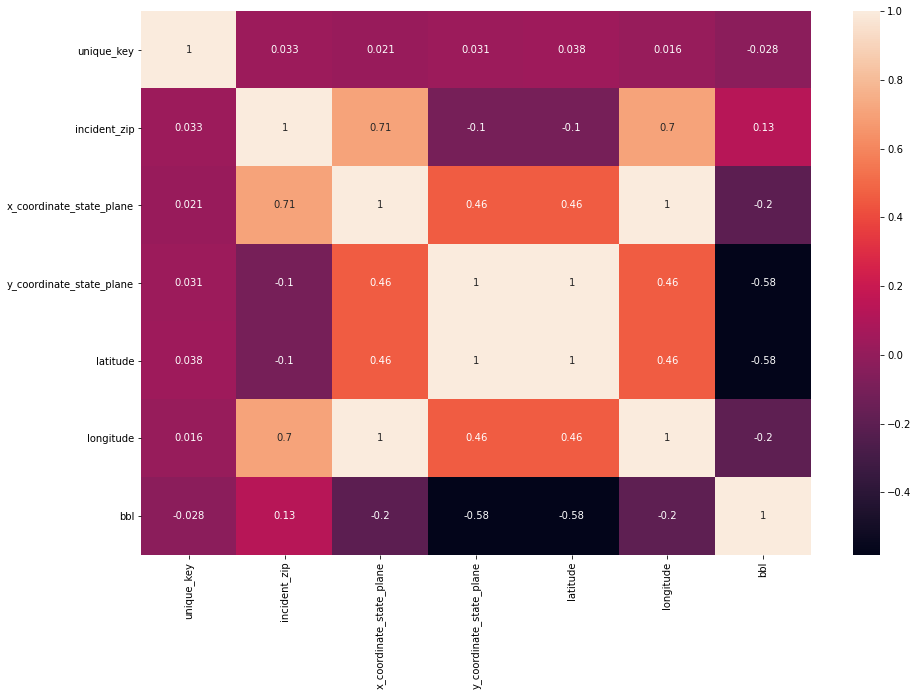

In [38]:
fig, ax = plt.subplots(figsize=(15,10))

sns.heatmap(flooding_311.corr(), 
            annot=True, 
            ax=ax)

## 3.3 Identifying Null/NA Values

In [39]:
print('Sum of nulls in column:')
flooding_311.isna().sum().sort_values(ascending=False)

Sum of nulls in column:


intersection_street_1             17741
intersection_street_2             17741
bbl                               11717
street_name                       10019
incident_address                  10019
cross_street_2                     3751
cross_street_1                     3740
location                           3442
longitude                          3442
latitude                           3442
y_coordinate_state_plane            943
x_coordinate_state_plane            943
incident_zip                        857
city                                856
closed_date                          14
resolution_description               12
address_type                          6
resolution_action_updated_date        5
status                                0
community_board                       0
borough                               0
open_data_channel_type                0
park_facility_name                    0
descriptor                            0
complaint_type                        0


In [40]:
print('Sum of nulls in all columns:')
flooding_311.isna().sum().sum()

Sum of nulls in all columns:


88690

In [41]:
print('Identifying nulls in column (True/False):')
flooding_311.isna().head()

Identifying nulls in column (True/False):


,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_facility_name,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,True,True,True,True
1,False,False,False,False,False,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False


In [42]:
print('Identifying any null values in column (True/False):')
flooding_311.isna().any().sort_values(ascending=False)

Identifying any null values in column (True/False):


bbl                                True
y_coordinate_state_plane           True
closed_date                        True
incident_zip                       True
intersection_street_1              True
intersection_street_2              True
address_type                       True
city                               True
resolution_description             True
cross_street_2                     True
x_coordinate_state_plane           True
resolution_action_updated_date     True
incident_address                   True
cross_street_1                     True
latitude                           True
longitude                          True
location                           True
street_name                        True
descriptor                        False
created_date                      False
agency                            False
agency_name                       False
complaint_type                    False
open_data_channel_type            False
borough                           False


In [43]:
# return a boolean same-sized object indicating if any of the values are NA
flooding_311.isna().any().value_counts()

True     18
False    12
dtype: int64

In [44]:
# return descriptive statistics of boolean indicating if any of the values are NA
flooding_311.isna().any().describe()

count       30
unique       2
top       True
freq        18
dtype: object

In [45]:
# calculating a percentage of the number of nulls to total number of records of each column
missing_data = (flooding_311.isna().sum() / len(flooding_311)) * 100

# creating a dataframe
missing_data = pd.DataFrame({'Missing Ratio (%)' :missing_data}) 
missing_data.sort_values(by='Missing Ratio (%)', 
                         ascending=False, 
                         inplace=True)

missing_data.head(len(missing_data))

,Missing Ratio (%)
intersection_street_1,63.78
intersection_street_2,63.78
bbl,42.12
street_name,36.02
incident_address,36.02
cross_street_2,13.48
cross_street_1,13.45
latitude,12.37
location,12.37
longitude,12.37


In [46]:
len(flooding_311.columns)

30

In [47]:
flooding_311.iloc[:,:15].head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,address_type,city,status,resolution_description,resolution_action_updated_date
0,40140533,2018-08-29T08:35:00.000,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,INTERSECTION,NEW YORK,Closed,The Department of Environment Protection inspe...,2018-09-08T12:40:00.000
1,40141782,2018-08-29T10:29:00.000,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,ADDRESS,BROOKLYN,Closed,The Department of Environment Protection inspe...,2018-08-30T09:40:00.000
2,40143144,2018-08-29T18:36:00.000,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,ADDRESS,BRONX,Closed,The Department of Environmental Protection ins...,2018-09-01T08:40:00.000
3,40145580,2018-08-30T14:58:00.000,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,ADDRESS,BROOKLYN,Closed,The Department of Environment Protection inspe...,2018-09-04T11:25:00.000
4,40148030,2018-08-30T19:37:00.000,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,ADDRESS,BROOKLYN,Closed,The Department of Environment Protection inspe...,2018-09-05T08:30:00.000


In [48]:
flooding_311.iloc[:,15:30].head()

,community_board,borough,x_coordinate_state_plane,y_coordinate_state_plane,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl
0,12 MANHATTAN,MANHATTAN,1007054.00,253710.00,PHONE,Unspecified,MANHATTAN,40.86,-73.92,"{'latitude': '40.8630205', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,nan
1,15 BROOKLYN,BROOKLYN,1000014.00,155014.00,PHONE,Unspecified,BROOKLYN,40.59,-73.94,"{'latitude': '40.5921398', 'longitude': '-73.9...",2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00
2,07 BRONX,BRONX,1014109.00,254371.00,PHONE,Unspecified,BRONX,40.86,-73.89,"{'latitude': '40.8648137', 'longitude': '-73.8...",2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00
3,12 BROOKLYN,BROOKLYN,987430.00,166528.00,PHONE,Unspecified,BROOKLYN,40.62,-73.99,"{'latitude': '40.6237568', 'longitude': '-73.9...",1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00
4,05 BROOKLYN,BROOKLYN,1019366.00,188555.00,PHONE,Unspecified,BROOKLYN,40.68,-73.87,"{'latitude': '40.684147', 'longitude': '-73.87...",103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00


# 4. Data Wrangling

## 4.1 Converting date column to Python's datetime64[ns] data type

In [49]:
flooding_311.created_date = pd.to_datetime(flooding_311.created_date)
flooding_311['year'] = flooding_311['created_date'].dt.year

print('Formatting our create_date column as', flooding_311.created_date.dtype, \
      'and extracting a year column.')

Formatting our create_date column as datetime64[ns] and extracting a year column.


In [50]:
flooding_311[['created_date']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27817 entries, 0 to 27816
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   created_date  27817 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 217.4 KB


In [51]:
print('Summary statistics on our date column.')

flooding_311[['created_date']].describe()

Summary statistics on our date column.


,created_date
count,27817
unique,26310
top,2011-08-28 00:00:00
freq,13
first,2010-01-02 08:26:00
last,2020-12-24 23:38:00


In [52]:
print('Summary statistics on our year column.')

flooding_311[['year']].describe()

Summary statistics on our year column.


,year
count,27817.00
mean,2015.29
std,3.22
min,2010.00
25%,2012.00
50%,2016.00
75%,2018.00
max,2020.00


In [53]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,MANHATTAN,40.86,-73.92,"{'latitude': '40.8630205', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,nan,2018
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,BROOKLYN,40.59,-73.94,"{'latitude': '40.5921398', 'longitude': '-73.9...",2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00,2018
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,BRONX,40.86,-73.89,"{'latitude': '40.8648137', 'longitude': '-73.8...",2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00,2018
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,BROOKLYN,40.62,-73.99,"{'latitude': '40.6237568', 'longitude': '-73.9...",1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00,2018
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,BROOKLYN,40.68,-73.87,"{'latitude': '40.684147', 'longitude': '-73.87...",103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00,2018


In [54]:
len(flooding_311)

27817

## 4.2 Dropping null values in our x, y coordinate columns

In [55]:
flooding_311[['x_coordinate_state_plane', 'y_coordinate_state_plane']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27817 entries, 0 to 27816
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   x_coordinate_state_plane  26874 non-null  float64
 1   y_coordinate_state_plane  26874 non-null  float64
dtypes: float64(2)
memory usage: 434.8 KB


In [56]:
print('Count of nulls:')

flooding_311[['x_coordinate_state_plane', 'y_coordinate_state_plane']].isna().sum()

Count of nulls:


x_coordinate_state_plane    943
y_coordinate_state_plane    943
dtype: int64

In [57]:
print('% of nulls:')


flooding_311[['x_coordinate_state_plane', 'y_coordinate_state_plane']].isna().sum() / len(flooding_311) * 100

% of nulls:


x_coordinate_state_plane   3.39
y_coordinate_state_plane   3.39
dtype: float64

In [58]:
flooding_311[['x_coordinate_state_plane', 'y_coordinate_state_plane']].head()

,x_coordinate_state_plane,y_coordinate_state_plane
0,1007054.00,253710.00
1,1000014.00,155014.00
2,1014109.00,254371.00
3,987430.00,166528.00
4,1019366.00,188555.00


In [59]:
flooding_311.sort_values(by='x_coordinate_state_plane', na_position='first').iloc[:, [17, 18]]

,x_coordinate_state_plane,y_coordinate_state_plane
194,nan,nan
216,nan,nan
445,nan,nan
1496,nan,nan
1709,nan,nan
...,...,...
9366,1066730.00,209229.00
24688,1066922.00,209281.00
26959,1067038.00,210697.00
27009,1067038.00,210697.00


In [60]:
len(flooding_311.loc[flooding_311.x_coordinate_state_plane.isnull()])

943

In [61]:
flooding_311.loc[flooding_311['x_coordinate_state_plane'].isnull()].head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
194,40402254,2018-09-28 05:36:00,2018-09-28T06:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),nan,SHORE PKWY,BAY PKWY,...,BROOKLYN,nan,nan,NaN,NaN,NaN,SHORE PKWY,BAY PKWY,nan,2018
216,40408267,2018-09-28 05:19:00,2018-09-28T06:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),nan,SHORE PKWY,4 AVE,...,BROOKLYN,nan,nan,NaN,NaN,NaN,SHORE PKWY,4 AVE,nan,2018
445,40697271,2018-10-30 15:12:00,2018-10-30T16:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11212.00,NaN,NaN,...,BROOKLYN,nan,nan,NaN,KINGS HIGHWAY,KINGS HIGHWAY,TAPSCOTT STREET,EAST 98 STREET,nan,2018
1496,41474158,2019-01-20 18:13:00,2019-02-11T09:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11224.00,NaN,NaN,...,BROOKLYN,nan,nan,NaN,SURF AVENUE,SURF AVENUE,WEST 30 STREET,WEST 29 STREET,nan,2019
1709,41760050,2019-02-21 19:41:00,2019-02-24T10:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),nan,WOODVALE AVE,WOODVALE LOOP,...,STATEN ISLAND,nan,nan,NaN,NaN,NaN,NaN,NaN,nan,2019


In [62]:
len(flooding_311.loc[flooding_311.x_coordinate_state_plane.notnull()])

26874

In [63]:
flooding_311.loc[flooding_311['x_coordinate_state_plane'].notnull()].head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,MANHATTAN,40.86,-73.92,"{'latitude': '40.8630205', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,nan,2018
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,BROOKLYN,40.59,-73.94,"{'latitude': '40.5921398', 'longitude': '-73.9...",2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00,2018
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,BRONX,40.86,-73.89,"{'latitude': '40.8648137', 'longitude': '-73.8...",2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00,2018
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,BROOKLYN,40.62,-73.99,"{'latitude': '40.6237568', 'longitude': '-73.9...",1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00,2018
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,BROOKLYN,40.68,-73.87,"{'latitude': '40.684147', 'longitude': '-73.87...",103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00,2018


## 4.3 Creating a GeoDataframe from x,y coordinates

In [64]:
print('Dropping nulls in the x, y coordinate columns and creating a geodataframe.')

to_points = flooding_311.loc[flooding_311['x_coordinate_state_plane'].notnull()]

gdf = gpd.GeoDataFrame(to_points, 
                       geometry=gpd.points_from_xy(to_points.x_coordinate_state_plane, 
                                                   to_points.y_coordinate_state_plane))

gdf.head()

Dropping nulls in the x, y coordinate columns and creating a geodataframe.


,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,geometry
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,40.86,-73.92,"{'latitude': '40.8630205', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,nan,2018,POINT (1007054.000 253710.000)
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,40.59,-73.94,"{'latitude': '40.5921398', 'longitude': '-73.9...",2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00,2018,POINT (1000014.000 155014.000)
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,40.86,-73.89,"{'latitude': '40.8648137', 'longitude': '-73.8...",2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00,2018,POINT (1014109.000 254371.000)
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,40.62,-73.99,"{'latitude': '40.6237568', 'longitude': '-73.9...",1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00,2018,POINT (987430.000 166528.000)
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,40.68,-73.87,"{'latitude': '40.684147', 'longitude': '-73.87...",103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00,2018,POINT (1019366.000 188555.000)


In [65]:
print('Our new dataframe contains ' + \
      f"{len(gdf):,}" + ' rows.\n')

print("We've dropped " + \
      f"{round((1 - len(gdf)/len(flooding_311)) * 100, 2):,}" + \
      ' percent of our data for mapping purposes.')

Our new dataframe contains 26,874 rows.

We've dropped 3.39 percent of our data for mapping purposes.


In [66]:
gdf[['geometry']].info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 26874 entries, 0 to 27816
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  26874 non-null  geometry
dtypes: geometry(1)
memory usage: 419.9 KB


In [67]:
print('Nulls in our new geometry column:')

gdf[['geometry']].isna().sum()

Nulls in our new geometry column:


geometry    0
dtype: int64

In [68]:
print('Nulls in our x, y coordinate columns:')

gdf[['x_coordinate_state_plane', 'y_coordinate_state_plane']].isna().sum()

Nulls in our x, y coordinate columns:


x_coordinate_state_plane    0
y_coordinate_state_plane    0
dtype: int64

In [69]:
gdf.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,geometry
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,40.86,-73.92,"{'latitude': '40.8630205', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,nan,2018,POINT (1007054.000 253710.000)
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,40.59,-73.94,"{'latitude': '40.5921398', 'longitude': '-73.9...",2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00,2018,POINT (1000014.000 155014.000)
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,40.86,-73.89,"{'latitude': '40.8648137', 'longitude': '-73.8...",2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00,2018,POINT (1014109.000 254371.000)
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,40.62,-73.99,"{'latitude': '40.6237568', 'longitude': '-73.9...",1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00,2018,POINT (987430.000 166528.000)
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,40.68,-73.87,"{'latitude': '40.684147', 'longitude': '-73.87...",103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00,2018,POINT (1019366.000 188555.000)


# 5. Mapping

In [70]:
print(type(gdf))

<class 'geopandas.geodataframe.GeoDataFrame'>


In [71]:
gdf.set_crs(epsg=2263, 
            inplace=True)

gdf.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

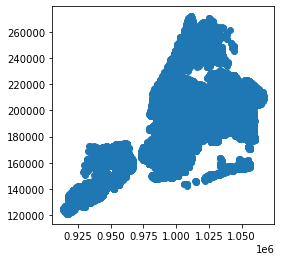

In [72]:
gdf.plot()

In [73]:
gdf.shape

(26874, 32)

In [74]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

print(len(nta_shape))
nta_shape.head()

195


,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [75]:
nta_shape.to_crs(epsg=2263, 
                 inplace=True)

nta_shape.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

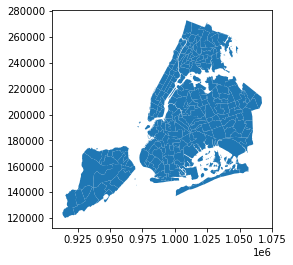

In [76]:
nta_shape.plot()

In [77]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 26874 entries, 0 to 27816
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   unique_key                      26874 non-null  int64         
 1   created_date                    26874 non-null  datetime64[ns]
 2   closed_date                     26860 non-null  object        
 3   agency                          26874 non-null  object        
 4   agency_name                     26874 non-null  object        
 5   complaint_type                  26874 non-null  object        
 6   descriptor                      26874 non-null  object        
 7   incident_zip                    26874 non-null  float64       
 8   intersection_street_1           9334 non-null   object        
 9   intersection_street_2           9334 non-null   object        
 10  address_type                    26874 non-null  object        

## 5.1 City-wide 

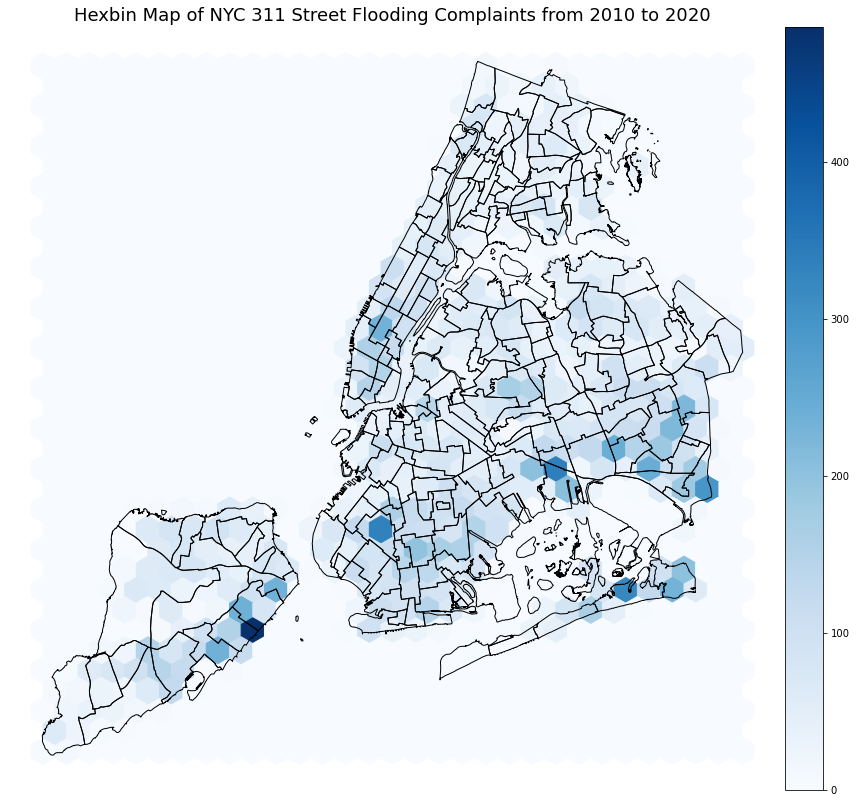

In [78]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(gdf['x_coordinate_state_plane'], 
               gdf['y_coordinate_state_plane'], 
               gridsize=30, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape.to_crs(2263).plot(facecolor="none", 
                            edgecolor="black", 
                            ax=ax)

ax.set_title("Hexbin Map of NYC 311 Street Flooding Complaints from 2010 to 2020", fontsize=18)
ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:1678: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


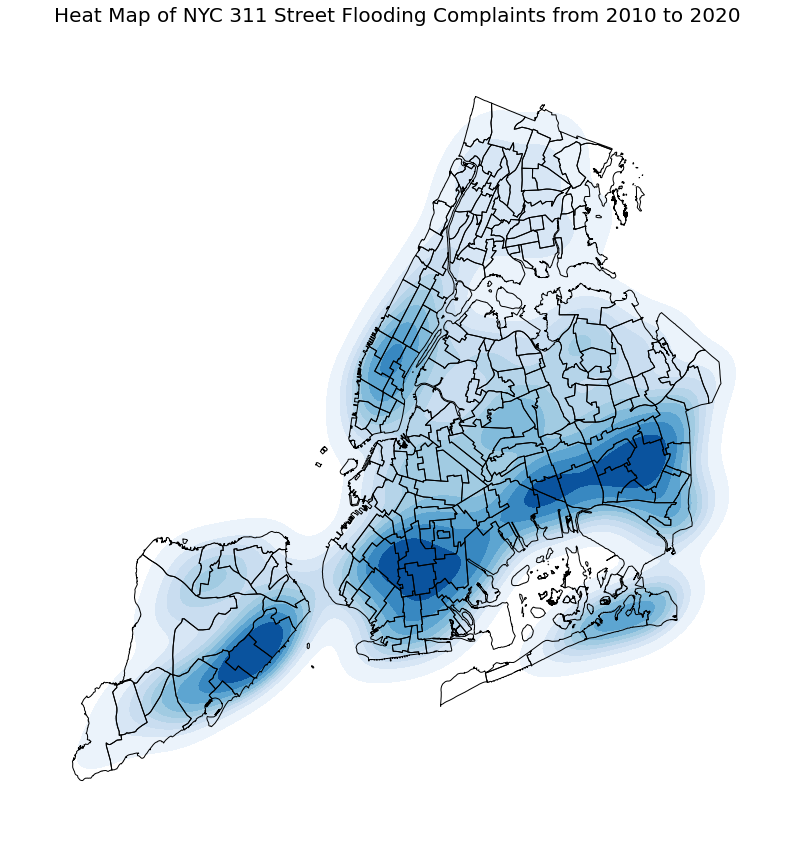

In [79]:
ax = geoplot.kdeplot(gdf.to_crs(4326),
                     shade=True, 
                     cmap='Blues',
                     projection=geoplot.crs.AlbersEqualArea(), 
                     figsize=(12, 12))

geoplot.polyplot(nta_shape.to_crs(4326), 
                 ax=ax, 
                 zorder=1)

ax.set_title('Heat Map of NYC 311 Street Flooding Complaints from 2010 to 2020', fontsize=20)
ax.set_aspect('equal', 'box')
plt.tight_layout()

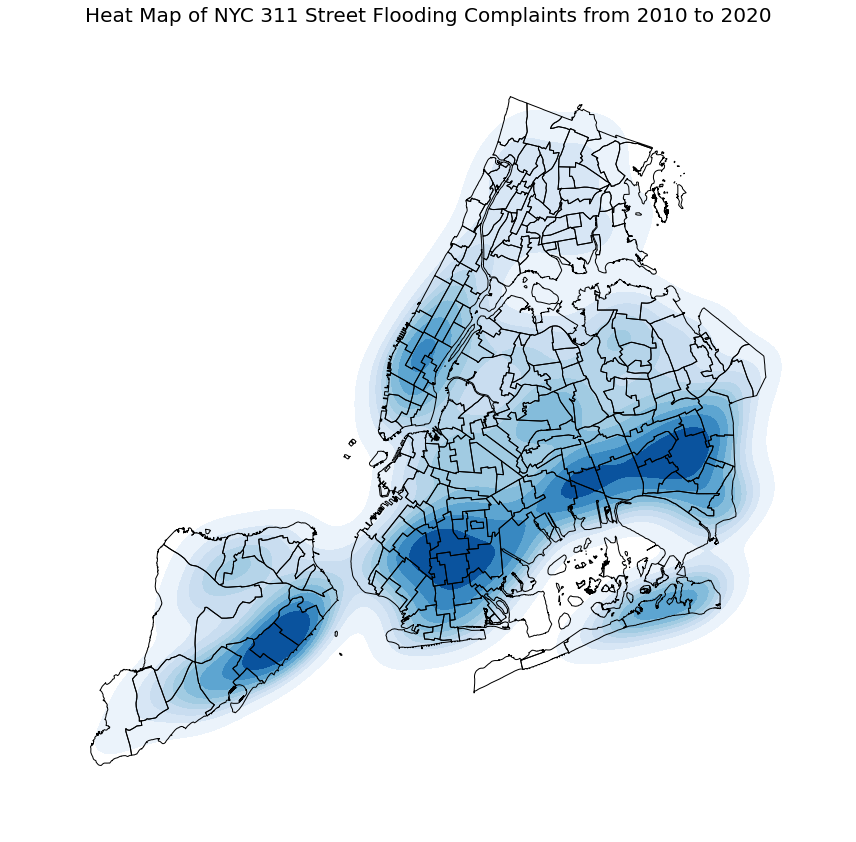

In [80]:
fig, ax = plt.subplots(figsize=(12, 12))

sns.kdeplot(data=gdf,
            x='x_coordinate_state_plane',
            y='y_coordinate_state_plane',
            fill=True,
            cmap='Blues',
            ax=ax)

nta_shape.plot(ax=ax, 
               color='None', 
               edgecolor='black', 
               zorder=1)

ax.set_title('Heat Map of NYC 311 Street Flooding Complaints from 2010 to 2020', fontsize=20)
ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

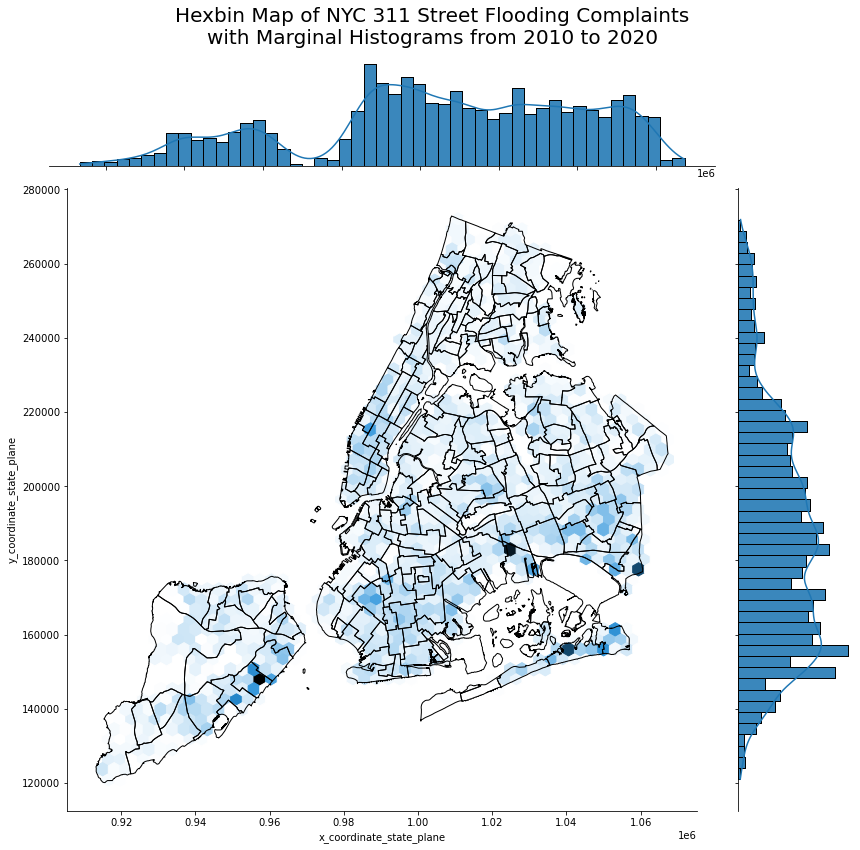

In [81]:
g = sns.jointplot(x='x_coordinate_state_plane',
                  y='y_coordinate_state_plane', 
                  data=gdf,
                  kind="hex", 
                  height=12) 

g.plot_marginals(sns.histplot, 
                 kde=True)


nta_shape.to_crs(epsg=2263).plot(ax=g.ax_joint, 
                                 zorder=1, 
                                 color='none', 
                                 edgecolor='black')


g.fig.suptitle('Hexbin Map of NYC 311 Street Flooding Complaints\nwith Marginal ' + \
               'Histograms from 2010 to 2020\n', 
               fontsize=20)
g.fig.subplots_adjust(top=0.92)

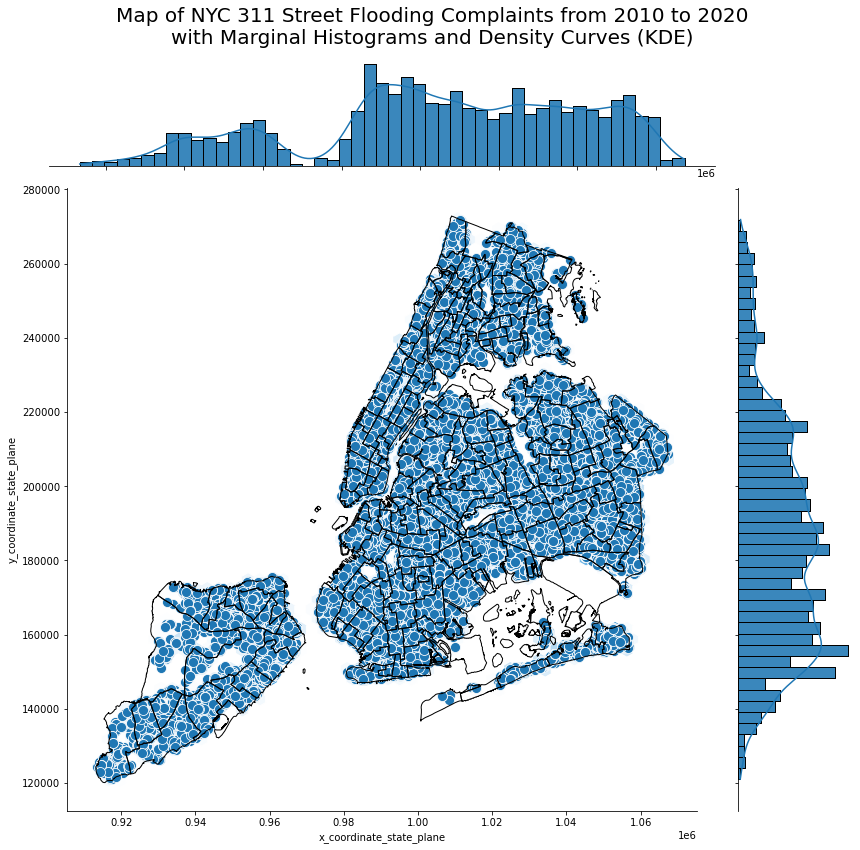

In [82]:
g = sns.jointplot(x='x_coordinate_state_plane',
                  y='y_coordinate_state_plane', 
                  data=gdf,
                  kind="hex", 
                  color='#1f77b4',
                  height=12) 

g.plot_joint(sns.scatterplot, 
             s=100)

g.plot_marginals(sns.histplot, 
                 kde=True)

nta_shape.to_crs(epsg=2263).plot(ax=g.ax_joint, 
                                 zorder=1, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle('Map of NYC 311 Street Flooding Complaints from 2010 to 2020\n' + \
               'with Marginal Histograms and Density Curves (KDE)', 
               fontsize=20)
g.fig.subplots_adjust(top=0.92)

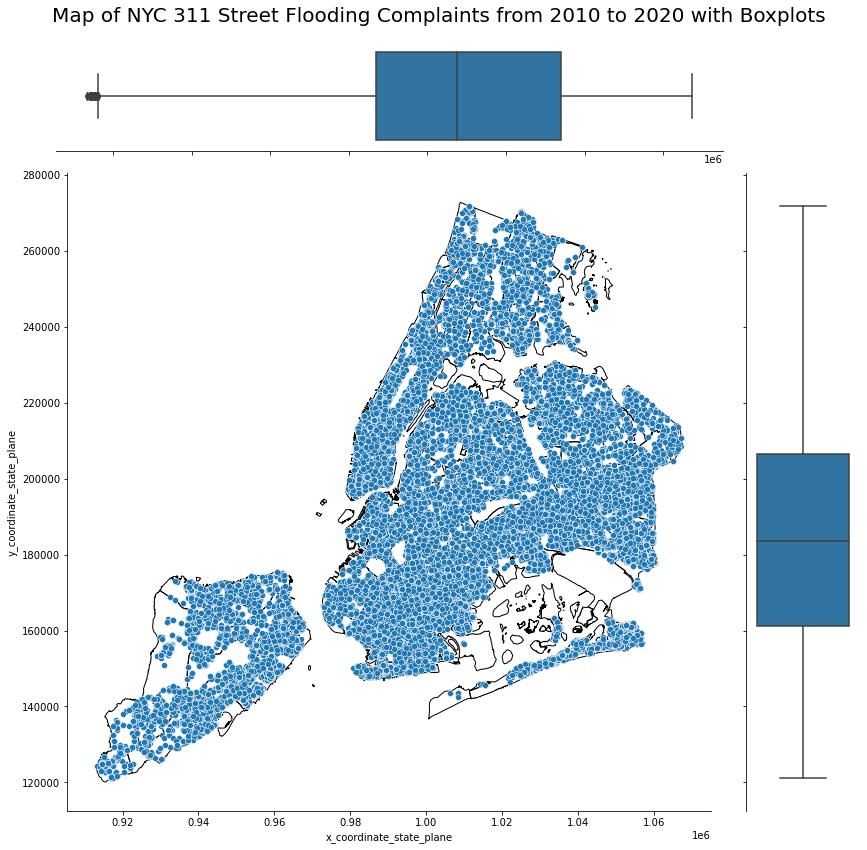

In [83]:
g = sns.JointGrid(x='x_coordinate_state_plane',
                  y='y_coordinate_state_plane', 
                  data=gdf,
                  height=12) 

g.plot(sns.scatterplot, 
       sns.boxplot)



nta_shape.to_crs(epsg=2263).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map of NYC 311 Street Flooding Complaints from 2010 to 2020 with Boxplots", 
               fontsize=20)
g.fig.subplots_adjust(top=0.94)
plt.savefig('figures/suptitle.png')

In [84]:
gdf.iloc[:, -4:]

,cross_street_2,bbl,year,geometry
0,NaN,nan,2018,POINT (1007054.000 253710.000)
1,AVENUE Y,3074220734.00,2018,POINT (1000014.000 155014.000)
2,E 196 ST,2032940001.00,2018,POINT (1014109.000 254371.000)
3,18 AVE,3055040001.00,2018,POINT (987430.000 166528.000)
4,FULTON ST,3041300013.00,2018,POINT (1019366.000 188555.000)
...,...,...,...,...
27812,32 AVE,4059890018.00,2018,POINT (1044132.000 221027.000)
27813,7 AVE,nan,2018,POINT (1001665.000 238942.000)
27814,108 STREET,nan,2018,POINT (1028083.000 194154.000)
27815,NaN,nan,2018,POINT (1005241.000 246219.000)


In [85]:
len(gdf)

26874

In [86]:
gdf[['geometry']].notnull().sum()

geometry    26874
dtype: int64

In [87]:
gdf[['geometry']].isnull().sum()

geometry    0
dtype: int64

In [88]:
flooding_complaints_with_nta = gpd.sjoin(gdf, 
                                         nta_shape, 
                                         how="inner", 
                                         op='within')

In [89]:
len(flooding_complaints_with_nta)

26872

In [90]:
print('Our new dataframe contains ' + \
      f"{len(flooding_complaints_with_nta):,}" + ' rows.\n')

print("We've dropped " + \
      f"{round((1 - len(flooding_complaints_with_nta)/len(gdf)) * 100, 2):,}" + \
      ' percent of our data in our spatial join process.')

Our new dataframe contains 26,872 rows.

We've dropped 0.01 percent of our data in our spatial join process.


In [91]:
flooding_complaints_with_nta.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year,geometry,index_right,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,2018,POINT (1007054.000 253710.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
13,40203741,2018-09-06 18:34:00,2018-09-08T12:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,9 AVENUE,WEST 220 STREET,...,2018,POINT (1008802.000 256858.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
1971,42223076,2019-04-14 10:33:00,2019-04-17T11:00:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,NaN,NaN,...,2019,POINT (1006343.000 254787.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
1973,42224479,2019-04-14 10:36:00,2019-04-17T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,NaN,NaN,...,2019,POINT (1006135.000 254606.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
5920,20549194,2011-06-01 07:59:00,2011-06-03T16:00:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 207 STREET,POST AVENUE,...,2011,POINT (1006554.000 254361.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1


In [92]:
flooding_complaints_with_nta.shape

(26872, 40)

In [93]:
flooding_complaints_with_nta['boro_name'].value_counts(dropna=False)

Queens           10605
Brooklyn          6917
Staten Island     4916
Manhattan         2546
Bronx             1888
Name: boro_name, dtype: int64

In [94]:
flooding_complaints_with_nta['ntaname'].value_counts(dropna=False)

New Dorp-Midland Beach             761
Hammels-Arverne-Edgemere           696
Lindenwood-Howard Beach            606
St. Albans                         576
Far Rockaway-Bayswater             539
                                  ... 
Starrett City                        9
Fordham South                        8
Parkchester                          6
park-cemetery-etc-Staten Island      5
Airport                              3
Name: ntaname, Length: 194, dtype: int64

<AxesSubplot:>

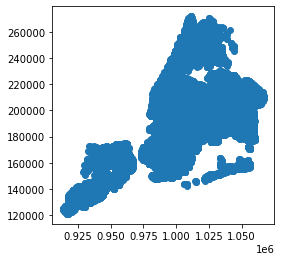

In [95]:
flooding_complaints_with_nta.plot()

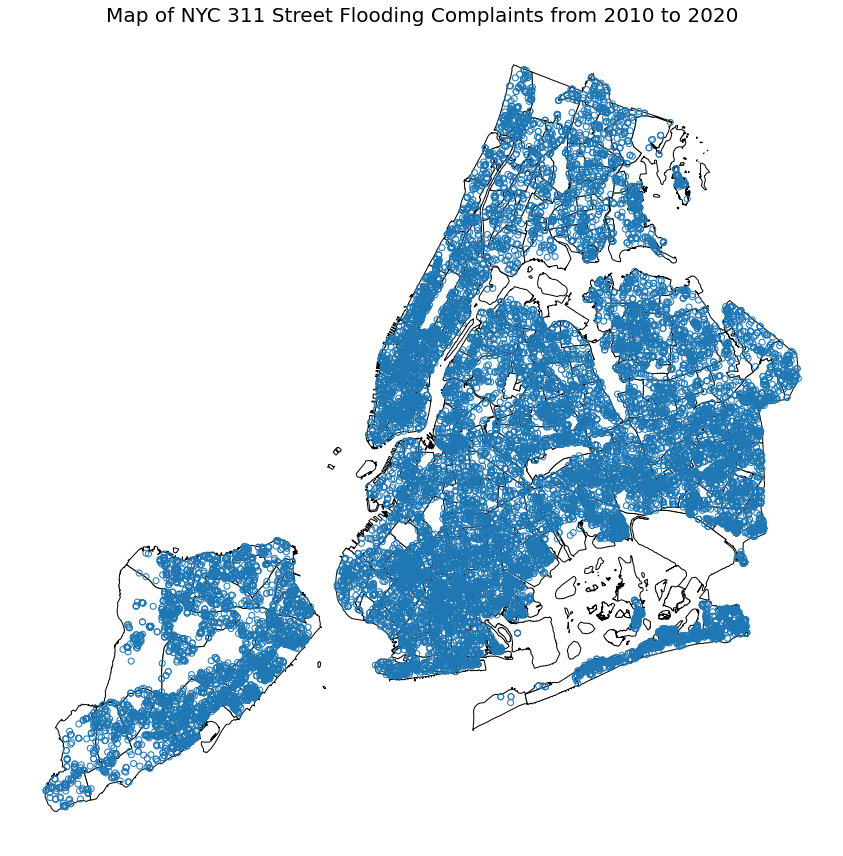

In [96]:
fig, ax = plt.subplots(figsize=(12,12))


nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black', 
               zorder=0)

flooding_complaints_with_nta.plot(ax=ax, 
                                  color='None',
                                  edgecolor='#1f77b4')
ax.set_aspect('equal', 'box')
ax.set_title("Map of NYC 311 Street Flooding Complaints from 2010 to 2020", fontsize=20)
plt.axis('off')
plt.tight_layout()

In [97]:
flooding_complaints_with_nta = flooding_complaints_with_nta.groupby(by='ntaname')['unique_key'].count().reset_index()
flooding_complaints_with_nta.rename(columns={"unique_key": "count"}, 
                                    inplace=True)

flooding_complaints_with_nta.sort_values(by='count', 
                                         ascending=False).head()

,ntaname,count
116,New Dorp-Midland Beach,761
80,Hammels-Arverne-Edgemere,696
97,Lindenwood-Howard Beach,606
157,St. Albans,576
61,Far Rockaway-Bayswater,539


In [98]:
flooding_complaints_with_nta['count'].sum()

26872

In [99]:
flooding_complaints_with_nta = nta_shape.merge(flooding_complaints_with_nta, 
                                               left_on='ntaname', 
                                               right_on='ntaname')

In [100]:
flooding_complaints_with_nta.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,count
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",535
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",167
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",43
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....",80
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...",127


In [101]:
flooding_complaints_with_nta['count'].sum()

26872

In [102]:
flooding_complaints_with_nta[['ntaname', 'count']].sort_values(by='count', 
                                                               ascending=False).head()

,ntaname,count
94,New Dorp-Midland Beach,761
130,Hammels-Arverne-Edgemere,696
160,Lindenwood-Howard Beach,606
9,St. Albans,576
133,Far Rockaway-Bayswater,539


In [103]:
flooding_complaints_with_nta[['ntaname', 'count']].sort_values(by='count', 
                                                               ascending=True).head()

,ntaname,count
177,Airport,3
193,park-cemetery-etc-Staten Island,5
34,Parkchester,6
86,Fordham South,8
12,Starrett City,9


In [104]:
flooding_complaints_with_nta.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 194 entries, 0 to 193
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   ntacode      194 non-null    object  
 1   shape_area   194 non-null    object  
 2   county_fips  194 non-null    object  
 3   ntaname      194 non-null    object  
 4   shape_leng   194 non-null    object  
 5   boro_name    194 non-null    object  
 6   boro_code    194 non-null    object  
 7   geometry     194 non-null    geometry
 8   count        194 non-null    int64   
dtypes: geometry(1), int64(1), object(7)
memory usage: 15.2+ KB


In [105]:
flooding_complaints_with_nta['shape_area'] = flooding_complaints_with_nta['shape_area'].astype(float)
flooding_complaints_with_nta['shape_leng'] = flooding_complaints_with_nta['shape_leng'].astype(float)
                                                                          
flooding_complaints_with_nta.info()                                                                          

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 194 entries, 0 to 193
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   ntacode      194 non-null    object  
 1   shape_area   194 non-null    float64 
 2   county_fips  194 non-null    object  
 3   ntaname      194 non-null    object  
 4   shape_leng   194 non-null    float64 
 5   boro_name    194 non-null    object  
 6   boro_code    194 non-null    object  
 7   geometry     194 non-null    geometry
 8   count        194 non-null    int64   
dtypes: float64(2), geometry(1), int64(1), object(5)
memory usage: 15.2+ KB


In [106]:
flooding_complaints_with_nta['count_sq_mi'] = (flooding_complaints_with_nta['count'] / 
                                              ((flooding_complaints_with_nta['shape_area'] / 27878400)))

flooding_complaints_with_nta.head() 

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,count,count_sq_mi
0,BK88,54005019.05,047,Borough Park,39247.23,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",535,276.18
1,QN51,52488277.59,081,Murray Hill,33266.90,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",167,88.70
2,QN27,19726845.59,081,East Elmhurst,19816.71,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",43,60.77
3,BK95,14522603.59,047,Erasmus,18756.70,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....",80,153.57
4,QN07,22887772.81,081,Hollis,20976.34,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...",127,154.69


In [107]:
flooding_complaints_with_nta[['count', 'count_sq_mi']].describe()

,count,count_sq_mi
count,194.00,194.00
mean,138.52,98.36
std,135.18,62.01
min,3.00,0.37
25%,53.25,58.51
50%,94.00,82.86
75%,167.00,129.76
max,761.00,382.75


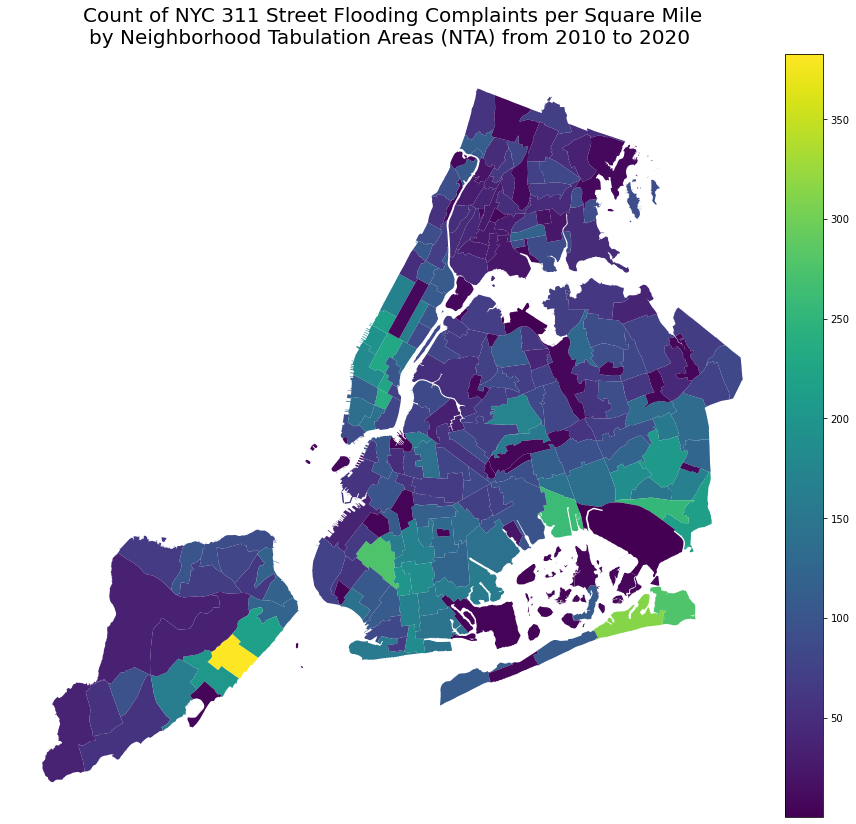

In [108]:
fig, ax = plt.subplots(figsize=(12,12))

comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

flooding_complaints_with_nta.plot(column='count_sq_mi', 
                                  cmap='viridis',
                                  ax=ax, 
                                  legend=True,
                                  cax=cax,
                                  legend_kwds={'format':comma_fmt})

ax.set_title('Count of NYC 311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA) from 2010 to 2020 ', 
             fontsize=20, 
             pad=10)

ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

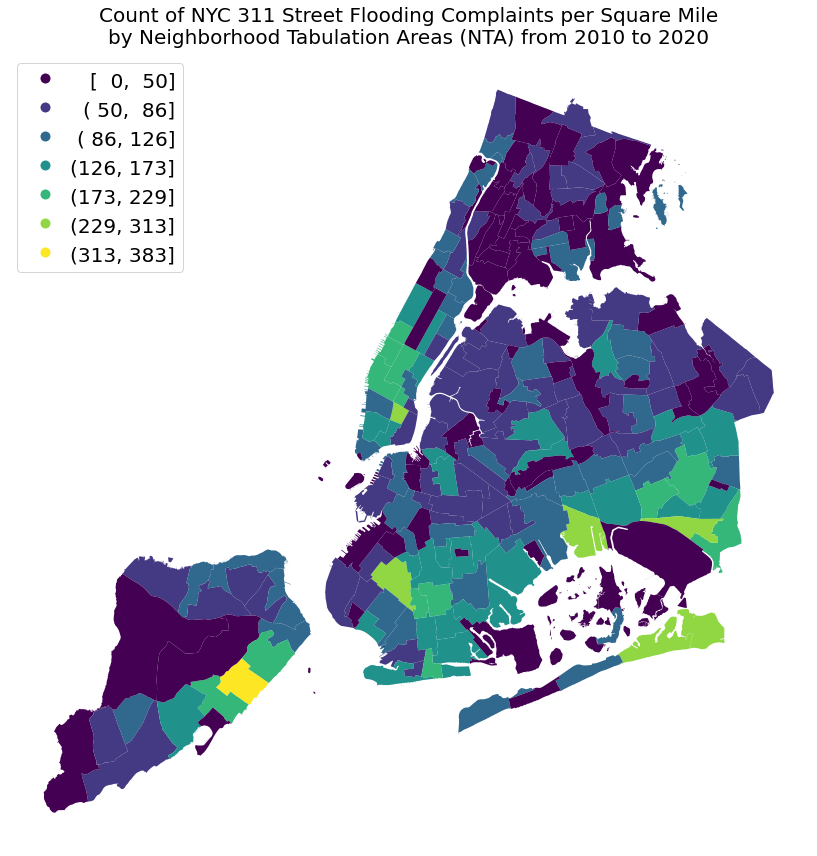

In [109]:
fig, ax = plt.subplots(figsize=(12,12))

flooding_complaints_with_nta.plot(column='count_sq_mi', 
                                  cmap='viridis',
                                  ax=ax, 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.0f}",
                                              'fontsize': "20"})
leg = ax.get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(150) 
        row.mode= "expand"
        row.align="right" 

ax.set_title('Count of NYC 311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA) from 2010 to 2020', 
             fontsize=20, 
             pad=10)

ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

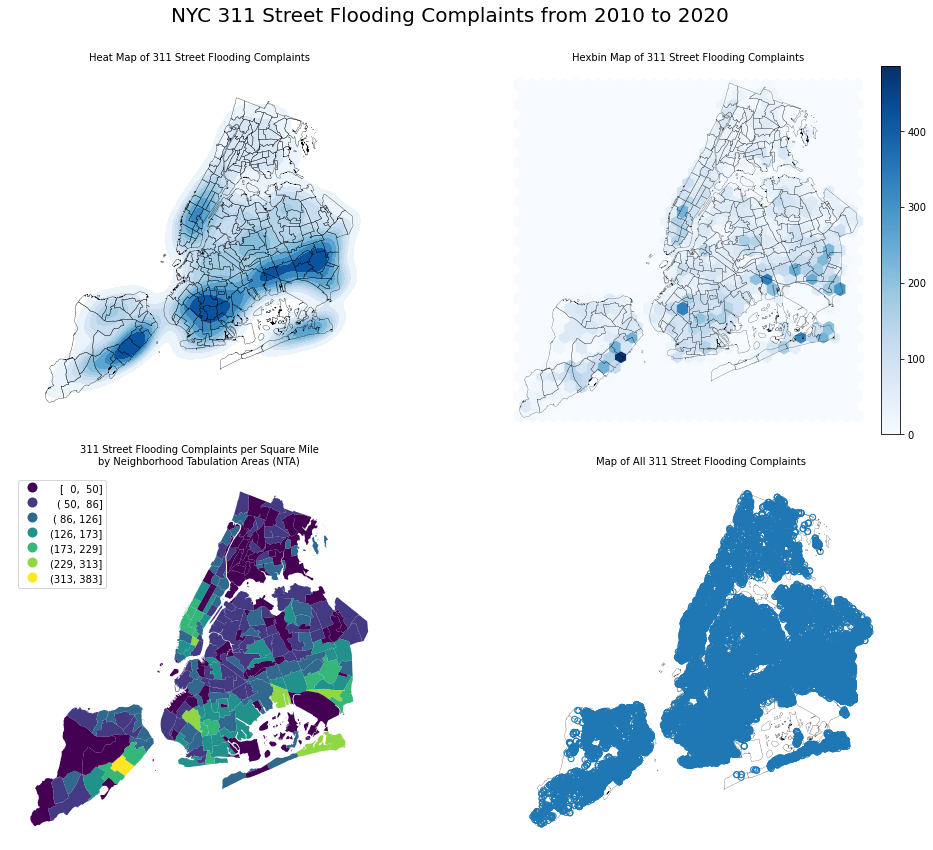

In [110]:
fig, axs = plt.subplots(2, 2, sharey=False, figsize=(15, 12))


# First Plot
sns.kdeplot(data=gdf,
            x='x_coordinate_state_plane',
            y='y_coordinate_state_plane',
            fill=True,
            cmap='Blues',
            ax=axs[0,0])

nta_shape.plot(ax=axs[0,0], 
               color='None', 
               edgecolor='black', 
               zorder=1,
               linewidth=.3)

axs[0,0].set_title("Heat Map of 311 Street Flooding Complaints", 
             fontsize=10)
axs[0,0].set_aspect('equal', 'box')
axs[0,0].axis('off')


# Second Plot
hb = axs[0,1].hexbin(flooding_311['x_coordinate_state_plane'], 
                               flooding_311['y_coordinate_state_plane'], 
                               gridsize=30, 
                               cmap='Blues')

divider = make_axes_locatable(axs[0,1])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape.to_crs(2263).plot(facecolor="none", 
                            edgecolor="black", 
                            linewidth=.2,
                            ax=axs[0,1])

axs[0,1].set_title("Hexbin Map of 311 Street Flooding Complaints", 
             fontsize=10)
axs[0,1].set_aspect('equal', 'box')
axs[0,1].axis('off')


# Third Plot
flooding_complaints_with_nta.plot(column='count_sq_mi', 
                                  cmap='viridis',
                                  ax=axs[1,0], 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.0f}",
                                              'fontsize': "10"})
leg = axs[1,0].get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(80)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

axs[1,0].set_title('311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA)', 
             fontsize=10, 
             pad=10)

axs[1,0].set_aspect('equal', 'box')
axs[1,0].axis('off')


# Fourth Plot
nta_shape.plot(ax=axs[1,1], 
               color='white', 
               edgecolor='black', 
               linewidth=.2,
               zorder=0)

gdf.plot(ax=axs[1,1], 
         color='None', 
         edgecolor='#1f77b4')

axs[1,1].set_title("Map of All 311 Street Flooding Complaints", 
                   fontsize=10, 
                   pad=10)
axs[1,1].set_aspect('equal', 'box')
axs[1,1].axis('off')

# Figure Details
fig.suptitle('NYC 311 Street Flooding Complaints from 2010 to 2020\n', fontsize=20) 

plt.tight_layout()
# # plt.savefig('figures/sample.png')

In [111]:
year_nta = gpd.sjoin(gdf, 
                     nta_shape, 
                     how="inner", 
                     op='within')

In [112]:
len(gdf)

26874

In [113]:
len(year_nta)

26872

In [114]:
year_nta.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year,geometry,index_right,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,2018,POINT (1007054.000 253710.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
13,40203741,2018-09-06 18:34:00,2018-09-08T12:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,9 AVENUE,WEST 220 STREET,...,2018,POINT (1008802.000 256858.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
1971,42223076,2019-04-14 10:33:00,2019-04-17T11:00:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,NaN,NaN,...,2019,POINT (1006343.000 254787.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
1973,42224479,2019-04-14 10:36:00,2019-04-17T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,NaN,NaN,...,2019,POINT (1006135.000 254606.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
5920,20549194,2011-06-01 07:59:00,2011-06-03T16:00:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 207 STREET,POST AVENUE,...,2011,POINT (1006554.000 254361.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1


In [115]:
year_nta = year_nta.groupby(by=['year', 
                                'ntaname'])['unique_key'].count().reset_index()

year_nta.rename(columns={"unique_key": "count"}, 
                inplace=True)

year_nta = nta_shape.merge(year_nta, 
                           left_on='ntaname', 
                           right_on='ntaname')

year_nta['count_sq_mi'] = (year_nta['count'] / (year_nta['shape_area'].astype(float) / 27878400))

year_nta.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,year,count,count_sq_mi
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",2010,45,23.23
1,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",2011,44,22.71
2,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",2012,34,17.55
3,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",2013,18,9.29
4,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",2014,48,24.78


In [116]:
years = list(year_nta.year.unique())

In [117]:
print(type(years))
print(years)

<class 'list'>
[2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]


Indexing for year 2012 (2nd position starting at 0) in our list. Here, I index for 2012


Text(0.5, 1.0, '2012')

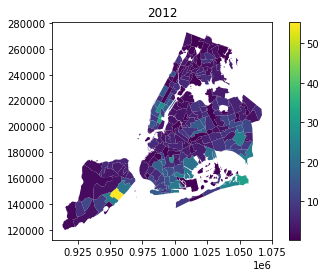

In [118]:
print('Indexing for year 2012 (2nd position starting at 0) in our list. Here, I index for', years[2])

year_nta[year_nta['year'] == years[2]].plot(column='count_sq_mi', 
                                            cmap='viridis',
                                            legend=True)
plt.title(years[2])

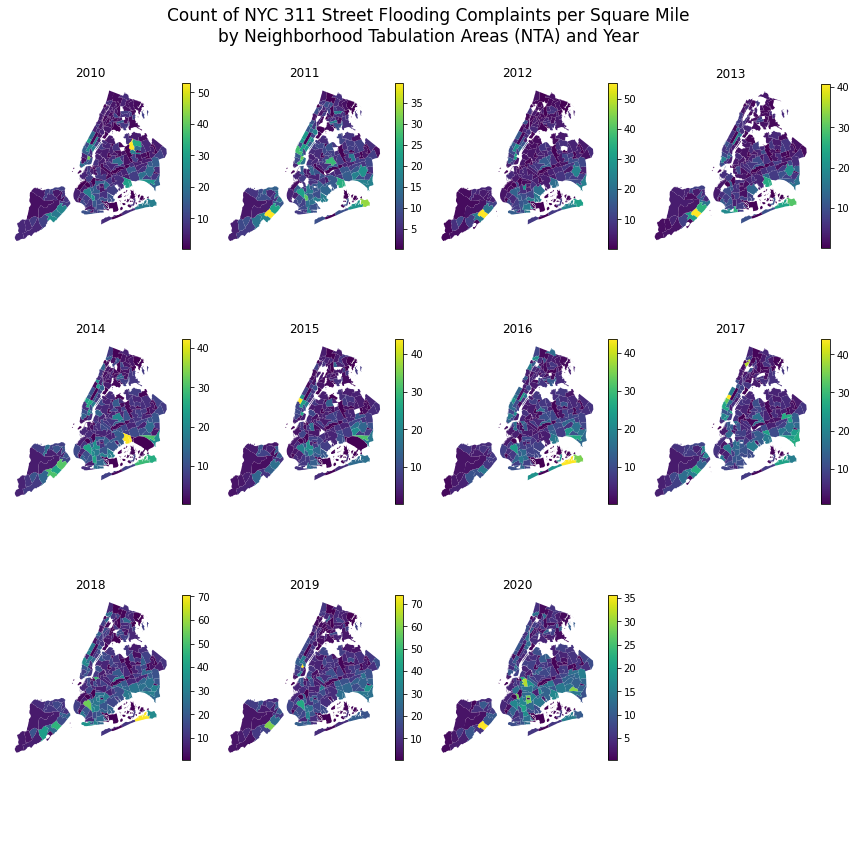

In [119]:
indx = 0

fig, axes = plt.subplots(3, 4, figsize=(12, 12))

for ax in axes.flat:
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    
    year_nta[year_nta['year'] == years[indx]].plot(column='count_sq_mi', 
                                                   cmap='viridis',
                                                   legend=True,
                                                   ax=ax, 
                                                   cax=cax)

    ax.set_title(str(years[indx]), fontsize=12)
    ax.set_aspect('equal', 'box')
    ax.axis('off')
    plt.tight_layout()
    
    indx += 1
    if indx == 11:
        break

    axes[2,3].set_axis_off()
    
# Figure Details
fig.suptitle('Count of NYC 311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA) and Year', fontsize=17) 
plt.savefig('figures/example.png')    

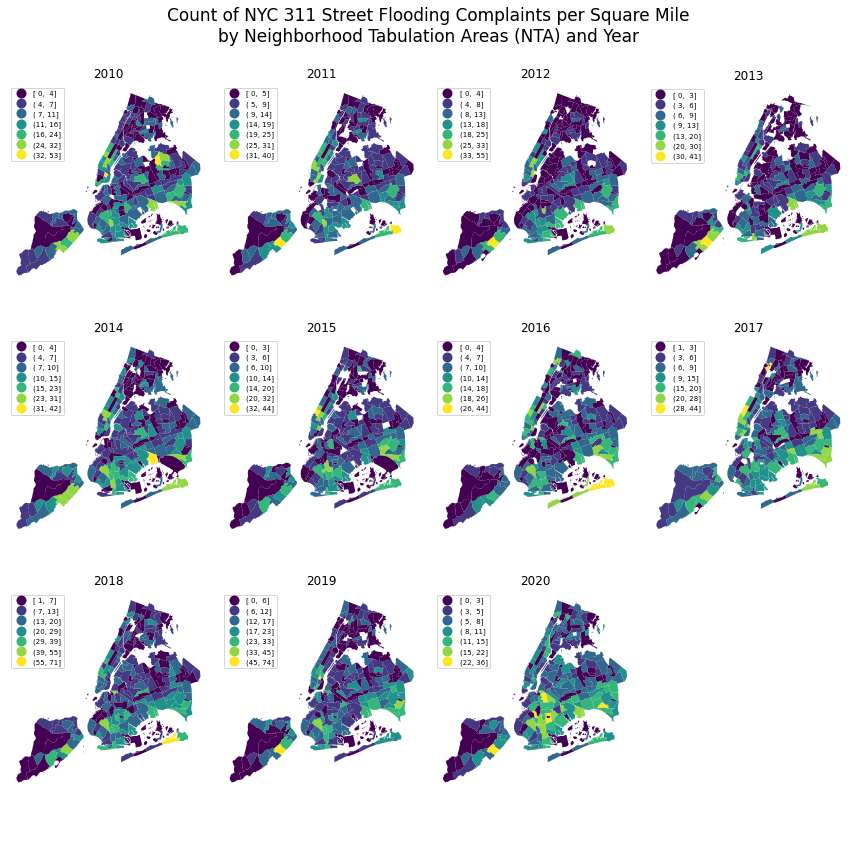

In [120]:
indx = 0

fig, axes = plt.subplots(3, 4, figsize=(12, 12))

for ax in axes.flat:
    year_nta[year_nta['year'] == years[indx]].plot(column='count_sq_mi', 
                                              cmap='viridis',
                                              legend=True, 
                                              figsize=(6,6),
                                              scheme='fisher_jenks',
                                              k=7,
                                              legend_kwds={'loc': "upper left", 
                                                           'fmt': "{:,.0f}",
                                                           'fontsize': "7"},
                                              ax=ax)

    
    ax.set_title(str(years[indx]), fontsize=12)
    ax.set_aspect('equal', 'box')
    ax.axis('off')
    plt.tight_layout()
    
    indx += 1
    if indx == 11:
        break

    axes[2,3].set_axis_off()   

# Figure Details
fig.suptitle('Count of NYC 311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA) and Year', fontsize=17)
fig.subplots_adjust(top=0.95)
plt.savefig('figures/example.png', dpi=150) 

Text(0.5, 0.98, 'Hexbin Map of NYC 311 Street Flooding Complaints by Year')

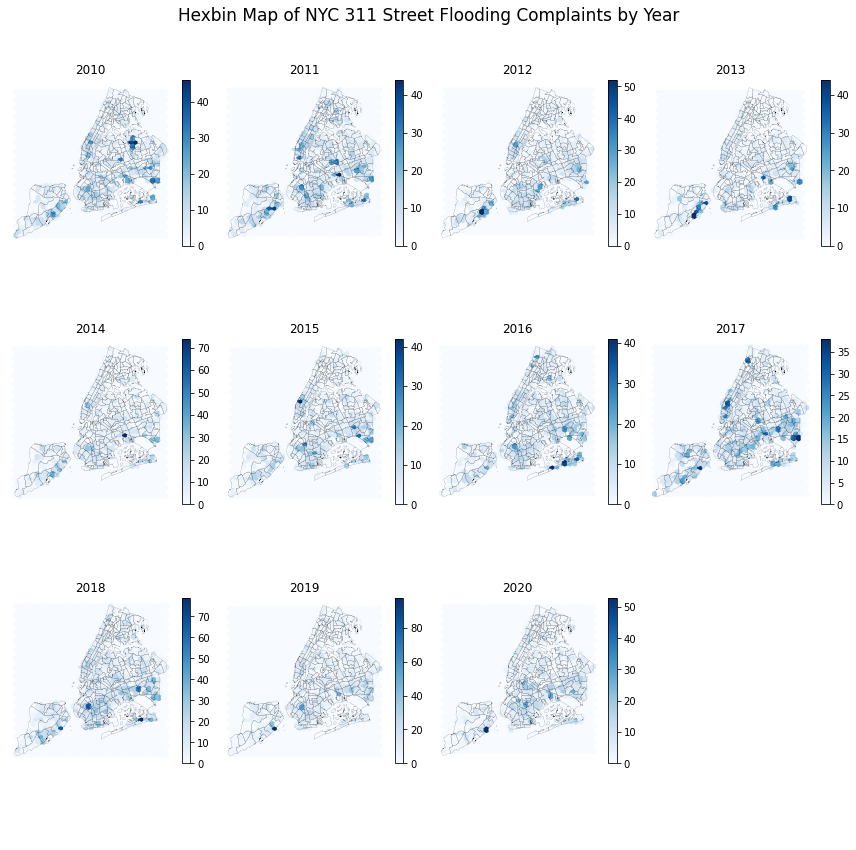

In [121]:
indx = 0

fig, axes = plt.subplots(3, 4, figsize=(12, 12))

for ax in axes.flat:
    
    df = flooding_311[flooding_311['year'] == years[indx]]

    hb = ax.hexbin(df.x_coordinate_state_plane, 
                   df.y_coordinate_state_plane, 
                   gridsize=30, 
                   cmap='Blues')

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(hb, cax=cax)

    nta_shape.to_crs(2263).plot(facecolor="none", 
                                edgecolor="black", 
                                ax=ax,
                                zorder=1,
                                linewidth=.1)

    
    ax.set_title(str(years[indx]), fontsize=12)
    ax.set_aspect('equal', 'box')
    ax.axis('off')
    plt.tight_layout()
    
    indx += 1
    if indx == 11:
        break

    axes[2,3].set_axis_off()   
    
# Figure Details
fig.suptitle('Hexbin Map of NYC 311 Street Flooding Complaints by Year', fontsize=17) 
# plt.savefig('figures/example.png')     

## 5.2 By Borough

In [122]:
flooding_311.borough.value_counts()

QUEENS           11011
BROOKLYN          7094
STATEN ISLAND     5010
MANHATTAN         2613
BRONX             2071
Unspecified         18
Name: borough, dtype: int64

In [123]:
nta_shape.boro_name.value_counts()

Queens           58
Brooklyn         51
Bronx            38
Manhattan        29
Staten Island    19
Name: boro_name, dtype: int64

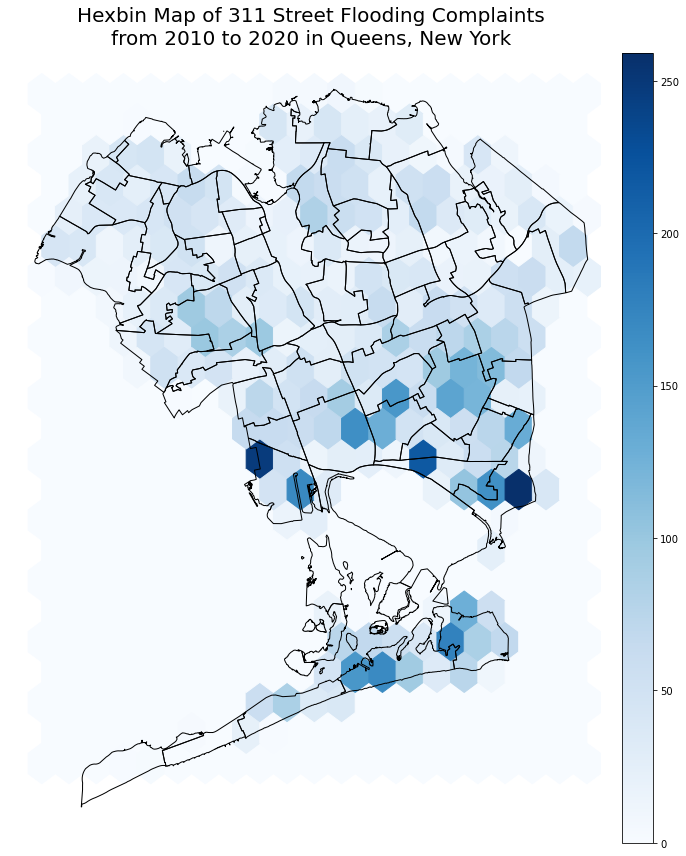

In [124]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'QUEENS']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'QUEENS']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Queens'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in Queens, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

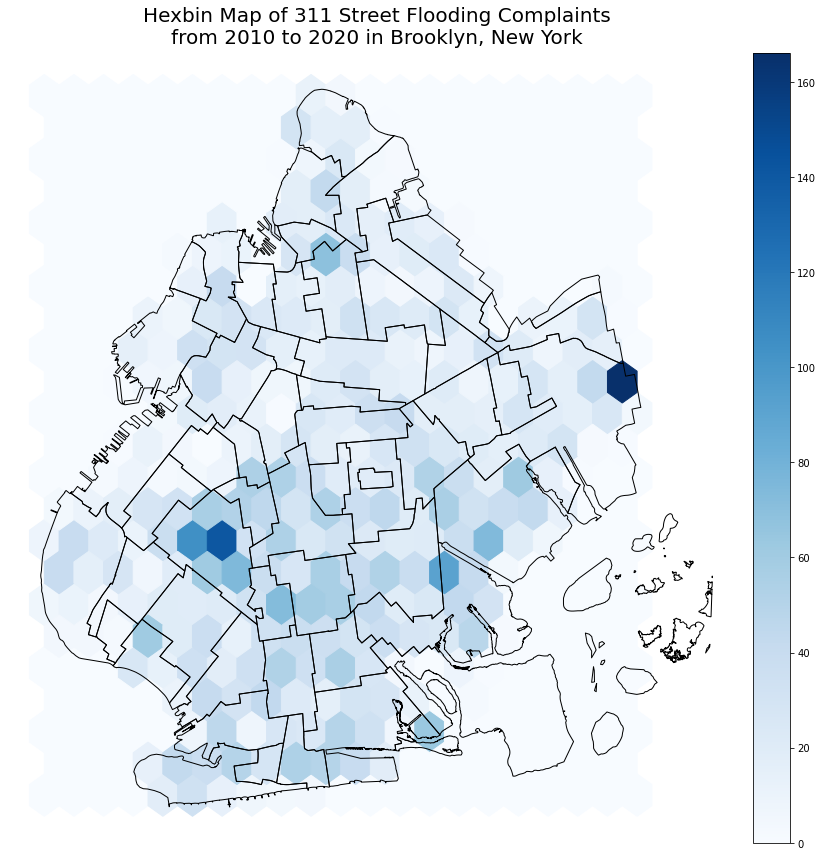

In [125]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'BROOKLYN']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'BROOKLYN']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Brooklyn'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in Brooklyn, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

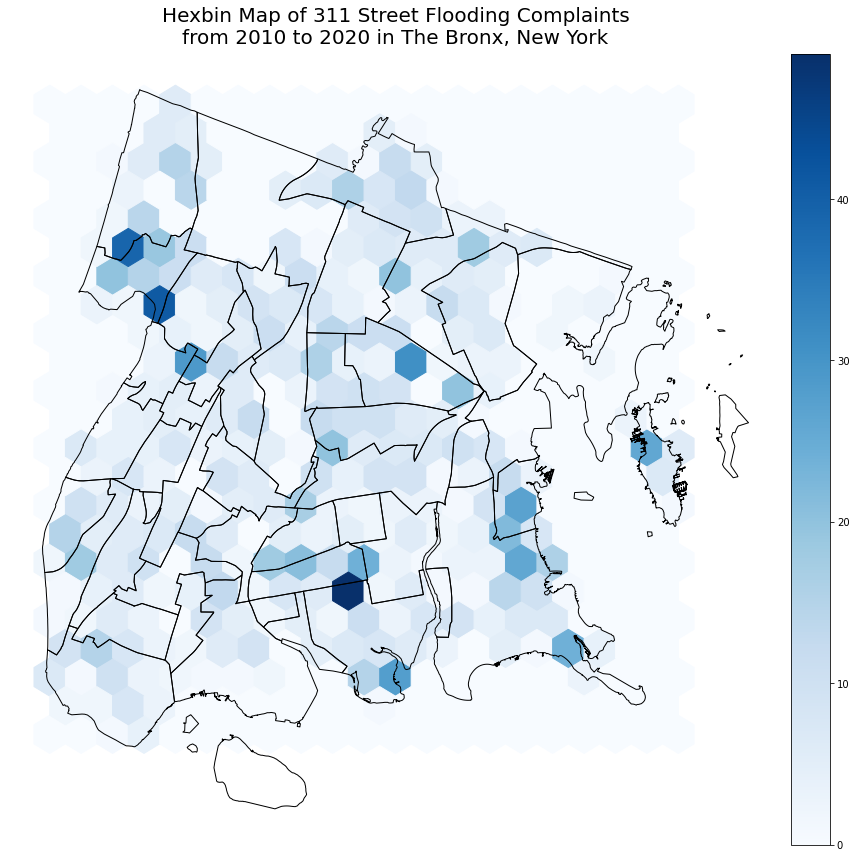

In [126]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'BRONX']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'BRONX']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Bronx'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in The Bronx, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

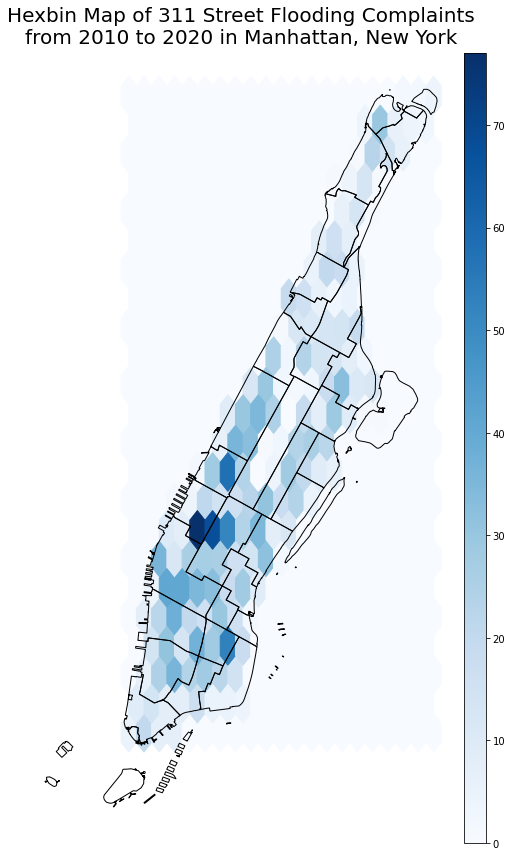

In [127]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'MANHATTAN']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'MANHATTAN']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Manhattan'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in Manhattan, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

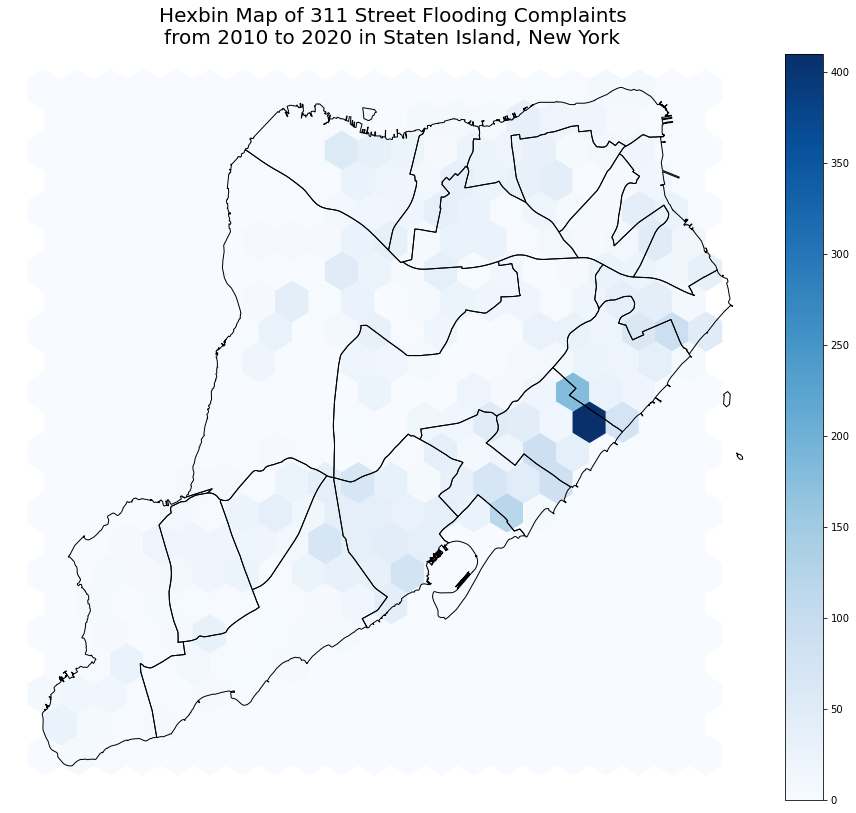

In [128]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'STATEN ISLAND']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'STATEN ISLAND']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Staten Island'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in Staten Island, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

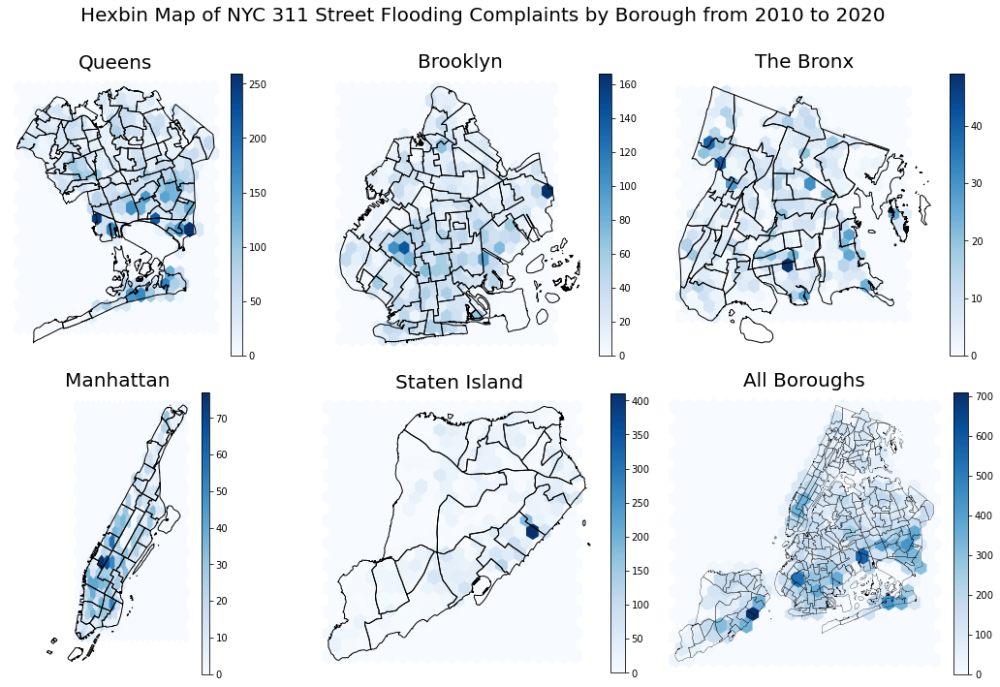

In [129]:
fig, axs = plt.subplots(2, 3, sharey=False, figsize=(15, 10))


# first plot
hb = axs[0,0].hexbin(flooding_311[flooding_311.borough == 'QUEENS']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'QUEENS']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[0,0])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Queens'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[0,0])

axs[0,0].set_aspect('equal', 'box')
axs[0,0].axis('off')
axs[0,0].set_title('Queens', fontsize=20)

# second plot
hb = axs[0,1].hexbin(flooding_311[flooding_311.borough == 'BROOKLYN']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'BROOKLYN']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[0,1])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Brooklyn'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[0,1])

axs[0,1].set_aspect('equal', 'box')
axs[0,1].axis('off')
axs[0,1].set_title('Brooklyn', fontsize=20)

# third plot
hb = axs[0,2].hexbin(flooding_311[flooding_311.borough == 'BRONX']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'BRONX']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[0,2])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Bronx'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[0,2])

axs[0,2].set_aspect('equal', 'box')
axs[0,2].axis('off')
axs[0,2].set_title('The Bronx', fontsize=20)

# fourth plot
hb = axs[1,0].hexbin(flooding_311[flooding_311.borough == 'MANHATTAN']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'MANHATTAN']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[1,0])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Manhattan'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[1,0])

axs[1,0].set_aspect('equal', 'box')
axs[1,0].axis('off')
axs[1,0].set_title('Manhattan', fontsize=20)


# fifth plot
hb = axs[1,1].hexbin(flooding_311[flooding_311.borough == 'STATEN ISLAND']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'STATEN ISLAND']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[1,1])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Staten Island'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[1,1])

axs[1,1].set_aspect('equal', 'box')
axs[1,1].axis('off')
axs[1,1].set_title('Staten Island', fontsize=20)



# sixth plot
hb = axs[1,2].hexbin(flooding_311['x_coordinate_state_plane'], 
               flooding_311['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[1,2])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape.to_crs(2263).plot(facecolor="none", 
                            edgecolor="black", 
                            linewidth=.3,
                            ax=axs[1,2])

axs[1,2].set_aspect('equal', 'box')
axs[1,2].axis('off')
axs[1,2].set_title('All Boroughs', fontsize=20)

# Figure Details
fig.suptitle("Hexbin Map of NYC 311 Street Flooding Complaints by Borough from 2010 to 2020\n", fontsize=20)
plt.tight_layout()
plt.savefig('figures/boroughs.png')

## 5.3 Bar Charts by Neighborhood Tabulation Areas (NTA)

In [130]:
flooding_complaints_with_nta.sort_values(by='count_sq_mi', ascending=False).head(10)

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,count,count_sq_mi
94,SI45,55429451.22,085,New Dorp-Midland Beach,34336.52,Staten Island,5,"MULTIPOLYGON (((960721.609 147492.642, 960370....",761,382.75
130,QN12,61895482.14,081,Hammels-Arverne-Edgemere,83797.48,Queens,4,"MULTIPOLYGON (((1048650.082 157173.057, 104869...",696,313.49
133,QN15,54159776.79,081,Far Rockaway-Bayswater,48674.16,Queens,4,"MULTIPOLYGON (((1049860.789 154842.320, 104983...",539,277.45
0,BK88,54005019.05,047,Borough Park,39247.23,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",535,276.18
160,QN57,64560809.01,081,Lindenwood-Howard Beach,79085.71,Queens,4,"MULTIPOLYGON (((1023868.747 176222.723, 102336...",606,261.68
176,QN03,43288698.09,081,Springfield Gardens South-Brookville,45322.17,Queens,4,"MULTIPOLYGON (((1051487.928 182175.542, 105150...",396,255.03
70,MN22,10894242.60,061,East Village,13555.23,Manhattan,1,"MULTIPOLYGON (((989084.531 205727.630, 989108....",94,240.55
58,MN17,30191534.33,061,Midtown-Midtown South,27032.70,Manhattan,1,"MULTIPOLYGON (((991725.244 217725.299, 992169....",248,229.00
21,MN21,7526913.95,061,Gramercy,12096.89,Manhattan,1,"MULTIPOLYGON (((990196.892 207745.371, 990187....",61,225.93
192,SI36,67011968.25,085,Old Town-Dongan Hills-South Beach,41973.14,Staten Island,5,"MULTIPOLYGON (((966187.482 153868.426, 966187....",521,216.75


In [131]:
flooding_complaints_with_nta['nta_borough'] = flooding_complaints_with_nta['ntaname'] + ' - ' + flooding_complaints_with_nta['boro_name']

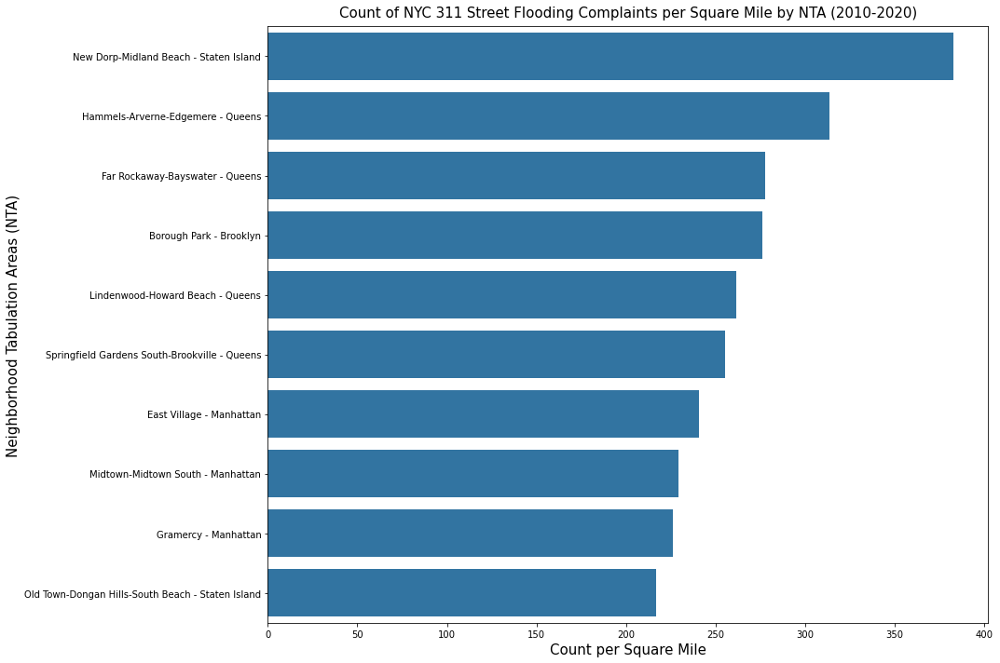

In [132]:
plt.figure(figsize=(15,10))

sns.barplot(data=flooding_complaints_with_nta.sort_values(by='count_sq_mi', ascending=False).head(10),
            y='nta_borough',
            x='count_sq_mi',
            color='#1f77b4')

plt.title('Count of NYC 311 Street Flooding Complaints per Square Mile by NTA (2010-2020)', 
          fontsize=15,
          pad=10)
plt.xlabel('Count per Square Mile', fontsize=15)
plt.ylabel('Neighborhood Tabulation Areas (NTA)', fontsize=15)
plt.tight_layout()

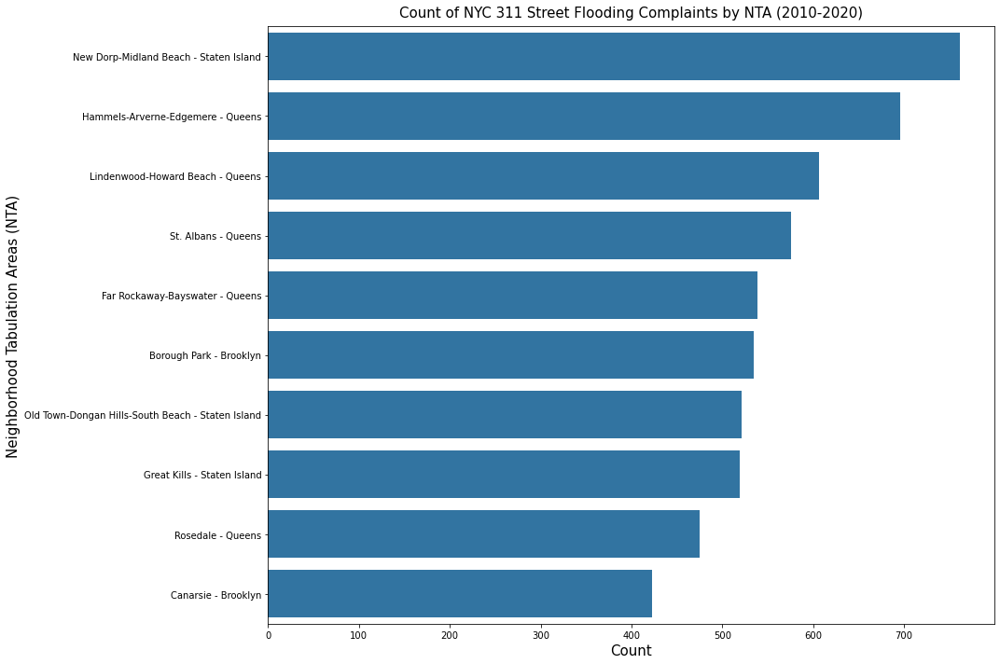

In [133]:
plt.figure(figsize=(15,10))

sns.barplot(data=flooding_complaints_with_nta.sort_values(by='count', ascending=False).head(10),
            y='nta_borough',
            x='count',
            color='#1f77b4')

plt.title('Count of NYC 311 Street Flooding Complaints by NTA (2010-2020)', 
          fontsize=15,
          pad=10)
plt.xlabel('Count', fontsize=15)
plt.ylabel('Neighborhood Tabulation Areas (NTA)', fontsize=15)
plt.tight_layout()

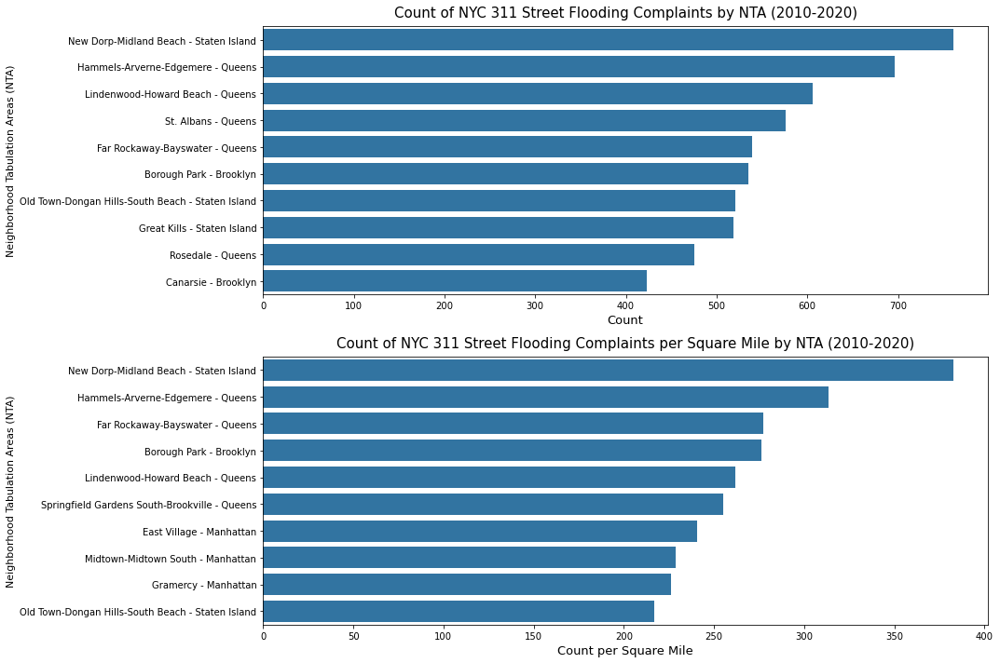

In [134]:
fig, axs = plt.subplots(2, 1, sharey=False, figsize=(15, 10))

# first plot
sns.barplot(data=flooding_complaints_with_nta.sort_values(by='count', ascending=False).head(10),
            y='nta_borough',
            x='count',
            color='#1f77b4',
            ax=axs[0])

axs[0].set_title('Count of NYC 311 Street Flooding Complaints by NTA (2010-2020)', 
          fontsize=15,
          pad=10)
axs[0].set_xlabel('Count', fontsize=13)
axs[0].set_ylabel('Neighborhood Tabulation Areas (NTA)', fontsize=11)

# second plot
sns.barplot(data=flooding_complaints_with_nta.sort_values(by='count_sq_mi', ascending=False).head(10),
            y='nta_borough',
            x='count_sq_mi',
            color='#1f77b4',
            ax=axs[1])

axs[1].set_title('Count of NYC 311 Street Flooding Complaints per Square Mile by NTA (2010-2020)', 
          fontsize=15,
          pad=10)
axs[1].set_xlabel('Count per Square Mile', fontsize=13)
axs[1].set_ylabel('Neighborhood Tabulation Areas (NTA)', fontsize=11)

plt.tight_layout()

# 6. Time Series Analysis

In [135]:
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27817 entries, 0 to 27816
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   unique_key                      27817 non-null  int64         
 1   created_date                    27817 non-null  datetime64[ns]
 2   closed_date                     27803 non-null  object        
 3   agency                          27817 non-null  object        
 4   agency_name                     27817 non-null  object        
 5   complaint_type                  27817 non-null  object        
 6   descriptor                      27817 non-null  object        
 7   incident_zip                    26960 non-null  float64       
 8   intersection_street_1           10076 non-null  object        
 9   intersection_street_2           10076 non-null  object        
 10  address_type                    27811 non-null  object        
 11  ci

In [136]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,MANHATTAN,40.86,-73.92,"{'latitude': '40.8630205', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,nan,2018
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,BROOKLYN,40.59,-73.94,"{'latitude': '40.5921398', 'longitude': '-73.9...",2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00,2018
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,BRONX,40.86,-73.89,"{'latitude': '40.8648137', 'longitude': '-73.8...",2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00,2018
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,BROOKLYN,40.62,-73.99,"{'latitude': '40.6237568', 'longitude': '-73.9...",1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00,2018
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,BROOKLYN,40.68,-73.87,"{'latitude': '40.684147', 'longitude': '-73.87...",103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00,2018


## 6.1 By Year and Borough

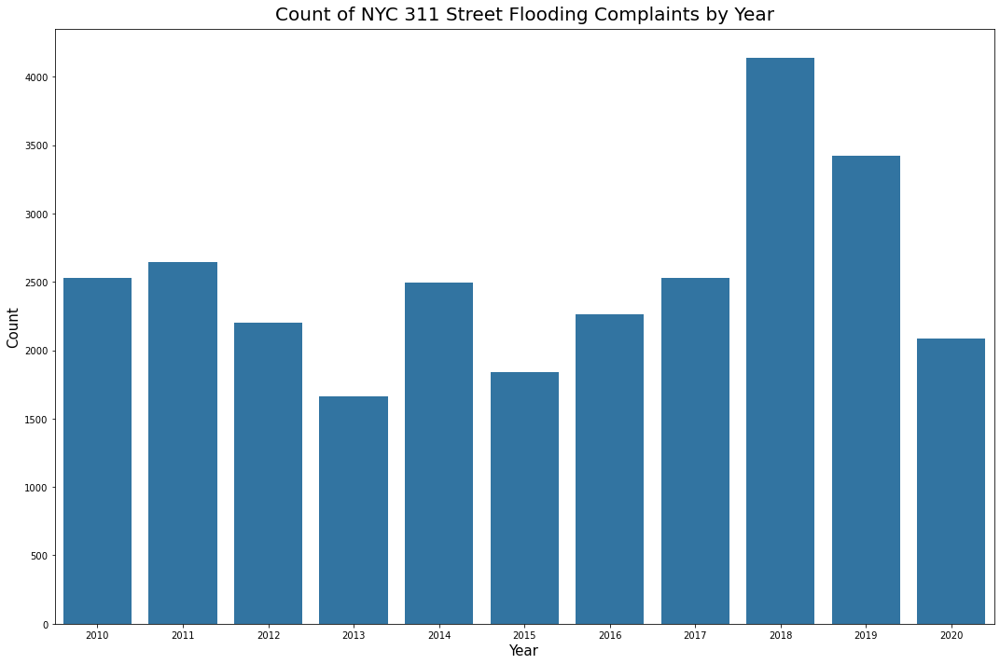

In [137]:
plt.figure(figsize=(15,10))

sns.countplot(x=flooding_311['year'],
              color='#1f77b4')

plt.title('Count of NYC 311 Street Flooding Complaints by Year', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [138]:
flooding_311.borough.value_counts()

QUEENS           11011
BROOKLYN          7094
STATEN ISLAND     5010
MANHATTAN         2613
BRONX             2071
Unspecified         18
Name: borough, dtype: int64

In [139]:
flooding_311.loc[flooding_311.borough != 'Unspecified'].borough.value_counts()

QUEENS           11011
BROOKLYN          7094
STATEN ISLAND     5010
MANHATTAN         2613
BRONX             2071
Name: borough, dtype: int64

In [140]:
flooding_311 = flooding_311.loc[flooding_311.borough != 'Unspecified']

flooding_311.borough.value_counts()

QUEENS           11011
BROOKLYN          7094
STATEN ISLAND     5010
MANHATTAN         2613
BRONX             2071
Name: borough, dtype: int64

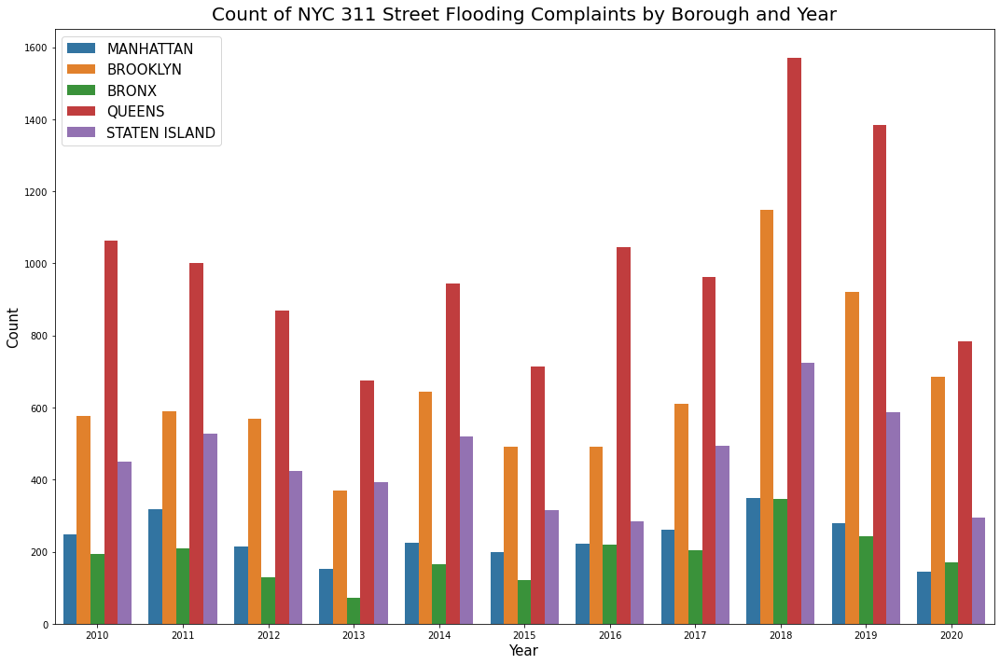

In [141]:
plt.figure(figsize=(15,10))

sns.countplot(x="year", 
              data=flooding_311,
              hue='borough')


plt.title('Count of NYC 311 Street Flooding Complaints by Borough and Year', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

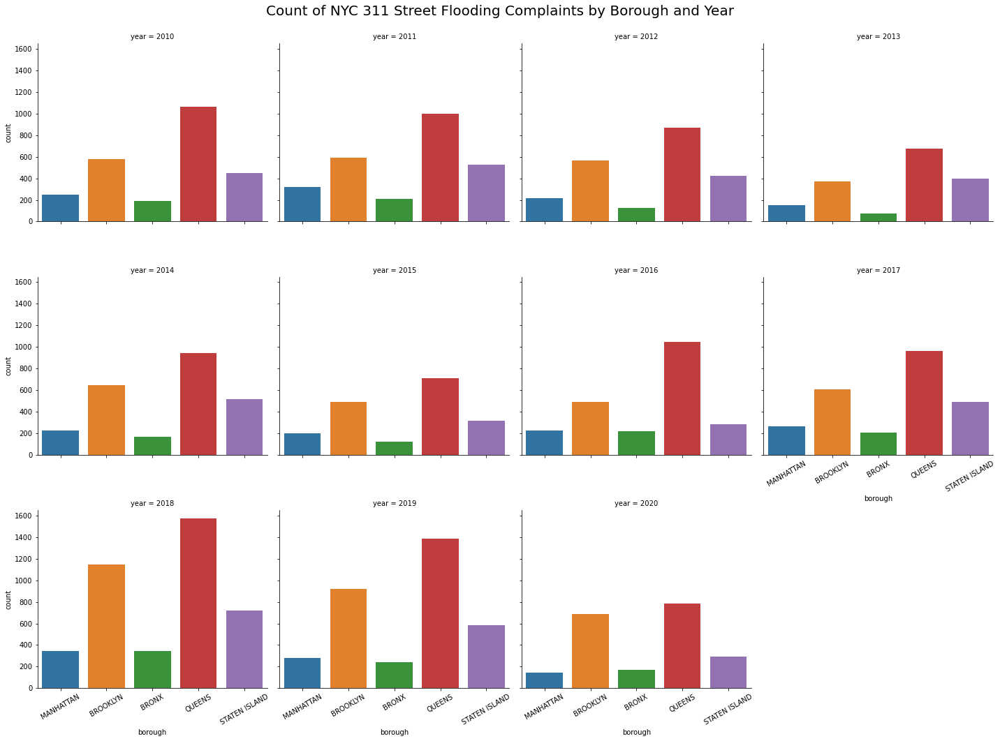

In [142]:
g = sns.catplot(x="borough",
                col="year",
                data=flooding_311,
                kind='count',
                col_wrap=4)

g.set_xticklabels(rotation=30)

plt.suptitle('Count of NYC 311 Street Flooding Complaints by Borough and Year\n', 
          fontsize=20)
plt.subplots_adjust(top=0.9)
plt.tight_layout()

In [143]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,MANHATTAN,40.86,-73.92,"{'latitude': '40.8630205', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,nan,2018
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,BROOKLYN,40.59,-73.94,"{'latitude': '40.5921398', 'longitude': '-73.9...",2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00,2018
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,BRONX,40.86,-73.89,"{'latitude': '40.8648137', 'longitude': '-73.8...",2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00,2018
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,BROOKLYN,40.62,-73.99,"{'latitude': '40.6237568', 'longitude': '-73.9...",1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00,2018
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,BROOKLYN,40.68,-73.87,"{'latitude': '40.684147', 'longitude': '-73.87...",103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00,2018


In [144]:
stacked_bar = pd.pivot_table(flooding_311, 
                             values='unique_key', 
                             index=['year'], 
                             columns = ['borough'], 
                             aggfunc=pd.Series.nunique)

stacked_bar.rename({'unique_key': 'count'}, 
                   axis=1, 
                   inplace=True)

stacked_bar.index = stacked_bar.index.astype('int64')

print(stacked_bar.index.dtype)

int64


In [145]:
stacked_bar.head()

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,193,576,248,1064,450
2011,208,589,317,1000,527
2012,128,568,215,869,423
2013,72,370,152,676,394
2014,166,644,225,944,519


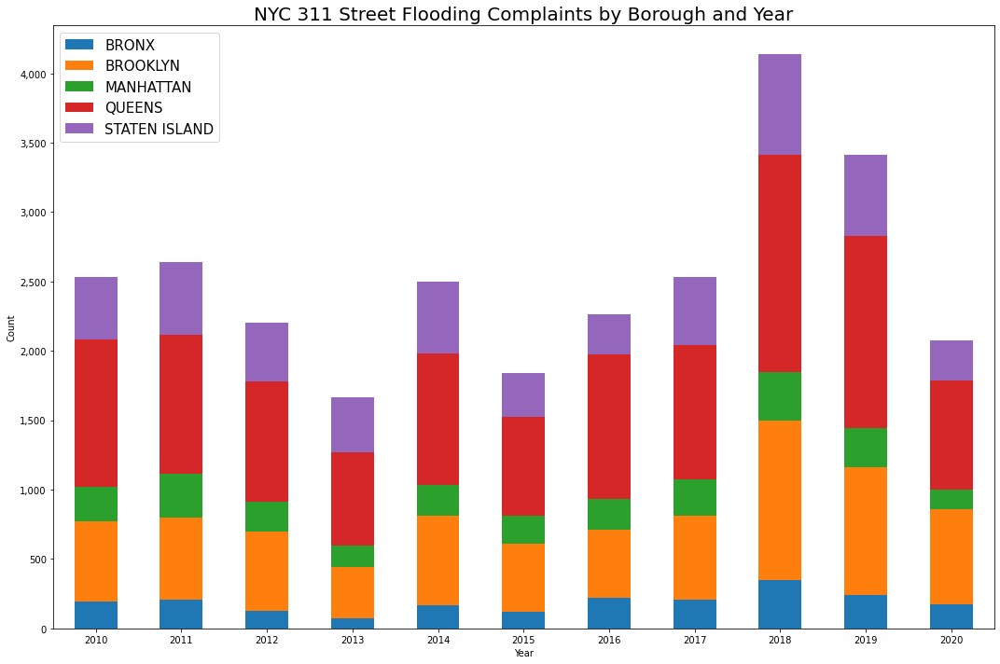

In [146]:
fig, ax = plt.subplots(figsize=(15,10))

stacked_bar.plot.bar(stacked=True, ax=ax)

ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.ylabel('Count')
plt.xlabel('Year')
plt.title('NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:304: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
/Users/geribauer/anaconda3/li

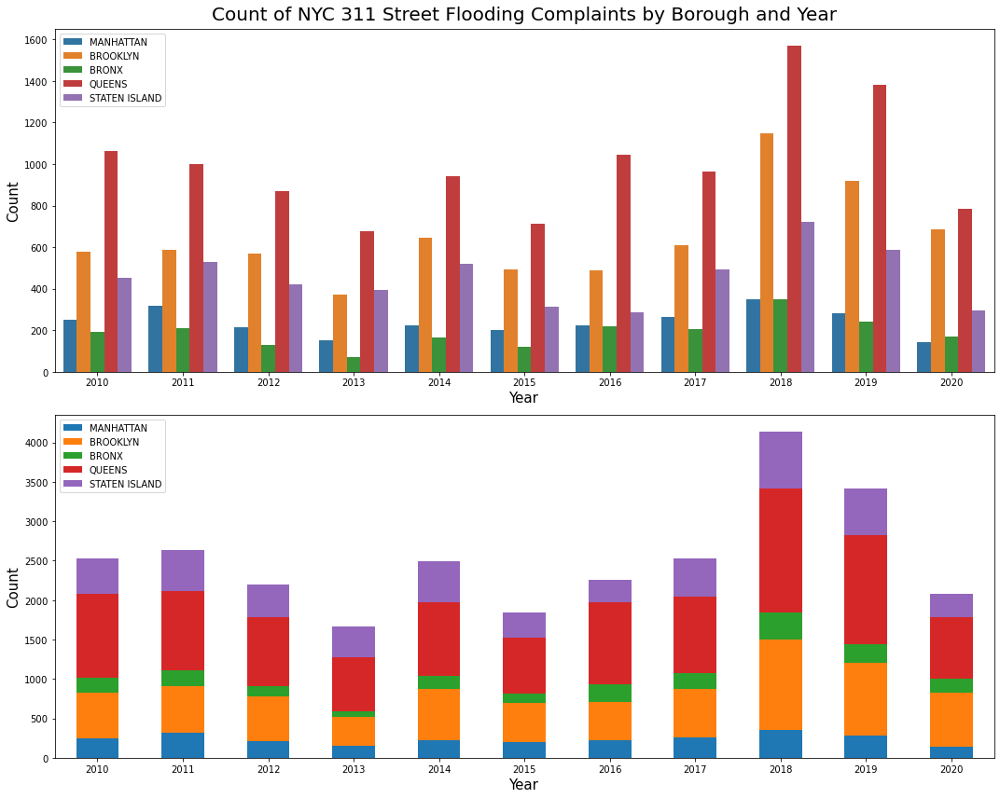

In [147]:
fig, axs = plt.subplots(2, 1, sharey=False, figsize=(15, 12))

sns.countplot(x="year", 
              data=flooding_311,
              hue='borough',
              ax=axs[0])


axs[0].set_title('Count of NYC 311 Street Flooding Complaints by Borough and Year', 
          fontsize=20,
          pad=10)
axs[0].set_ylabel('Count', fontsize=15)
axs[0].set_xlabel('Year', fontsize=15)
axs[0].legend(loc=2, fontsize=10)


stacked_bar = stacked_bar[['MANHATTAN', 'BROOKLYN', 'BRONX', 'QUEENS', 'STATEN ISLAND']]
stacked_bar.plot.bar(stacked=True, 
                     ax=axs[1])

# axs[1].set_title('CountNYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.xticks(rotation=0)
axs[1].set_ylabel('Count', fontsize=15)
axs[1].set_xlabel('Year', fontsize=15)
axs[1].legend(loc=2, fontsize=10)

plt.tight_layout()

In [148]:
pivot_table = pd.pivot_table(flooding_311, 
                             values='unique_key', 
                             index=['year'], 
                             columns = ['borough'], 
                             aggfunc=pd.Series.nunique)

pivot_table.rename({'unique_key': 'count'}, axis=1, inplace=True)
pivot_table.index = pivot_table.index.astype('int64')

print(pivot_table.index.dtype)

int64


In [149]:
pivot_table.head()

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,193,576,248,1064,450
2011,208,589,317,1000,527
2012,128,568,215,869,423
2013,72,370,152,676,394
2014,166,644,225,944,519


In [150]:
pivot_table.columns

Index(['BRONX', 'BROOKLYN', 'MANHATTAN', 'QUEENS', 'STATEN ISLAND'], dtype='object', name='borough')

In [151]:
pivot_table = pivot_table[['BRONX', 'BROOKLYN', 'MANHATTAN', 'QUEENS', 'STATEN ISLAND']]

pivot_table.head()

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,193,576,248,1064,450
2011,208,589,317,1000,527
2012,128,568,215,869,423
2013,72,370,152,676,394
2014,166,644,225,944,519


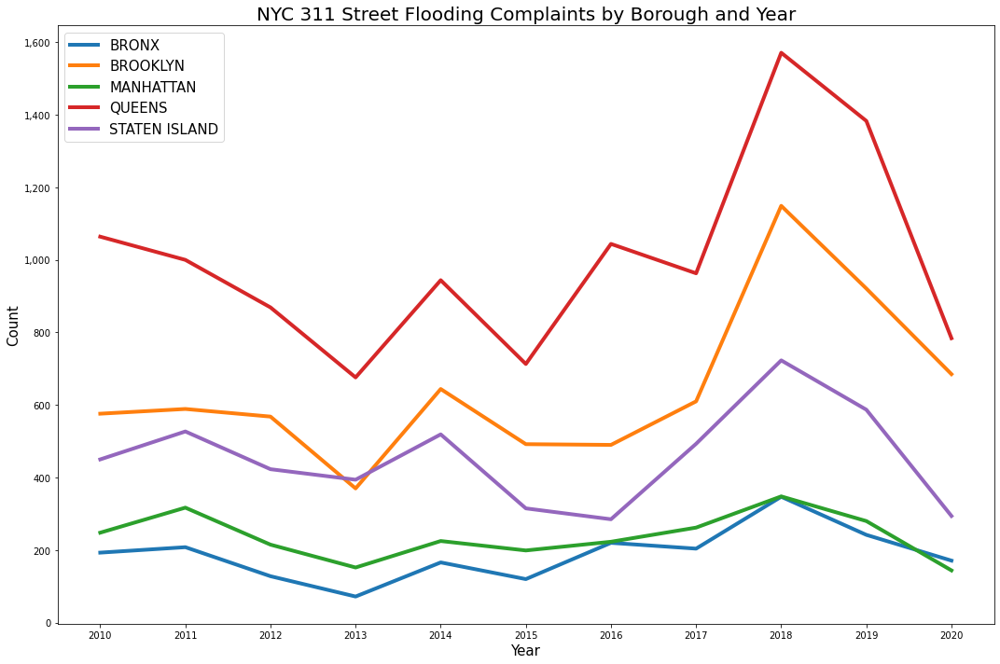

In [152]:
fig, ax = plt.subplots(figsize=(15,10))

ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

ax.xaxis.set_major_locator(plt.MultipleLocator(1))

pivot_table.plot.line(ax=ax, linewidth=4)

plt.xticks(rotation=0)
plt.ylabel('Count', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.title('NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

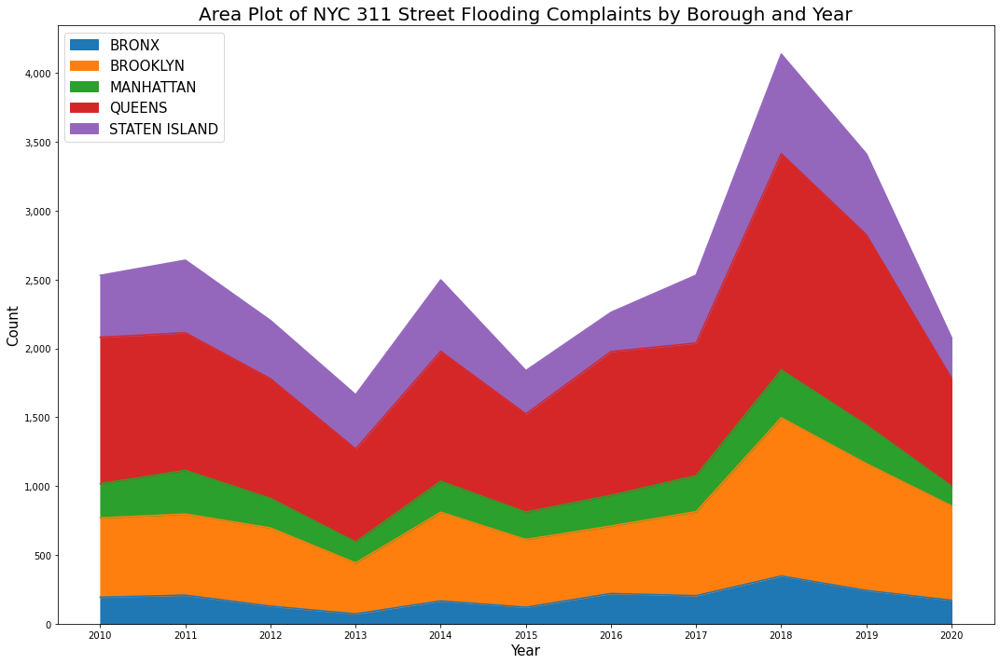

In [153]:
fig, ax = plt.subplots(figsize=(15,10))

ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

ax.xaxis.set_major_locator(plt.MultipleLocator(1))

pivot_table.plot.area(ax=ax)

plt.ylabel('Count', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.title('Area Plot of NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

In [154]:
pivot_table_cumsum = pivot_table.cumsum()
pivot_table_cumsum.head()

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,193,576,248,1064,450
2011,401,1165,565,2064,977
2012,529,1733,780,2933,1400
2013,601,2103,932,3609,1794
2014,767,2747,1157,4553,2313


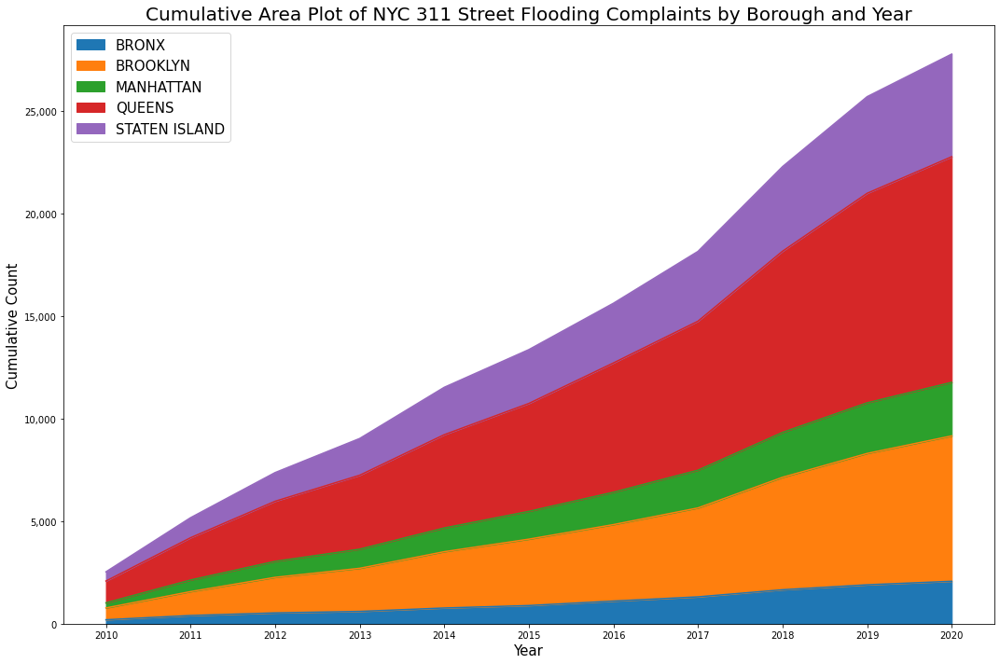

In [155]:
fig, ax = plt.subplots(figsize=(15,10))

ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

ax.xaxis.set_major_locator(plt.MultipleLocator(1))

pivot_table_cumsum.plot.area(ax=ax)

plt.xticks(rotation=0)
plt.ylabel('Cumulative Count', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.title('Cumulative Area Plot of NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

In [156]:
data_perc = pivot_table.divide(pivot_table.sum(axis=0), axis=1)

data_perc.head(len(data_perc))

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,0.09,0.08,0.09,0.10,0.09
2011,0.10,0.08,0.12,0.09,0.11
2012,0.06,0.08,0.08,0.08,0.08
2013,0.03,0.05,0.06,0.06,0.08
2014,0.08,0.09,0.09,0.09,0.10
2015,0.06,0.07,0.08,0.06,0.06
2016,0.11,0.07,0.09,0.09,0.06
2017,0.10,0.09,0.10,0.09,0.10
2018,0.17,0.16,0.13,0.14,0.14


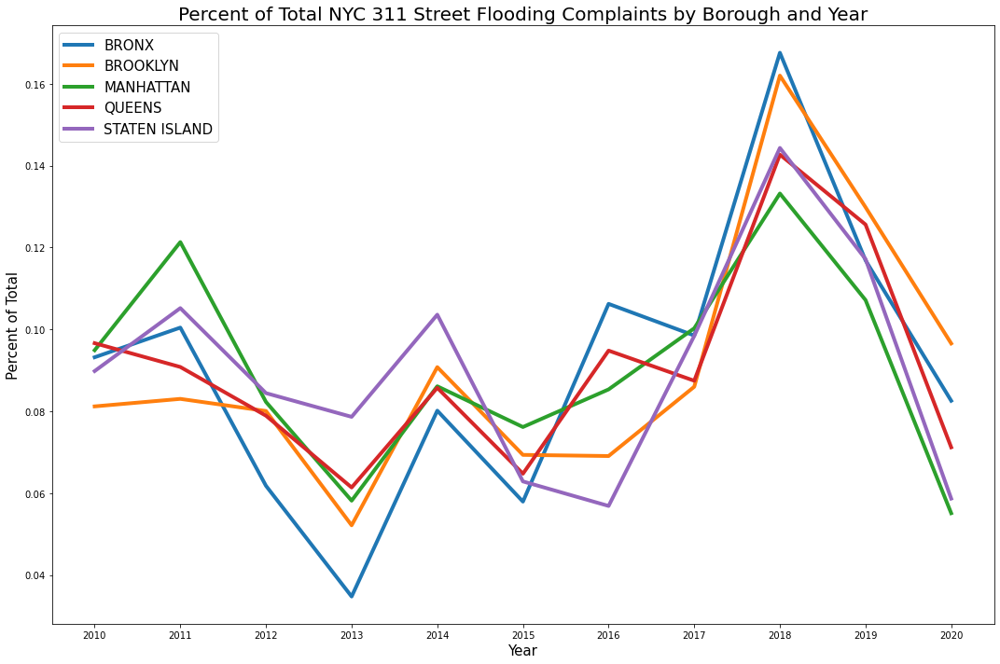

In [157]:
fig, ax = plt.subplots(figsize=(15,10))

ax.xaxis.set_major_locator(plt.MultipleLocator(1))

data_perc.plot(ax=ax, 
               linewidth=4)

plt.xticks(rotation=0)
plt.ylabel('Percent of Total', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.title('Percent of Total NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:304: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
/Users/geribauer/anaconda3/li

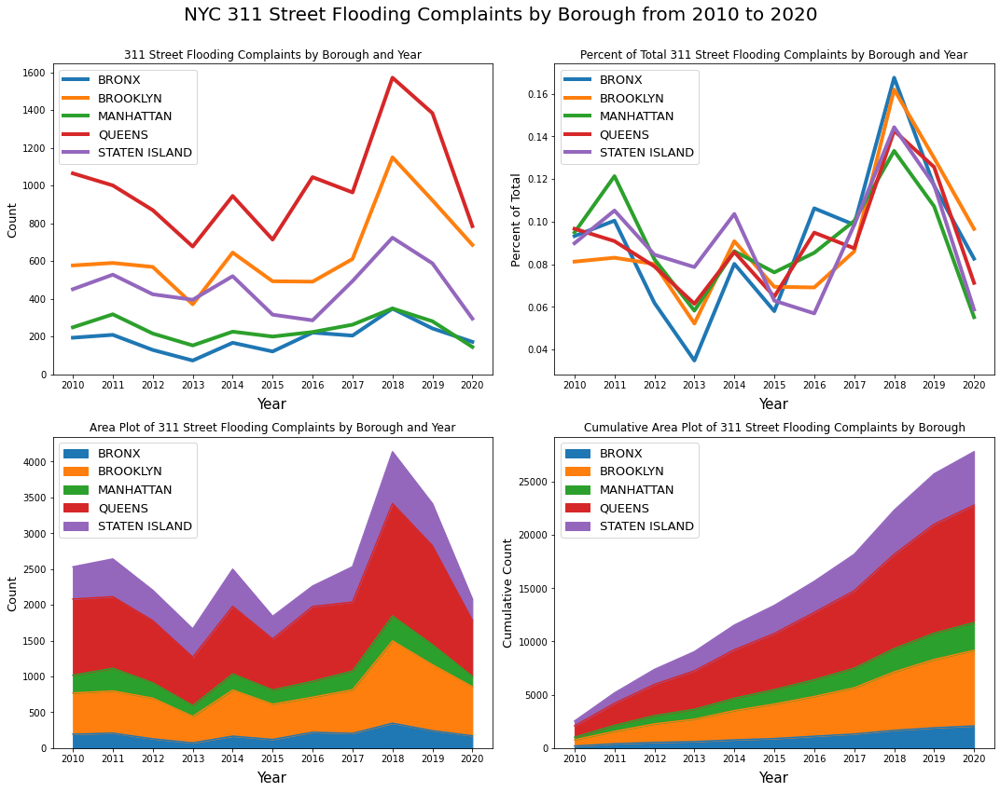

In [158]:
fig, axs = plt.subplots(2, 2, sharey=False, figsize=(15, 12))


pivot_table.plot.line(linewidth=4, ax=axs[0,0])
axs[0,0].xaxis.set_major_locator(plt.MultipleLocator(1))
axs[0,0].set_ylabel('Count', fontsize=13)
axs[0,0].set_title('311 Street Flooding Complaints by Borough and Year', fontsize=12)

data_perc.plot(ax=axs[0,1], linewidth=4)
axs[0,1].xaxis.set_major_locator(plt.MultipleLocator(1))
axs[0,1].tick_params(labelrotation=0)
axs[0,1].legend(loc=2, title='borough')
axs[0,1].set_ylabel('Percent of Total', fontsize=13)
axs[0,1].set_title('Percent of Total 311 Street Flooding Complaints by Borough and Year', fontsize=12)

pivot_table.plot.area(ax=axs[1,0])
axs[1,0].xaxis.set_major_locator(plt.MultipleLocator(1))
axs[1,0].set_ylabel('Count', fontsize=13)
axs[1,0].set_title('Area Plot of 311 Street Flooding Complaints by Borough and Year', fontsize=12)
    
pivot_table_cumsum.plot.area(ax=axs[1,1])
axs[1,1].xaxis.set_major_locator(plt.MultipleLocator(1))
axs[1,1].set_ylabel('Cumulative Count', fontsize=13)
axs[1,1].set_title('Cumulative Area Plot of 311 Street Flooding Complaints by Borough', fontsize=12)


for ax in axs.flat:
    ax.set_xlabel('Year', fontsize=15, labelpad=8) 
    ax.legend(loc=2, fontsize=13)

fig.suptitle('NYC 311 Street Flooding Complaints by Borough from 2010 to 2020\n', fontsize=20) 

plt.tight_layout()

In [159]:
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27799 entries, 0 to 27816
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   unique_key                      27799 non-null  int64         
 1   created_date                    27799 non-null  datetime64[ns]
 2   closed_date                     27786 non-null  object        
 3   agency                          27799 non-null  object        
 4   agency_name                     27799 non-null  object        
 5   complaint_type                  27799 non-null  object        
 6   descriptor                      27799 non-null  object        
 7   incident_zip                    26947 non-null  float64       
 8   intersection_street_1           10064 non-null  object        
 9   intersection_street_2           10064 non-null  object        
 10  address_type                    27796 non-null  object        
 11  ci

In [160]:
flooding_311['year_month_day'] = flooding_311['created_date'].dt.strftime('%Y-%m-%d')
flooding_311['year_month'] = flooding_311['created_date'].dt.strftime('%Y-%m')
flooding_311['year_month_week'] = flooding_311['created_date'].dt.strftime('%Y-%W')

flooding_311.year_month_day = pd.to_datetime(flooding_311.year_month_day)
flooding_311['year_month'] = pd.to_datetime(flooding_311.year_month)
flooding_311['year_month_week'] = pd.to_datetime(flooding_311.year_month_week + '0', format='%Y-%W%w')

In [161]:
create_date = [flooding_311.columns[1]]
print('Preview our original date column\n', create_date)

new_cols = list(flooding_311.iloc[:, -3:].columns)
print('Preview new columns\n', new_cols)

new_cols = create_date + new_cols 
print('Preview original and new columns\n', new_cols)

Preview our original date column
 ['created_date']
Preview new columns
 ['year_month_day', 'year_month', 'year_month_week']
Preview original and new columns
 ['created_date', 'year_month_day', 'year_month', 'year_month_week']


In [162]:
flooding_311[new_cols].head(10)

,created_date,year_month_day,year_month,year_month_week
0,2018-08-29 08:35:00,2018-08-29,2018-08-01,2018-09-02
1,2018-08-29 10:29:00,2018-08-29,2018-08-01,2018-09-02
2,2018-08-29 18:36:00,2018-08-29,2018-08-01,2018-09-02
3,2018-08-30 14:58:00,2018-08-30,2018-08-01,2018-09-02
4,2018-08-30 19:37:00,2018-08-30,2018-08-01,2018-09-02
5,2018-08-30 18:26:00,2018-08-30,2018-08-01,2018-09-02
6,2018-08-30 19:06:00,2018-08-30,2018-08-01,2018-09-02
7,2018-08-31 23:11:00,2018-08-31,2018-08-01,2018-09-02
8,2018-08-31 17:34:00,2018-08-31,2018-08-01,2018-09-02
9,2018-09-01 14:25:00,2018-09-01,2018-09-01,2018-09-02


In [163]:
flooding_311[new_cols].tail(10)

,created_date,year_month_day,year_month,year_month_week
27807,2018-08-24 16:31:00,2018-08-24,2018-08-01,2018-08-26
27808,2018-08-24 07:59:00,2018-08-24,2018-08-01,2018-08-26
27809,2018-08-24 13:43:00,2018-08-24,2018-08-01,2018-08-26
27810,2018-08-24 14:44:00,2018-08-24,2018-08-01,2018-08-26
27811,2018-08-25 10:41:00,2018-08-25,2018-08-01,2018-08-26
27812,2018-08-27 13:20:00,2018-08-27,2018-08-01,2018-09-02
27813,2018-08-28 23:04:00,2018-08-28,2018-08-01,2018-09-02
27814,2018-08-28 16:15:00,2018-08-28,2018-08-01,2018-09-02
27815,2018-08-28 23:17:00,2018-08-28,2018-08-01,2018-09-02
27816,2018-08-29 13:10:00,2018-08-29,2018-08-01,2018-09-02


In [164]:
flooding_311.iloc[:, -3:].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27799 entries, 0 to 27816
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   year_month_day   27799 non-null  datetime64[ns]
 1   year_month       27799 non-null  datetime64[ns]
 2   year_month_week  27799 non-null  datetime64[ns]
dtypes: datetime64[ns](3)
memory usage: 2.1 MB


In [165]:
flooding_311.iloc[:, -3:].describe().T

,count,unique,top,freq,first,last
year_month_day,27799,3466,2017-05-05,247,2010-01-02,2020-12-24
year_month,27799,132,2018-11-01,710,2010-01-01,2020-12-01
year_month_week,27799,573,2014-05-04,336,2010-01-03,2020-12-27


In [166]:
flooding_311.iloc[:, -3:].isna().sum()

year_month_day     0
year_month         0
year_month_week    0
dtype: int64

In [167]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,year_month_day,year_month,year_month_week
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,"{'latitude': '40.8630205', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,nan,2018,2018-08-29,2018-08-01,2018-09-02
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,"{'latitude': '40.5921398', 'longitude': '-73.9...",2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00,2018,2018-08-29,2018-08-01,2018-09-02
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,"{'latitude': '40.8648137', 'longitude': '-73.8...",2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00,2018,2018-08-29,2018-08-01,2018-09-02
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,"{'latitude': '40.6237568', 'longitude': '-73.9...",1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00,2018,2018-08-30,2018-08-01,2018-09-02
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,"{'latitude': '40.684147', 'longitude': '-73.87...",103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00,2018,2018-08-30,2018-08-01,2018-09-02


In [168]:
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27799 entries, 0 to 27816
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   unique_key                      27799 non-null  int64         
 1   created_date                    27799 non-null  datetime64[ns]
 2   closed_date                     27786 non-null  object        
 3   agency                          27799 non-null  object        
 4   agency_name                     27799 non-null  object        
 5   complaint_type                  27799 non-null  object        
 6   descriptor                      27799 non-null  object        
 7   incident_zip                    26947 non-null  float64       
 8   intersection_street_1           10064 non-null  object        
 9   intersection_street_2           10064 non-null  object        
 10  address_type                    27796 non-null  object        
 11  ci

## 6.2 Frequencies

In [169]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily

year_month_day
2010-01-02    3
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
             ..
2020-12-20    3
2020-12-21    5
2020-12-22    3
2020-12-23    2
2020-12-24    5
Name: count, Length: 3466, dtype: int64

In [170]:
flooding_311_daily.isna().sum()

0

In [171]:
flooding_311_daily = flooding_311_daily.asfreq('D')

In [172]:
flooding_311_daily

year_month_day
2010-01-02   3.00
2010-01-03    nan
2010-01-04   1.00
2010-01-05   1.00
2010-01-06   4.00
             ... 
2020-12-20   3.00
2020-12-21   5.00
2020-12-22   3.00
2020-12-23   2.00
2020-12-24   5.00
Freq: D, Name: count, Length: 4010, dtype: float64

In [173]:
flooding_311_daily.isna().sum()

544

Text(0.5, 1.0, 'Histogram of 311 Street Flooding Complaints per Day')

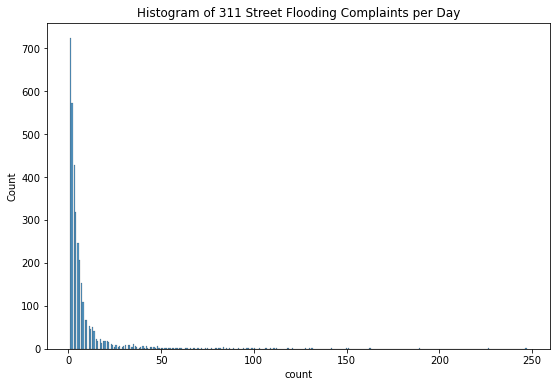

In [174]:
plt.figure(figsize=(9,6))

sns.histplot(flooding_311_daily)
plt.title('Histogram of 311 Street Flooding Complaints per Day')

In [175]:
flooding_311_daily.describe()

count   3466.00
mean       8.02
std       15.86
min        1.00
25%        2.00
50%        4.00
75%        7.00
max      247.00
Name: count, dtype: float64

In [176]:
flooding_311_daily.sort_values(ascending=False)

year_month_day
2017-05-05   247.00
2014-12-09   226.00
2014-04-30   189.00
2018-04-16   163.00
2013-05-08   162.00
              ...  
2020-10-25      nan
2020-11-04      nan
2020-11-08      nan
2020-12-12      nan
2020-12-19      nan
Name: count, Length: 4010, dtype: float64

In [177]:
flooding_311_daily.value_counts(dropna=False)

1.00      723
2.00      573
nan       544
3.00      427
4.00      319
         ... 
163.00      1
109.00      1
63.00       1
121.00      1
96.00       1
Name: count, Length: 106, dtype: int64

## 6.3 Resampling

A better way to extract different frequencies is to resample data based on daily observations. This is how I'll plot the subsequent figures.

In [178]:
print(flooding_311.shape)
flooding_311.head()

(27799, 34)


,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,year_month_day,year_month,year_month_week
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,"{'latitude': '40.8630205', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,nan,2018,2018-08-29,2018-08-01,2018-09-02
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,"{'latitude': '40.5921398', 'longitude': '-73.9...",2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00,2018,2018-08-29,2018-08-01,2018-09-02
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,"{'latitude': '40.8648137', 'longitude': '-73.8...",2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00,2018,2018-08-29,2018-08-01,2018-09-02
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,"{'latitude': '40.6237568', 'longitude': '-73.9...",1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00,2018,2018-08-30,2018-08-01,2018-09-02
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,"{'latitude': '40.684147', 'longitude': '-73.87...",103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00,2018,2018-08-30,2018-08-01,2018-09-02


In [179]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily

year_month_day
2010-01-02    3
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
             ..
2020-12-20    3
2020-12-21    5
2020-12-22    3
2020-12-23    2
2020-12-24    5
Name: count, Length: 3466, dtype: int64

In [180]:
flooding_311_daily.resample('D').sum()

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
             ..
2020-12-20    3
2020-12-21    5
2020-12-22    3
2020-12-23    2
2020-12-24    5
Freq: D, Name: count, Length: 4010, dtype: int64

In [181]:
# A one-liner but difficult to read the chained methods
flooding_311.groupby(by='year_month_day')['unique_key'].count().resample('D').sum()

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
             ..
2020-12-20    3
2020-12-21    5
2020-12-22    3
2020-12-23    2
2020-12-24    5
Freq: D, Name: unique_key, Length: 4010, dtype: int64

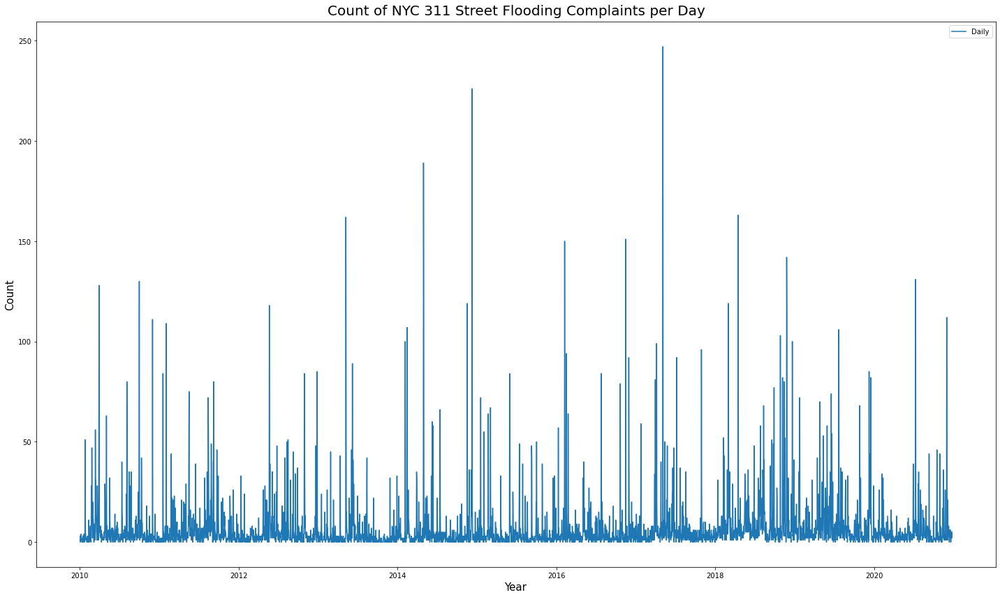

In [182]:
plt.figure(figsize=(20,12))

sns.lineplot(data=flooding_311_daily.resample('D').sum(), 
             label='Daily')

plt.title('Count of NYC 311 Street Flooding Complaints per Day', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [183]:
flooding_311_daily.resample('Y').sum()

year_month_day
2010-12-31    2531
2011-12-31    2641
2012-12-31    2203
2013-12-31    1664
2014-12-31    2498
2015-12-31    1839
2016-12-31    2262
2017-12-31    2532
2018-12-31    4138
2019-12-31    3413
2020-12-31    2078
Freq: A-DEC, Name: count, dtype: int64

In [184]:
flooding_311_daily.resample('YS').sum()

year_month_day
2010-01-01    2531
2011-01-01    2641
2012-01-01    2203
2013-01-01    1664
2014-01-01    2498
2015-01-01    1839
2016-01-01    2262
2017-01-01    2532
2018-01-01    4138
2019-01-01    3413
2020-01-01    2078
Freq: AS-JAN, Name: count, dtype: int64

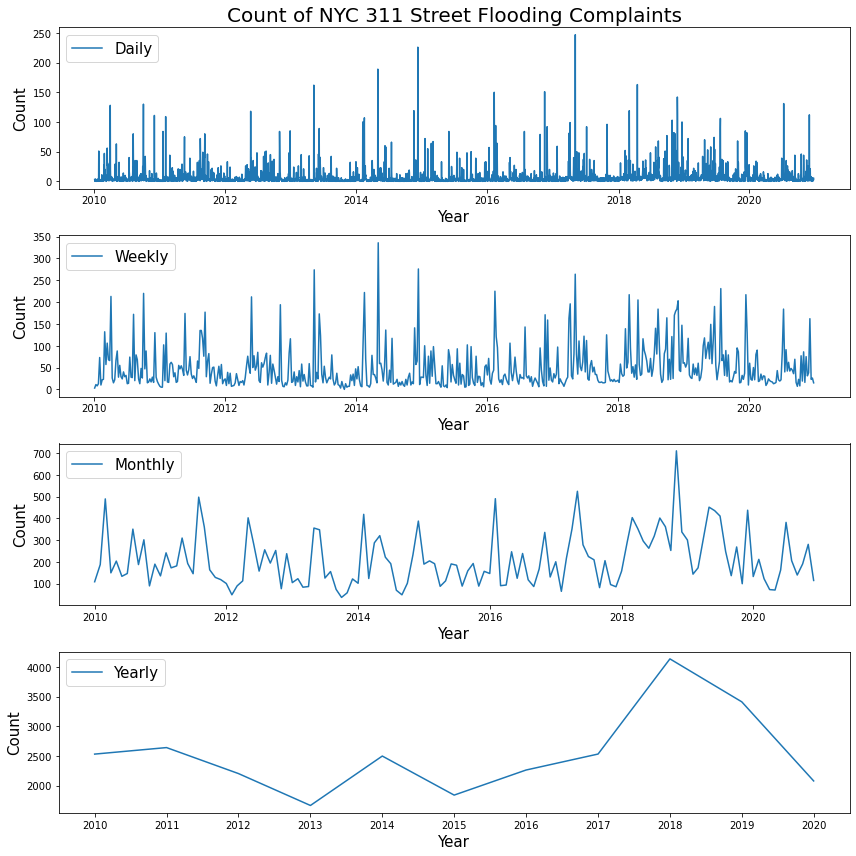

In [185]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, sharey=False, figsize=(12,12))

years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month

sns.lineplot(data=flooding_311_daily.resample('D').sum(), 
             label='Daily', 
             ax=ax1)
sns.lineplot(data=flooding_311_daily.resample('W').sum(), 
             label='Weekly', 
             ax=ax2)

sns.lineplot(data=flooding_311_daily.resample('MS').sum(), 
             label='Monthly', 
             ax=ax3)

sns.lineplot(data=flooding_311_daily.resample('YS').sum(), 
             label='Yearly', 
             ax=ax4) 

ax1.set_title('Count of NYC 311 Street Flooding Complaints', 
              fontsize=20)

lst = [ax1, ax2, ax3, ax4]
for i in range(len(lst)):
    lst[i].set_ylabel('Count', fontsize=15) 
    lst[i].set_xlabel('Year', fontsize=15)
    lst[i].legend(loc=2, fontsize=15)

plt.tight_layout()

## 6.4 Seasonality

In [186]:
flooding_311['month'] = flooding_311['created_date'].dt.month

In [187]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,year_month_day,year_month,year_month_week,month
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,NaN,NaN,NaN,NaN,nan,2018,2018-08-29,2018-08-01,2018-09-02,8
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,2468 EAST 27 STREET,EAST 27 STREET,AVENUE X,AVENUE Y,3074220734.00,2018,2018-08-29,2018-08-01,2018-09-02,8
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,2641 BAINBRIDGE AVENUE,BAINBRIDGE AVENUE,E 194 ST,E 196 ST,2032940001.00,2018,2018-08-29,2018-08-01,2018-09-02,8
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,1701 59 STREET,59 STREET,17 AVE,18 AVE,3055040001.00,2018,2018-08-30,2018-08-01,2018-09-02,8
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,103 PINE STREET,PINE STREET,RIDGEWOOD AVE,FULTON ST,3041300013.00,2018,2018-08-30,2018-08-01,2018-09-02,8


In [188]:
flooding_311['month'].describe()

count   27799.00
mean        6.52
std         3.31
min         1.00
25%         4.00
50%         6.00
75%         9.00
max        12.00
Name: month, dtype: float64

In [189]:
flooding_311.groupby(by=['year_month_day'])['unique_key'].count()

year_month_day
2010-01-02    3
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
             ..
2020-12-20    3
2020-12-21    5
2020-12-22    3
2020-12-23    2
2020-12-24    5
Name: unique_key, Length: 3466, dtype: int64

In [190]:
seasonality_month = flooding_311.groupby(by=['year_month_day'])['unique_key'].count()
seasonality_month.rename(index="count", inplace=True)

seasonality_month = seasonality_month.reset_index().set_index('year_month_day')
seasonality_month.head()

,count
year_month_day,
2010-01-02,3
2010-01-04,1
2010-01-05,1
2010-01-06,4
2010-01-07,3


In [191]:
seasonality_month = seasonality_month.resample('MS').sum()

seasonality_month.head()

,count
year_month_day,
2010-01-01,108
2010-02-01,187
2010-03-01,489
2010-04-01,149
2010-05-01,203


In [192]:
seasonality_month = seasonality_month.reset_index()
seasonality_month['month'] = seasonality_month['year_month_day'].dt.month

seasonality_month.head()

,year_month_day,count,month
0,2010-01-01,108,1
1,2010-02-01,187,2
2,2010-03-01,489,3
3,2010-04-01,149,4
4,2010-05-01,203,5


In [193]:
seasonality_month.tail()

,year_month_day,count,month
127,2020-08-01,205,8
128,2020-09-01,139,9
129,2020-10-01,190,10
130,2020-11-01,280,11
131,2020-12-01,114,12


In [194]:
seasonality_month[['month']].describe()

,month
count,132.00
mean,6.50
std,3.47
min,1.00
25%,3.75
50%,6.50
75%,9.25
max,12.00


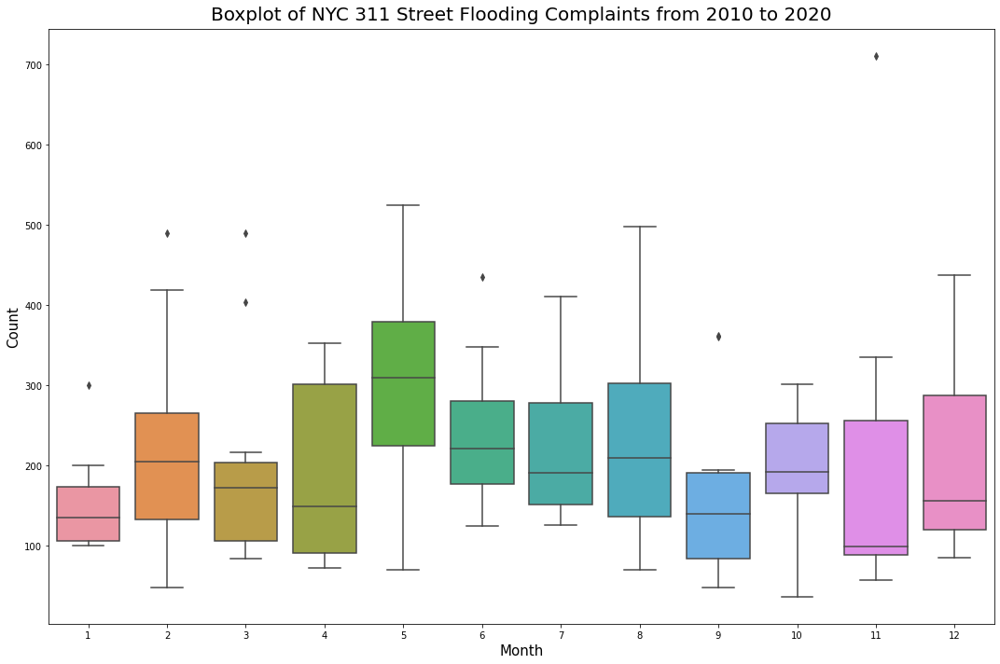

In [195]:
plt.figure(figsize=(15,10))

sns.boxplot(data=seasonality_month,
            x='month',
            y='count')

plt.title('Boxplot of NYC 311 Street Flooding Complaints from 2010 to 2020', 
          fontsize=20,
          pad=10)

plt.xlabel('Month', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [196]:
flooding_311['quarter'] = flooding_311['created_date'].dt.quarter

seasonality_quarter = flooding_311.groupby(by=['year_month_day'])['unique_key'].count()
seasonality_quarter.rename(index="count", inplace=True)

seasonality_quarter = seasonality_quarter.reset_index().set_index('year_month_day')
seasonality_quarter.head()

,count
year_month_day,
2010-01-02,3
2010-01-04,1
2010-01-05,1
2010-01-06,4
2010-01-07,3


In [197]:
seasonality_quarter = seasonality_quarter.resample('QS').sum()

seasonality_quarter.head()

,count
year_month_day,
2010-01-01,784
2010-04-01,485
2010-07-01,683
2010-10-01,579
2011-01-01,548


In [198]:
seasonality_quarter = seasonality_quarter.reset_index()
seasonality_quarter['quarter'] = seasonality_quarter['year_month_day'].dt.quarter

seasonality_quarter.head()

,year_month_day,count,quarter
0,2010-01-01,784,1
1,2010-04-01,485,2
2,2010-07-01,683,3
3,2010-10-01,579,4
4,2011-01-01,548,1


In [199]:
seasonality_quarter[['quarter']].describe()

,quarter
count,44.00
mean,2.50
std,1.13
min,1.00
25%,1.75
50%,2.50
75%,3.25
max,4.00


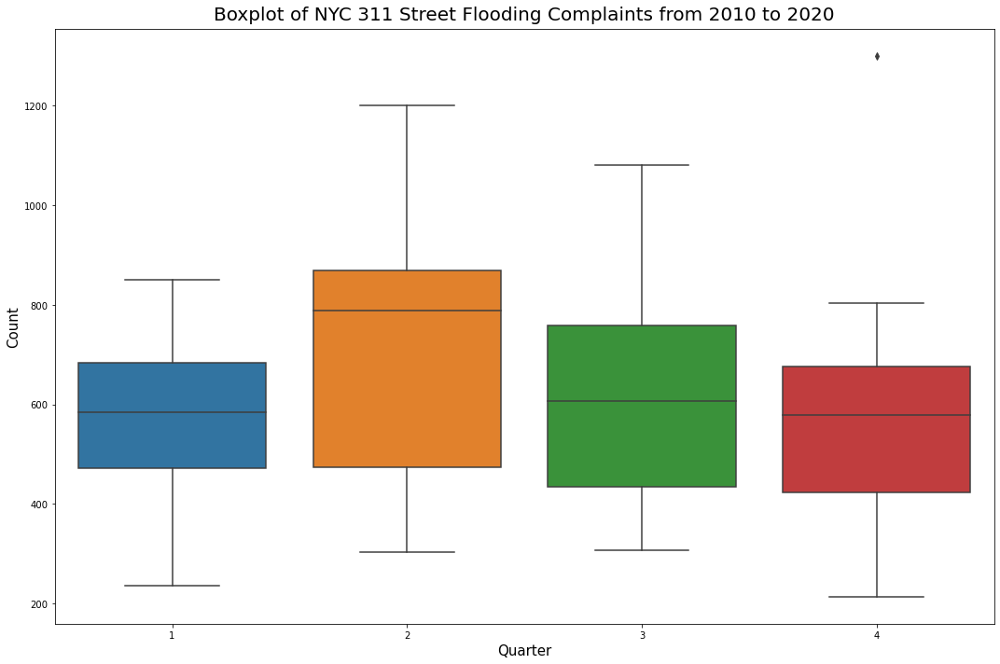

In [200]:
plt.figure(figsize=(15,10))

sns.boxplot(data=seasonality_quarter,
            x='quarter',
            y='count')

plt.title('Boxplot of NYC 311 Street Flooding Complaints from 2010 to 2020', 
          fontsize=20,
          pad=10)
plt.xlabel('Quarter', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [201]:
flooding_311['week_of_year'] = flooding_311['created_date'].dt.weekofyear

seasonality_week = flooding_311.groupby(by=['year_month_day'])['unique_key'].count()
seasonality_week.rename(index="count", inplace=True)

seasonality_week = seasonality_week.reset_index().set_index('year_month_day')
seasonality_week.head()

,count
year_month_day,
2010-01-02,3
2010-01-04,1
2010-01-05,1
2010-01-06,4
2010-01-07,3


In [202]:
seasonality_week = seasonality_week.resample('W').sum()

seasonality_week.head()

,count
year_month_day,
2010-01-03,3
2010-01-10,11
2010-01-17,8
2010-01-24,13
2010-01-31,73


In [203]:
seasonality_week = seasonality_week.reset_index()
seasonality_week['week_of_year'] = seasonality_week['year_month_day'].dt.weekofyear

seasonality_week.head()

,year_month_day,count,week_of_year
0,2010-01-03,3,53
1,2010-01-10,11,1
2,2010-01-17,8,2
3,2010-01-24,13,3
4,2010-01-31,73,4


In [204]:
seasonality_week[['week_of_year']].describe()

,week_of_year
count,574.00
mean,26.59
std,15.08
min,1.00
25%,14.00
50%,27.00
75%,40.00
max,53.00


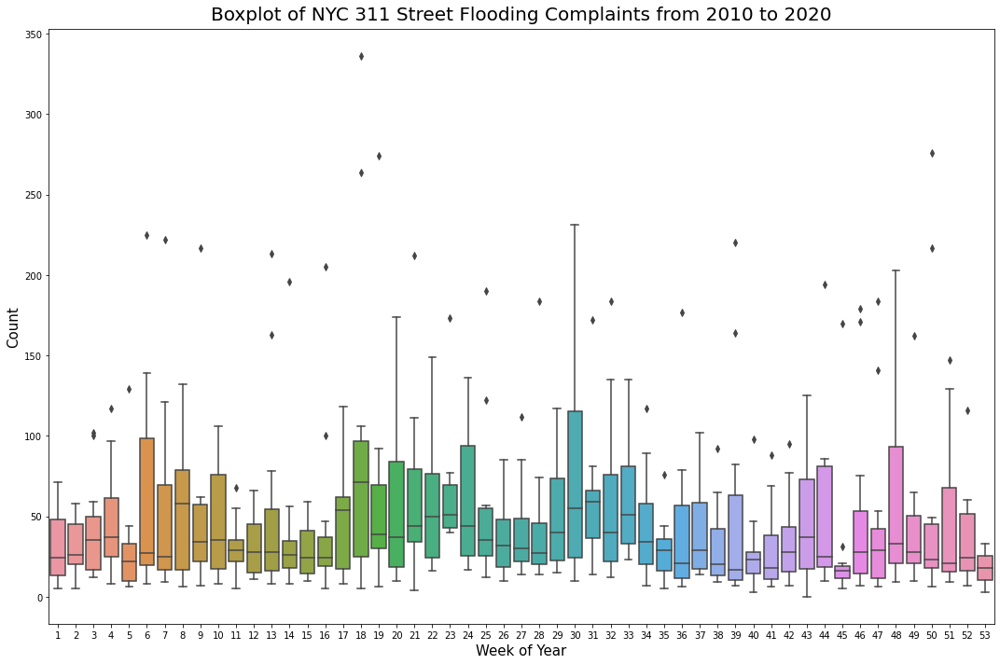

In [205]:
plt.figure(figsize=(15,10))

sns.boxplot(data=seasonality_week,
            x='week_of_year',
            y='count')

plt.title('Boxplot of NYC 311 Street Flooding Complaints from 2010 to 2020', 
          fontsize=20,
          pad=10)
plt.xlabel('Week of Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [206]:
flooding_311['day'] = flooding_311['created_date'].dt.day 

seasonality_day = flooding_311.groupby(by=['year_month_day'])['unique_key'].count()
seasonality_day.rename(index="count", inplace=True)

seasonality_day = seasonality_day.reset_index().set_index('year_month_day')
seasonality_day.head()

,count
year_month_day,
2010-01-02,3
2010-01-04,1
2010-01-05,1
2010-01-06,4
2010-01-07,3


In [207]:
seasonality_day = seasonality_day.resample('d').sum()

seasonality_day.head()

,count
year_month_day,
2010-01-02,3
2010-01-03,0
2010-01-04,1
2010-01-05,1
2010-01-06,4


In [208]:
seasonality_day = seasonality_day.reset_index()
seasonality_day['day'] = seasonality_day['year_month_day'].dt.day

seasonality_day.head()

,year_month_day,count,day
0,2010-01-02,3,2
1,2010-01-03,0,3
2,2010-01-04,1,4
3,2010-01-05,1,5
4,2010-01-06,4,6


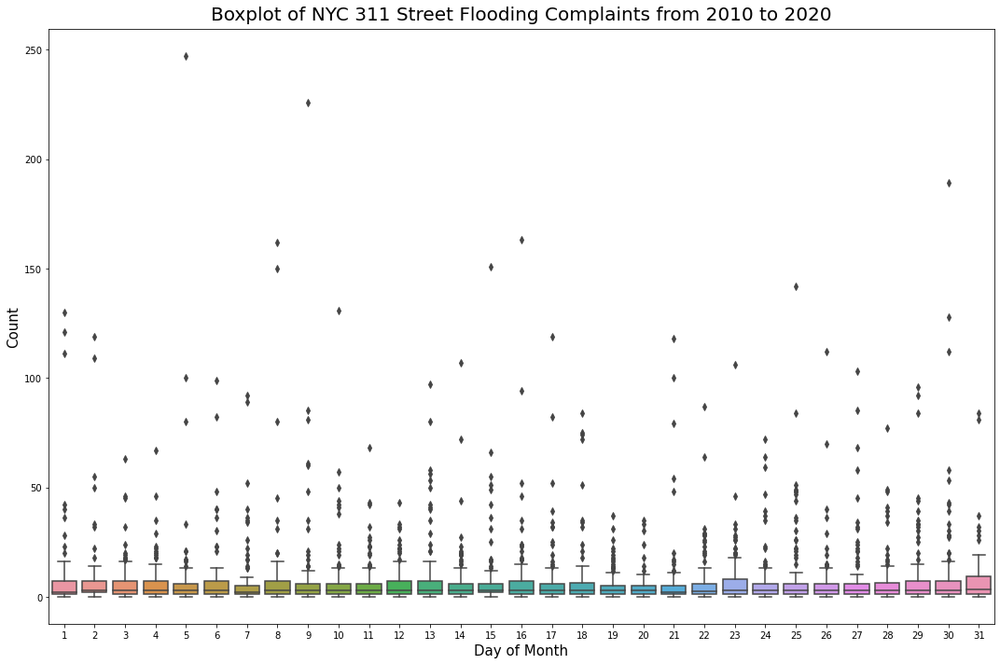

In [209]:
plt.figure(figsize=(15,10))

sns.boxplot(data=seasonality_day,
            x='day',
            y='count')

plt.title('Boxplot of NYC 311 Street Flooding Complaints from 2010 to 2020', 
          fontsize=20,
          pad=10)
plt.xlabel('Day of Month', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

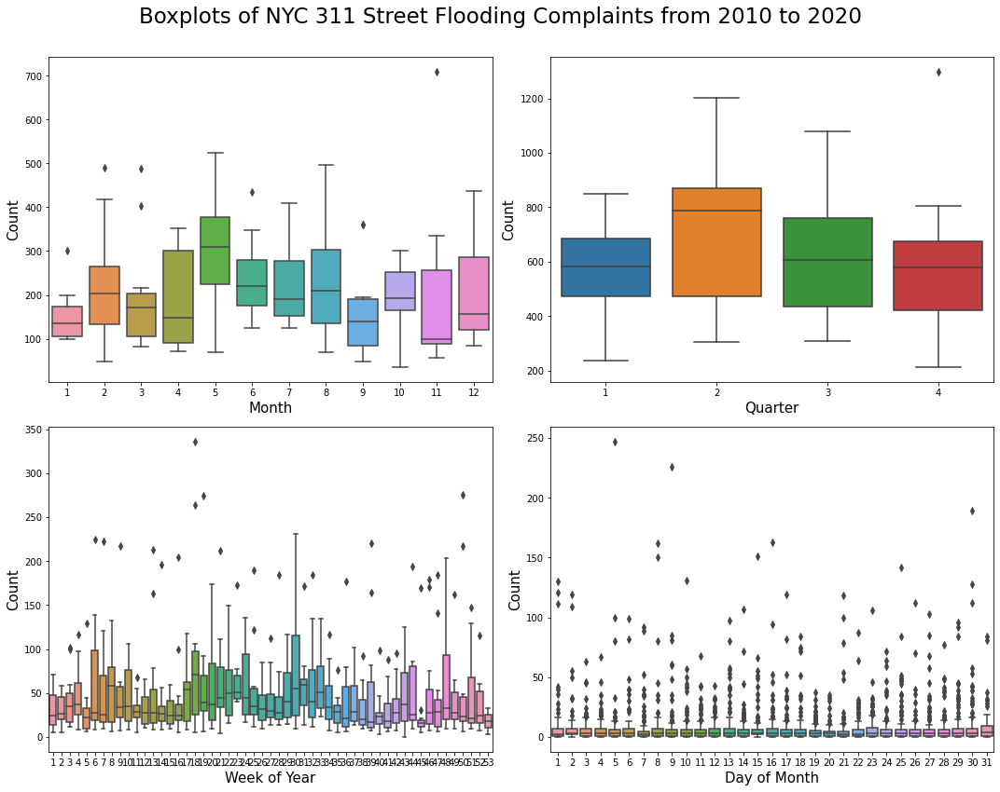

In [210]:
fig, axs = plt.subplots(2, 2, sharey=False, figsize=(15, 12))

sns.boxplot(data=seasonality_month,
            x='month',
            y='count',
            ax=axs[0,0])
axs[0,0].set_xlabel('Month', fontsize=15)

sns.boxplot(data=seasonality_quarter,
            x='quarter',
            y='count',
            ax=axs[0,1])
axs[0,1].set_xlabel('Quarter', fontsize=15)

sns.boxplot(data=seasonality_week,
            x='week_of_year',
            y='count',
            ax=axs[1,0])
axs[1,0].set_xlabel('Week of Year', fontsize=15)
sns.boxplot(data=seasonality_day,
            x='day',
            y='count',
            ax=axs[1,1])
axs[1,1].set_xlabel('Day of Month', fontsize=15)

for ax in axs.flat:
    ax.set_ylabel('Count', fontsize=15)

fig.suptitle('Boxplots of NYC 311 Street Flooding Complaints from 2010 to 2020\n', fontsize=23)

plt.tight_layout()

# 6.5 Resampling for Frequency Average

In [211]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily = flooding_311_daily.resample('D').sum()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily.head(10)

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
2010-01-08    1
2010-01-09    1
2010-01-10    0
2010-01-11    0
Freq: D, Name: count, dtype: int64

In [212]:
weekly_mean = flooding_311_daily.resample('W').mean()
monthly_mean = flooding_311_daily.resample('MS').mean()
yearly_mean = flooding_311_daily.resample('YS').mean()

In [213]:
weekly_mean.head()

year_month_day
2010-01-03    1.50
2010-01-10    1.57
2010-01-17    1.14
2010-01-24    1.86
2010-01-31   10.43
Freq: W-SUN, Name: count, dtype: float64

In [214]:
monthly_mean.head()

year_month_day
2010-01-01    3.60
2010-02-01    6.68
2010-03-01   15.77
2010-04-01    4.97
2010-05-01    6.55
Freq: MS, Name: count, dtype: float64

In [215]:
yearly_mean.head()

year_month_day
2010-01-01   6.95
2011-01-01   7.24
2012-01-01   6.02
2013-01-01   4.56
2014-01-01   6.84
Freq: AS-JAN, Name: count, dtype: float64

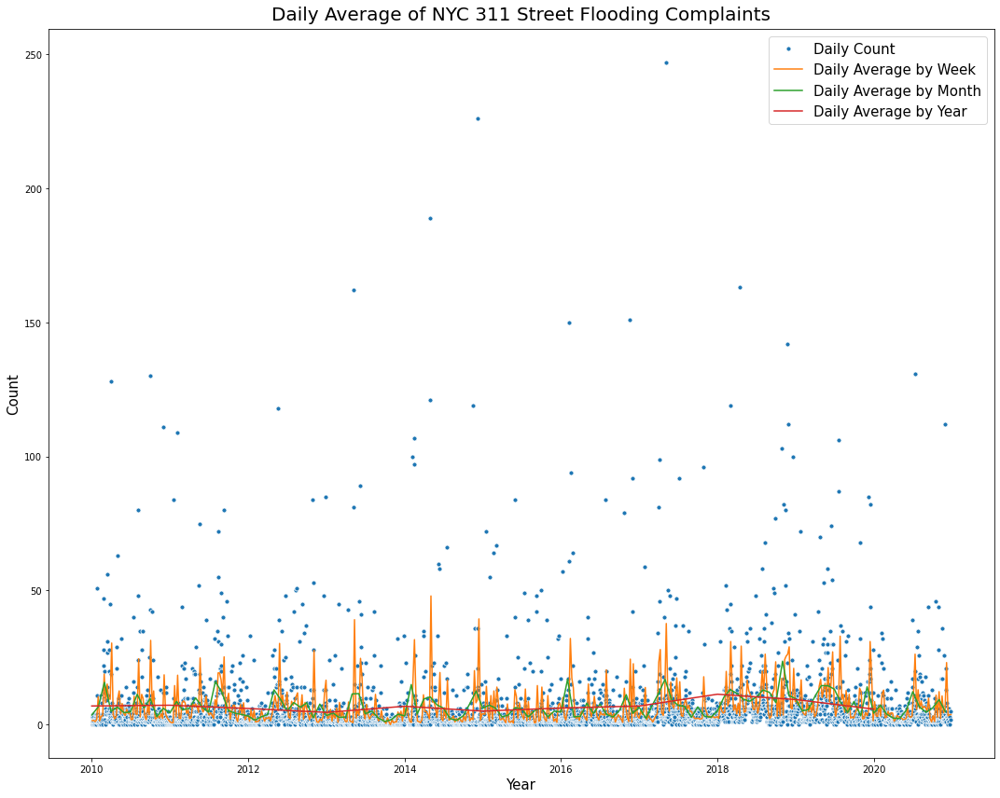

In [216]:
plt.figure(figsize=(15, 12))

sns.lineplot(data=flooding_311_daily, marker='.', markersize=10, linewidth=0, label='Daily Count')
sns.lineplot(data=weekly_mean, label='Daily Average by Week')
sns.lineplot(data=monthly_mean, label='Daily Average by Month')
sns.lineplot(data=yearly_mean, label='Daily Average by Year')

plt.title('Daily Average of NYC 311 Street Flooding Complaints', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.legend(fontsize=15)
plt.tight_layout()

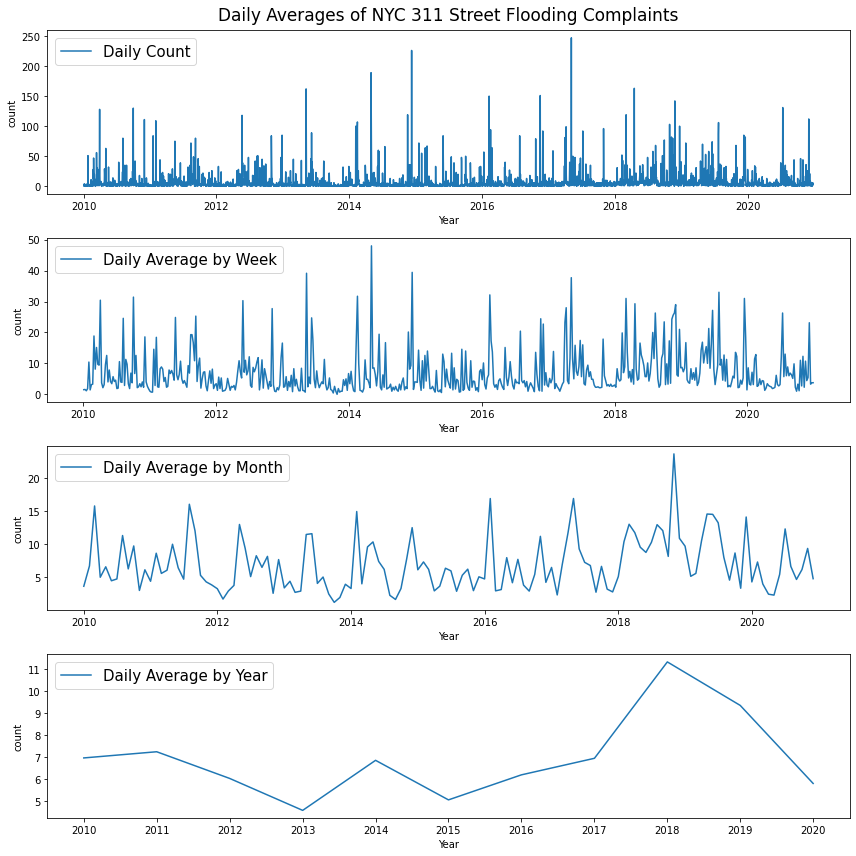

In [217]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, sharey=False, figsize=(12,12))

sns.lineplot(data=flooding_311_daily, 
             label='Daily Count', 
             ax=ax1)
sns.lineplot(data=weekly_mean, 
             label='Daily Average by Week', 
             ax=ax2)
sns.lineplot(data=monthly_mean, 
             label='Daily Average by Month', 
             ax=ax3)
sns.lineplot(data=yearly_mean, 
             label='Daily Average by Year', 
             ax=ax4)

ax1.set_title('Daily Averages of NYC 311 Street Flooding Complaints', 
              fontsize=17, 
              pad=10)

lst = [ax1, ax2, ax3, ax4]
for i in range(len(lst)):
    lst[i].set_xlabel('Year')
    lst[i].legend(loc=2, fontsize=15)
    
plt.tight_layout()

# 6.6 Rolling Averages

In [218]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily = flooding_311_daily.resample('D').sum()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily.head(10)

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
2010-01-08    1
2010-01-09    1
2010-01-10    0
2010-01-11    0
Freq: D, Name: count, dtype: int64

In [219]:
flooding_311_daily.rolling(7).mean().head(10)

year_month_day
2010-01-02    nan
2010-01-03    nan
2010-01-04    nan
2010-01-05    nan
2010-01-06    nan
2010-01-07    nan
2010-01-08   1.86
2010-01-09   1.57
2010-01-10   1.57
2010-01-11   1.43
Freq: D, Name: count, dtype: float64

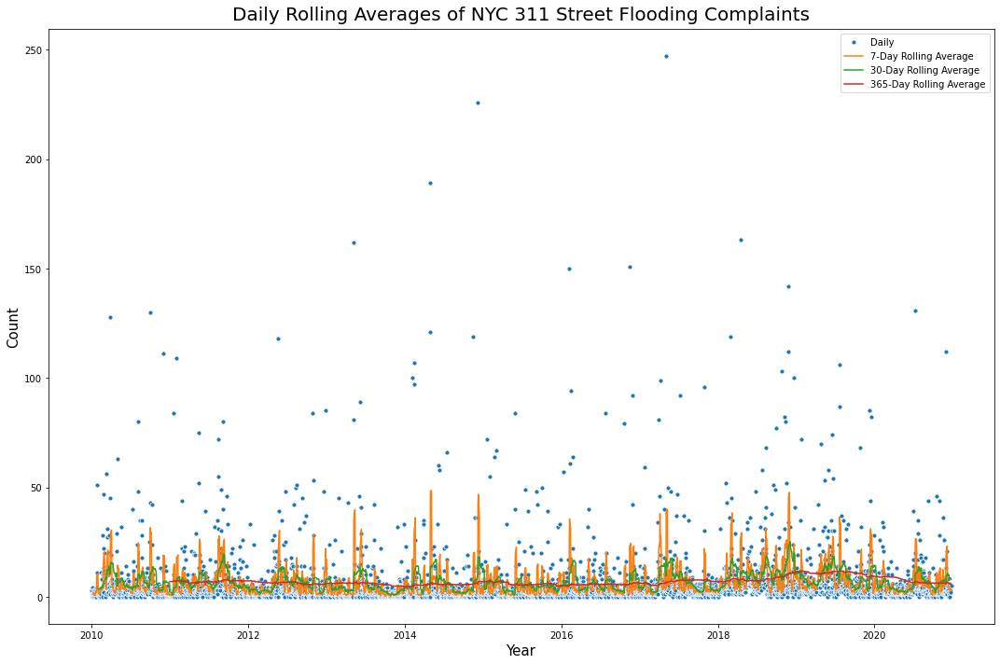

In [220]:
plt.figure(figsize=(15,10))

sns.lineplot(data=flooding_311_daily, marker='.', markersize=10, linewidth=0, label='Daily')
sns.lineplot(data=flooding_311_daily.rolling(7).mean(), label='7-Day Rolling Average')
sns.lineplot(data=flooding_311_daily.rolling(30).mean(), label='30-Day Rolling Average')
sns.lineplot(data=flooding_311_daily.rolling(365).mean(), label='365-Day Rolling Average')

plt.title('Daily Rolling Averages of NYC 311 Street Flooding Complaints', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

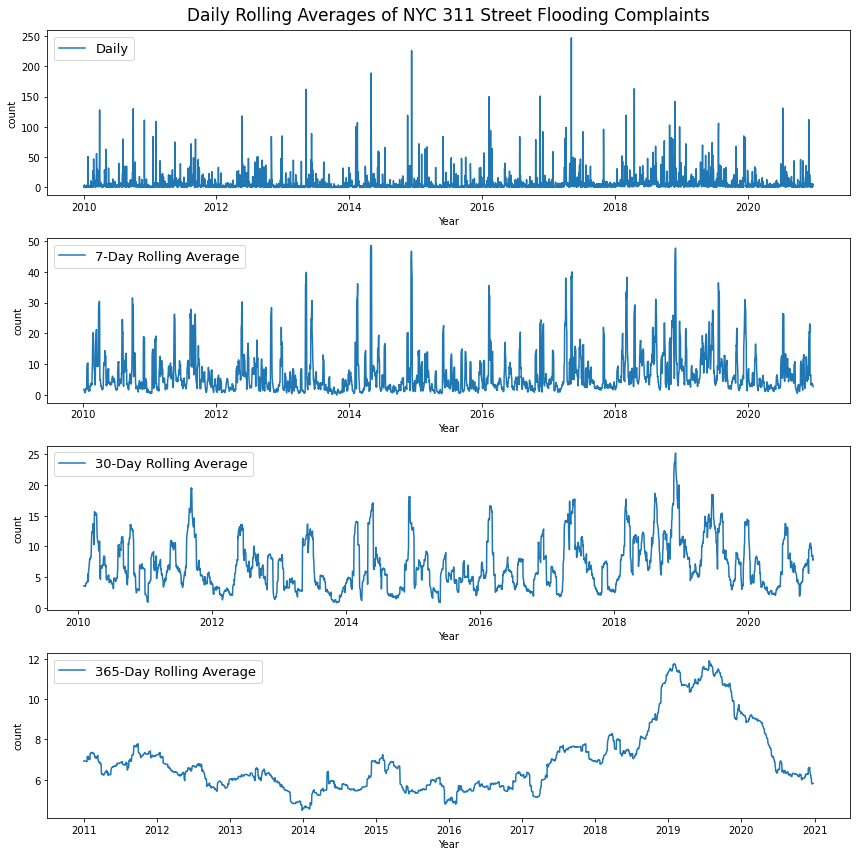

In [221]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, sharey=False, figsize=(12,12))

sns.lineplot(data=flooding_311_daily, 
             label='Daily', 
             ax=ax1)
sns.lineplot(data=flooding_311_daily.rolling(7).mean(), 
             label='7-Day Rolling Average', 
             ax=ax2)
sns.lineplot(data=flooding_311_daily.rolling(30).mean(), 
             label='30-Day Rolling Average', 
             ax=ax3)
sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax4)

ax1.set_title('Daily Rolling Averages of NYC 311 Street Flooding Complaints', 
              fontsize=17, 
              pad=10)

lst = [ax1, ax2, ax3, ax4]
for i in range(len(lst)):
    lst[i].set_xlabel('Year')  
    lst[i].legend(loc=2, fontsize=13)
    
plt.tight_layout()    

## 6.7 Additional Time Series Analysis

In [222]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,cross_street_2,bbl,year,year_month_day,year_month,year_month_week,month,quarter,week_of_year,day
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,NaN,nan,2018,2018-08-29,2018-08-01,2018-09-02,8,3,35,29
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,AVENUE Y,3074220734.00,2018,2018-08-29,2018-08-01,2018-09-02,8,3,35,29
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,E 196 ST,2032940001.00,2018,2018-08-29,2018-08-01,2018-09-02,8,3,35,29
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,18 AVE,3055040001.00,2018,2018-08-30,2018-08-01,2018-09-02,8,3,35,30
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,FULTON ST,3041300013.00,2018,2018-08-30,2018-08-01,2018-09-02,8,3,35,30


In [223]:
flooding_311['day_name'] = flooding_311['created_date'].dt.day_name()

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,bbl,year,year_month_day,year_month,year_month_week,month,quarter,week_of_year,day,day_name
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,nan,2018,2018-08-29,2018-08-01,2018-09-02,8,3,35,29,Wednesday
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,3074220734.00,2018,2018-08-29,2018-08-01,2018-09-02,8,3,35,29,Wednesday
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,2032940001.00,2018,2018-08-29,2018-08-01,2018-09-02,8,3,35,29,Wednesday
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,3055040001.00,2018,2018-08-30,2018-08-01,2018-09-02,8,3,35,30,Thursday
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,3041300013.00,2018,2018-08-30,2018-08-01,2018-09-02,8,3,35,30,Thursday


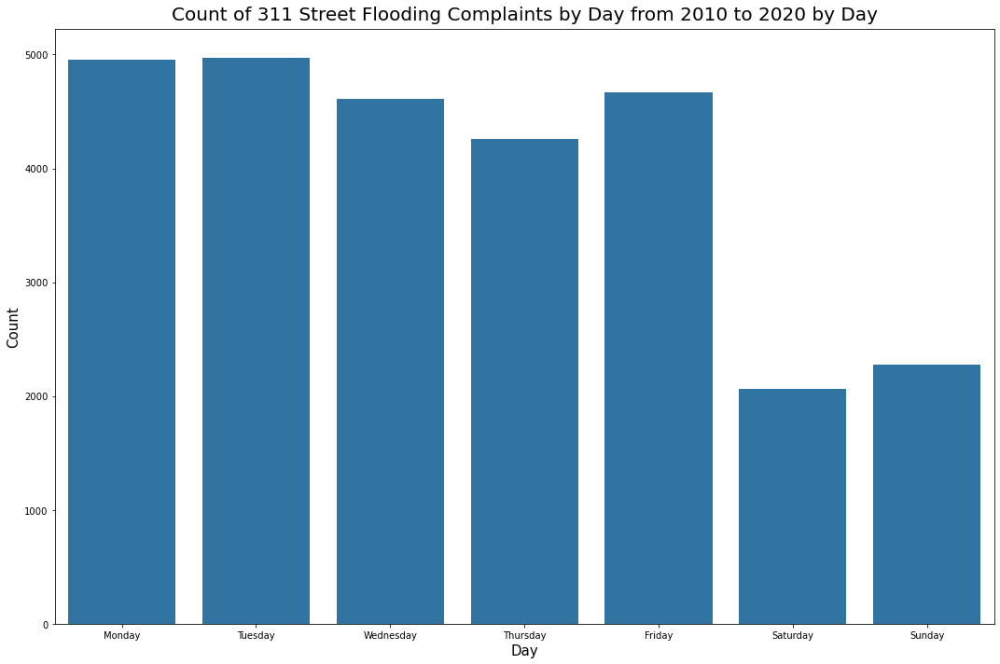

In [224]:
plt.figure(figsize=(15,10))

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

sns.countplot(x=flooding_311['day_name'],
              color='#1f77b4',
              order=order)

plt.title('Count of 311 Street Flooding Complaints by Day from 2010 to 2020 by Day', 
          fontsize=20,
          pad=10)
plt.xlabel('Day', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [225]:
flooding_311['hour'] = flooding_311['created_date'].dt.hour

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year,year_month_day,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,2018,2018-08-29,2018-08-01,2018-09-02,8,3,35,29,Wednesday,8
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,2018,2018-08-29,2018-08-01,2018-09-02,8,3,35,29,Wednesday,10
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,2018,2018-08-29,2018-08-01,2018-09-02,8,3,35,29,Wednesday,18
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,2018,2018-08-30,2018-08-01,2018-09-02,8,3,35,30,Thursday,14
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,2018,2018-08-30,2018-08-01,2018-09-02,8,3,35,30,Thursday,19


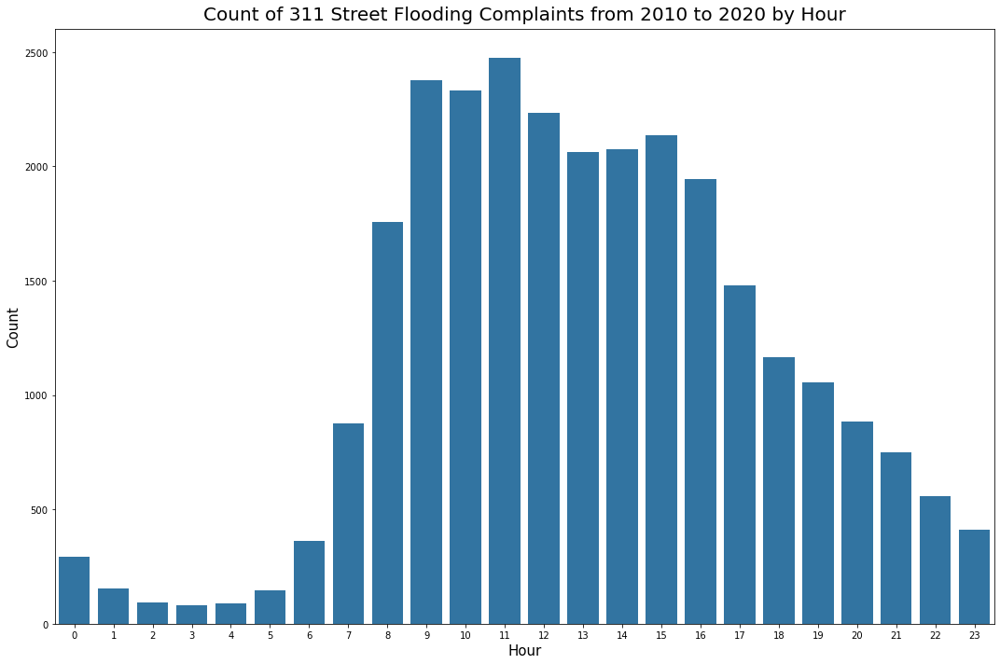

In [226]:
plt.figure(figsize=(15,10))

sns.countplot(x=flooding_311['hour'],
              color='#1f77b4')

plt.title('Count of 311 Street Flooding Complaints from 2010 to 2020 by Hour', 
          fontsize=20,
          pad=10)
plt.xlabel('Hour', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [227]:
flooding_311['time'] = flooding_311['created_date'].dt.time

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year_month_day,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour,time
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,2018-08-29,2018-08-01,2018-09-02,8,3,35,29,Wednesday,8,08:35:00
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,2018-08-29,2018-08-01,2018-09-02,8,3,35,29,Wednesday,10,10:29:00
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,2018-08-29,2018-08-01,2018-09-02,8,3,35,29,Wednesday,18,18:36:00
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,2018-08-30,2018-08-01,2018-09-02,8,3,35,30,Thursday,14,14:58:00
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,2018-08-30,2018-08-01,2018-09-02,8,3,35,30,Thursday,19,19:37:00


In [228]:
flooding_time = flooding_311.groupby(by='time')['unique_key'].count()
flooding_time.rename(index="count", inplace=True)
flooding_time = flooding_time.reset_index()

flooding_time.head()

,time,count
0,00:00:00,73
1,00:01:00,6
2,00:02:00,6
3,00:03:00,4
4,00:04:00,6


In [229]:
flooding_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1382 entries, 0 to 1381
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   time    1382 non-null   object
 1   count   1382 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 21.7+ KB


In [230]:
flooding_time.time = pd.to_datetime(flooding_time.time, format='%H:%M:%S')
flooding_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1382 entries, 0 to 1381
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   time    1382 non-null   datetime64[ns]
 1   count   1382 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 21.7 KB


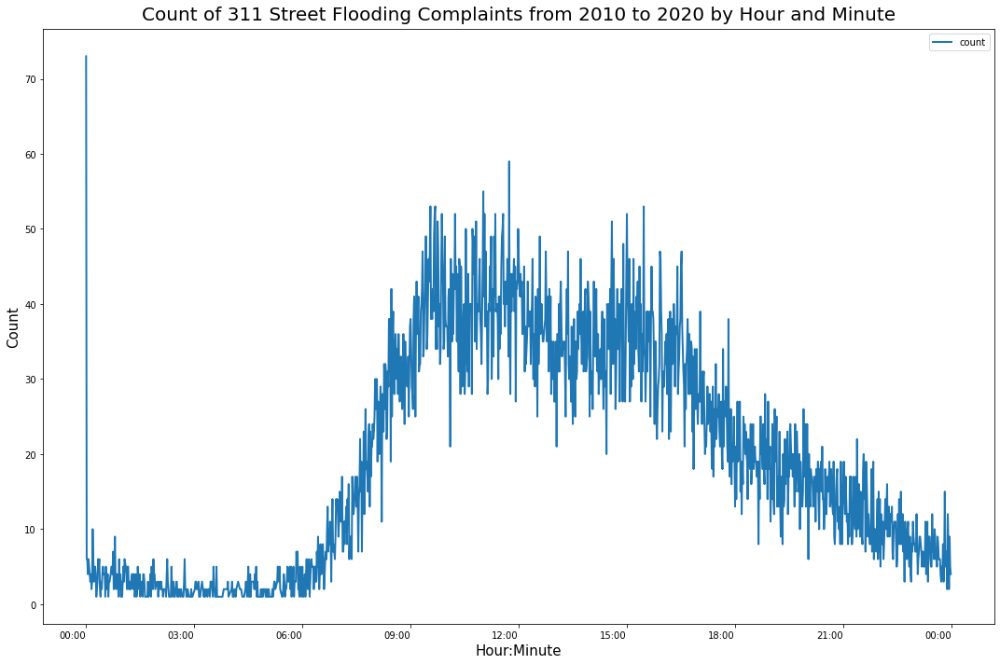

In [231]:
fig, ax = plt.subplots(figsize=(15,10))

myFmt = matplotlib.dates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(myFmt)

flooding_time.plot(x='time',
                   y='count',
                   ax=ax, 
                   rot=0,
                   color='#1f77b4', 
                   linewidth=2)

plt.title('Count of 311 Street Flooding Complaints from 2010 to 2020 by Hour and Minute', 
          fontsize=20,
          pad=10)
plt.xlabel('Hour:Minute', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [232]:
flooding_time.set_index('time', inplace=True)
flooding_time = flooding_time['count'].rolling(15).mean()
flooding_time

time
1900-01-01 00:00:00    nan
1900-01-01 00:01:00    nan
1900-01-01 00:02:00    nan
1900-01-01 00:03:00    nan
1900-01-01 00:04:00    nan
                      ... 
1900-01-01 23:55:00   6.27
1900-01-01 23:56:00   6.00
1900-01-01 23:57:00   6.33
1900-01-01 23:58:00   6.47
1900-01-01 23:59:00   6.40
Name: count, Length: 1382, dtype: float64

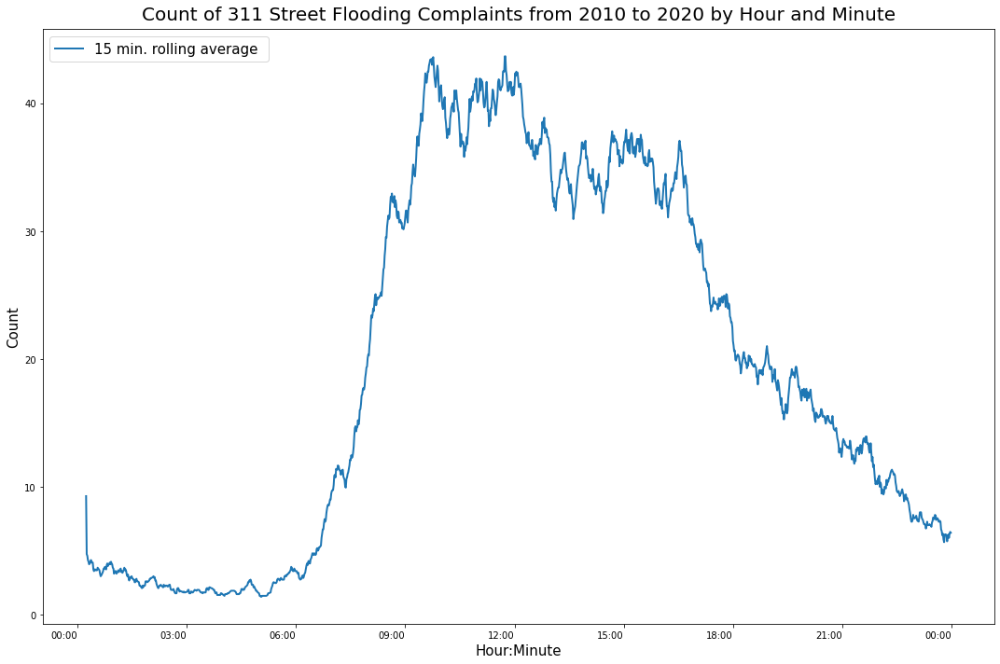

In [233]:
fig, ax = plt.subplots(figsize=(15,10))

myFmt = matplotlib.dates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(myFmt)

flooding_time.plot(y='count',
                   ax=ax, 
                   rot=0,
                   color='#1f77b4', 
                   linewidth=2,
                   label='15 min. rolling average ', 
                   legend=True)

plt.title('Count of 311 Street Flooding Complaints from 2010 to 2020 by Hour and Minute', 
          fontsize=20,
          pad=10)
plt.legend(loc=2, fontsize=15)
plt.xlabel('Hour:Minute', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [234]:
flooding_311['am_pm'] = flooding_311['created_date'].dt.strftime('%p')

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour,time,am_pm
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,2018-08-01,2018-09-02,8,3,35,29,Wednesday,8,08:35:00,AM
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,29,Wednesday,10,10:29:00,AM
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,29,Wednesday,18,18:36:00,PM
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,30,Thursday,14,14:58:00,PM
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,30,Thursday,19,19:37:00,PM


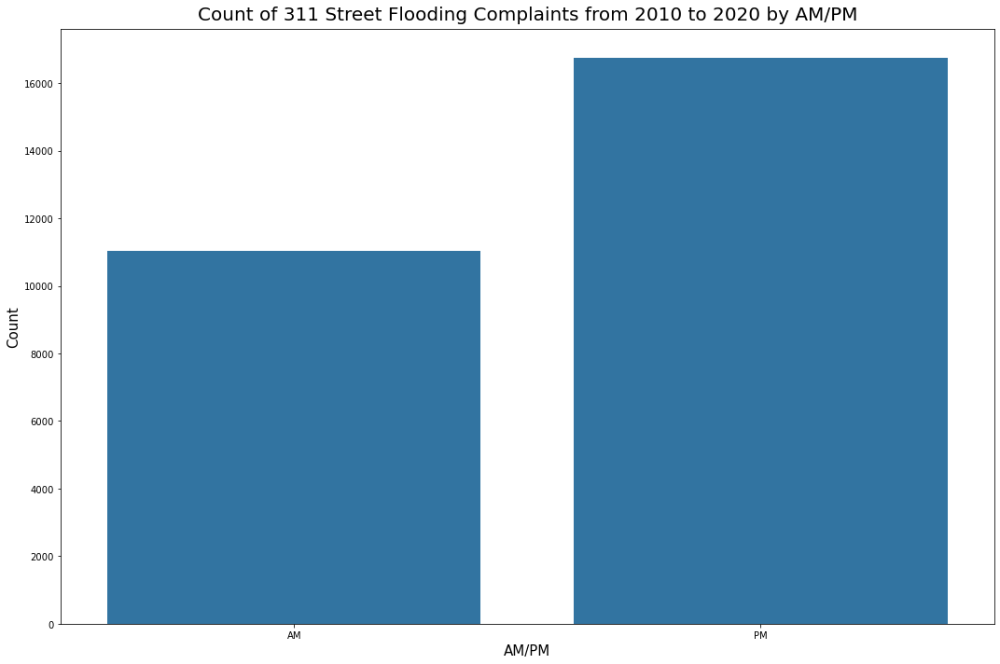

In [235]:
plt.figure(figsize=(15,10))

order = ['AM', 'PM']

sns.countplot(x=flooding_311['am_pm'],
              color='#1f77b4',
              order=order)

plt.title('Count of 311 Street Flooding Complaints from 2010 to 2020 by AM/PM', 
          fontsize=20,
          pad=10)
plt.xlabel('AM/PM', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:304: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
/Users/geribauer/anaconda3/li

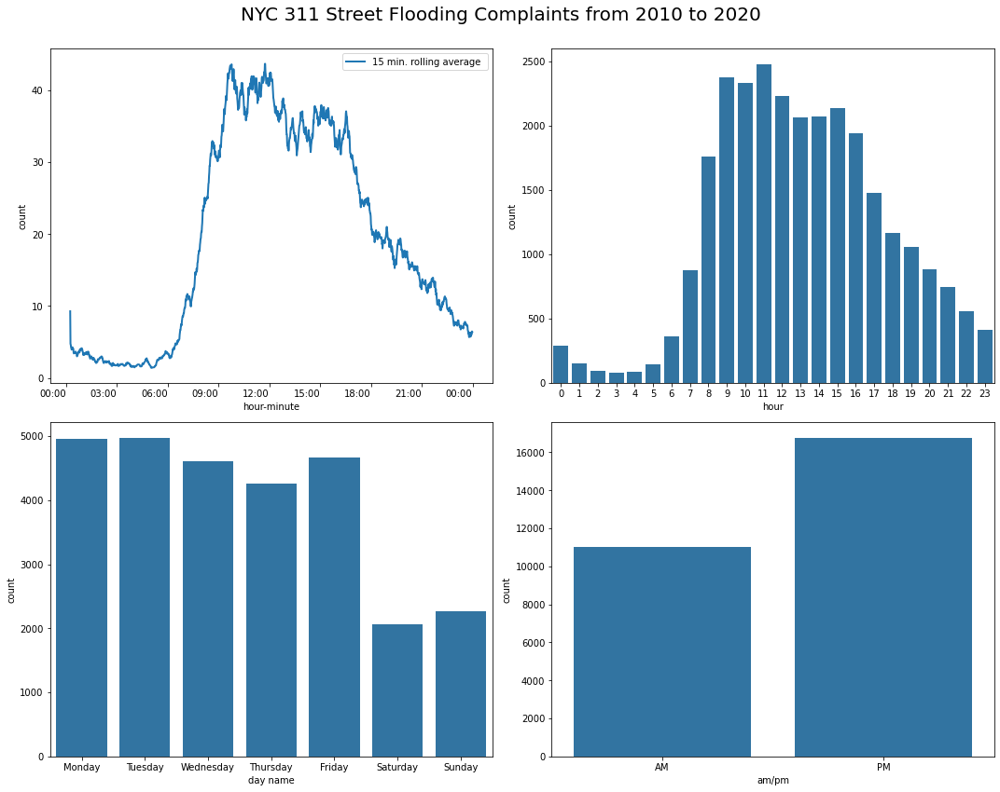

In [236]:
fig, axs = plt.subplots(2, 2, sharey=False, figsize=(15, 12))

myFmt = matplotlib.dates.DateFormatter('%H:%M')
axs[0,0].xaxis.set_major_formatter(myFmt)
flooding_time.plot(x='time',
                   y='count',
                   ax=axs[0,0], 
                   rot=0,
                   color='#1f77b4', 
                   linewidth=2,
                   legend=True,
                   label='15 min. rolling average ')
axs[0,0].set_ylabel('count') 
axs[0,0].set_xlabel('hour-minute')

sns.countplot(x=flooding_311['hour'],
              color='#1f77b4',
              ax=axs[0,1])

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.countplot(x=flooding_311['day_name'],
              color='#1f77b4',
              order=order,
              ax=axs[1,0])
axs[1,0].set_xlabel('day name')

order = ['AM', 'PM']
sns.countplot(x=flooding_311['am_pm'],
              color='#1f77b4',
              order=order,
              ax=axs[1,1])
axs[1,1].set_xlabel('am/pm')

fig.suptitle('NYC 311 Street Flooding Complaints from 2010 to 2020\n', fontsize=20) 

plt.tight_layout()
# plt.savefig('figures/sample.png')

# 7. Anomoly Detection

Count per Frequency Ranked

In [237]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour,time,am_pm
0,40140533,2018-08-29 08:35:00,2018-09-08T12:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,2018-08-01,2018-09-02,8,3,35,29,Wednesday,8,08:35:00,AM
1,40141782,2018-08-29 10:29:00,2018-08-30T09:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,29,Wednesday,10,10:29:00,AM
2,40143144,2018-08-29 18:36:00,2018-09-01T08:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,29,Wednesday,18,18:36:00,PM
3,40145580,2018-08-30 14:58:00,2018-09-04T11:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,30,Thursday,14,14:58:00,PM
4,40148030,2018-08-30 19:37:00,2018-09-05T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,30,Thursday,19,19:37:00,PM


In [238]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()

flooding_311_daily.resample('D').sum().sort_values(ascending=False).head(10).reset_index()

,year_month_day,unique_key
0,2017-05-05,247
1,2014-12-09,226
2,2014-04-30,189
3,2018-04-16,163
4,2013-05-08,162
5,2016-11-15,151
6,2016-02-08,150
7,2018-11-25,142
8,2020-07-10,131
9,2010-10-01,130


In [239]:
flooding_311_daily.resample('D').sum().sort_values(ascending=False).head(10).reset_index().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   year_month_day  10 non-null     datetime64[ns]
 1   unique_key      10 non-null     int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 288.0 bytes


In [240]:
daily = flooding_311_daily.resample('D').sum().sort_values(ascending=False).head(10).reset_index()
daily.rename(columns={"unique_key": "count"}, 
             inplace=True)

daily['date_formatted'] = daily['year_month_day'].dt.strftime('%Y-%m-%d')

daily.head(10)

,year_month_day,count,date_formatted
0,2017-05-05,247,2017-05-05
1,2014-12-09,226,2014-12-09
2,2014-04-30,189,2014-04-30
3,2018-04-16,163,2018-04-16
4,2013-05-08,162,2013-05-08
5,2016-11-15,151,2016-11-15
6,2016-02-08,150,2016-02-08
7,2018-11-25,142,2018-11-25
8,2020-07-10,131,2020-07-10
9,2010-10-01,130,2010-10-01


In [241]:
daily.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   year_month_day  10 non-null     datetime64[ns]
 1   count           10 non-null     int64         
 2   date_formatted  10 non-null     object        
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 368.0+ bytes


In [242]:
weekly = flooding_311_daily.resample('W').sum().sort_values(ascending=False).head(10).reset_index()
weekly.rename(columns={"unique_key": "count"}, 
              inplace=True)

weekly['date_formatted'] = weekly.year_month_day.astype(str)

weekly.head(10)

,year_month_day,count,date_formatted
0,2014-05-04,336,2014-05-04
1,2014-12-14,276,2014-12-14
2,2013-05-12,274,2013-05-12
3,2017-05-07,264,2017-05-07
4,2019-07-28,231,2019-07-28
5,2016-02-14,225,2016-02-14
6,2014-02-16,222,2014-02-16
7,2010-10-03,220,2010-10-03
8,2018-03-04,217,2018-03-04
9,2019-12-15,217,2019-12-15


In [243]:
# sanity check - checking when the weekly frequency stops (Sunday?)

In [244]:
flooding_311_daily.resample('D').sum().head(10).reset_index()

,year_month_day,unique_key
0,2010-01-02,3
1,2010-01-03,0
2,2010-01-04,1
3,2010-01-05,1
4,2010-01-06,4
5,2010-01-07,3
6,2010-01-08,1
7,2010-01-09,1
8,2010-01-10,0
9,2010-01-11,0


In [245]:
weekly_sanity_check  = flooding_311_daily.resample('W').sum().head(10).reset_index()

weekly_sanity_check['day_name'] = weekly_sanity_check.year_month_day.dt.day_name()

weekly_sanity_check.head()

,year_month_day,unique_key,day_name
0,2010-01-03,3,Sunday
1,2010-01-10,11,Sunday
2,2010-01-17,8,Sunday
3,2010-01-24,13,Sunday
4,2010-01-31,73,Sunday


In [246]:
# sanity check - approved. Bins weekly from Monday to Sunday

In [247]:
monthly = flooding_311_daily.resample('MS').sum().sort_values(ascending=False).head(10).reset_index()
monthly.rename(columns={"unique_key": "count"}, 
               inplace=True)

monthly['date_formatted'] = monthly['year_month_day'].dt.strftime('%Y-%b')

monthly.head()

,year_month_day,count,date_formatted
0,2018-11-01,710,2018-Nov
1,2017-05-01,524,2017-May
2,2011-08-01,497,2011-Aug
3,2016-02-01,490,2016-Feb
4,2010-03-01,489,2010-Mar


In [248]:
yearly = flooding_311_daily.resample('YS').sum().sort_values(ascending=False).head(10).reset_index()
yearly.rename(columns={"unique_key": "count"}, 
              inplace=True)

yearly['date_formatted'] = yearly['year_month_day'].dt.strftime('%Y')

yearly.head()

,year_month_day,count,date_formatted
0,2018-01-01,4138,2018
1,2019-01-01,3413,2019
2,2011-01-01,2641,2011
3,2017-01-01,2532,2017
4,2010-01-01,2531,2010


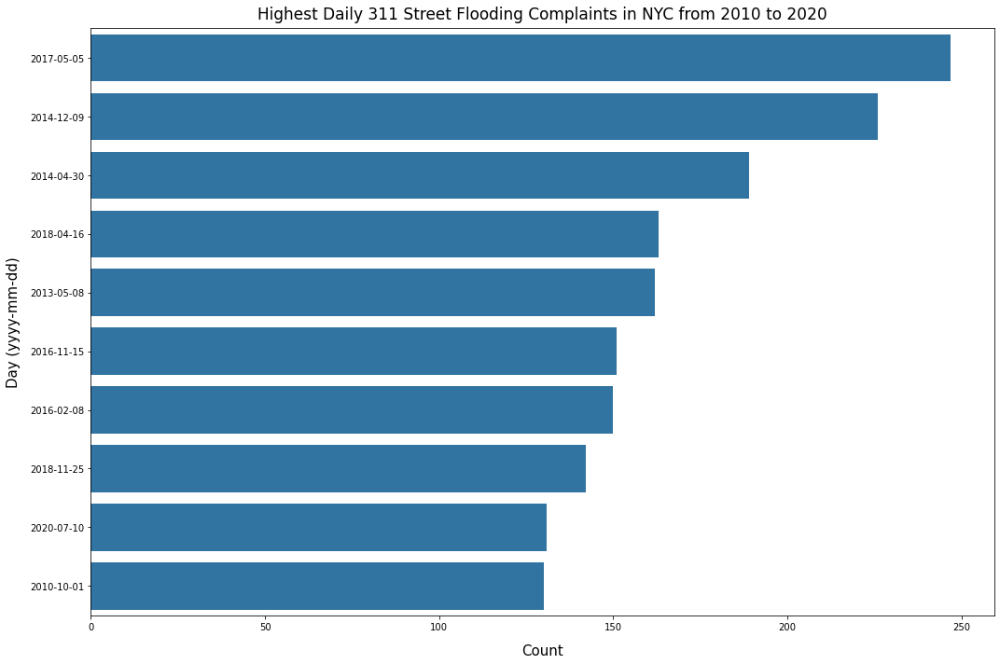

In [249]:
plt.figure(figsize=(15,10))

sns.barplot(data=daily,
            y='date_formatted',
            x='count',
            color='#1f77b4')

plt.title('Highest Daily 311 Street Flooding Complaints in NYC from 2010 to 2020', 
          fontsize=17,
          pad=10)
plt.xlabel('Count', fontsize=15, labelpad=13)
plt.ylabel('Day (yyyy-mm-dd)', fontsize=15, labelpad=10)
plt.tight_layout()

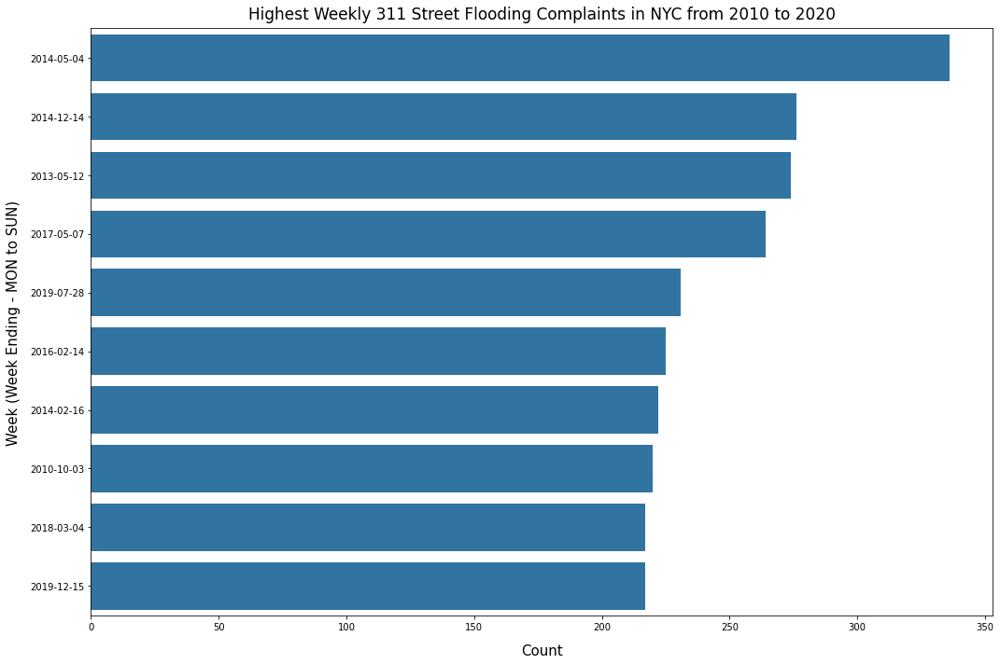

In [250]:
plt.figure(figsize=(15,10))

sns.barplot(data=weekly,
            y='date_formatted',
            x='count',
            color='#1f77b4')

plt.title('Highest Weekly 311 Street Flooding Complaints in NYC from 2010 to 2020', 
          fontsize=17,
          pad=10)
plt.xlabel('Count', fontsize=15, labelpad=13)
plt.ylabel('Week (Week Ending - MON to SUN)', fontsize=15, labelpad=10)
plt.tight_layout()

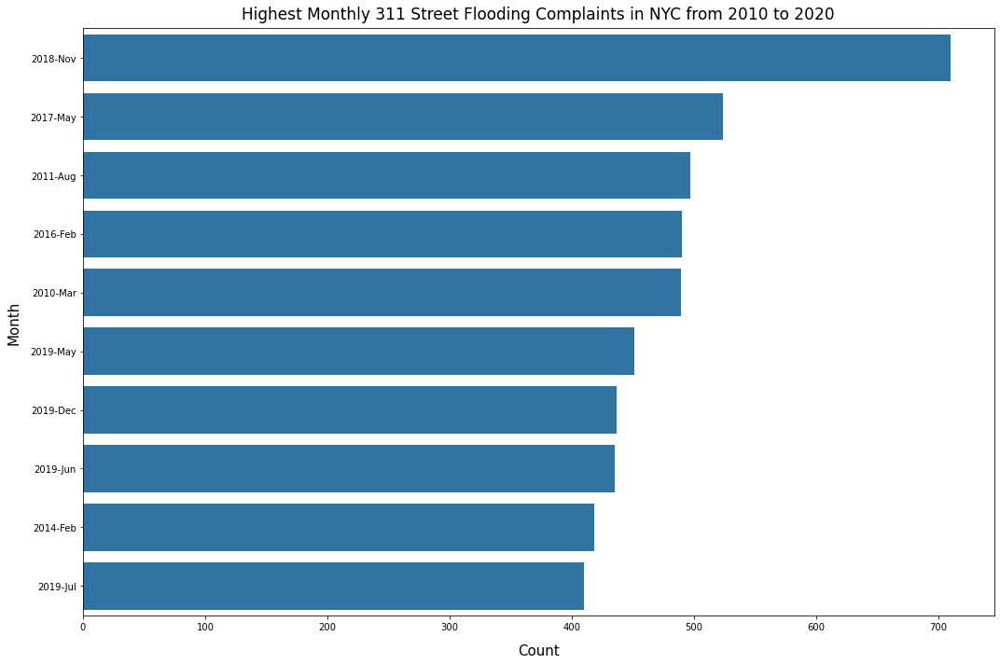

In [251]:
plt.figure(figsize=(15,10))

sns.barplot(data=monthly,
            y='date_formatted',
            x='count',
            color='#1f77b4')

plt.title('Highest Monthly 311 Street Flooding Complaints in NYC from 2010 to 2020', 
          fontsize=17,
          pad=10)
plt.xlabel('Count', fontsize=15, labelpad=13)
plt.ylabel('Month', fontsize=15, labelpad=10)
plt.tight_layout()

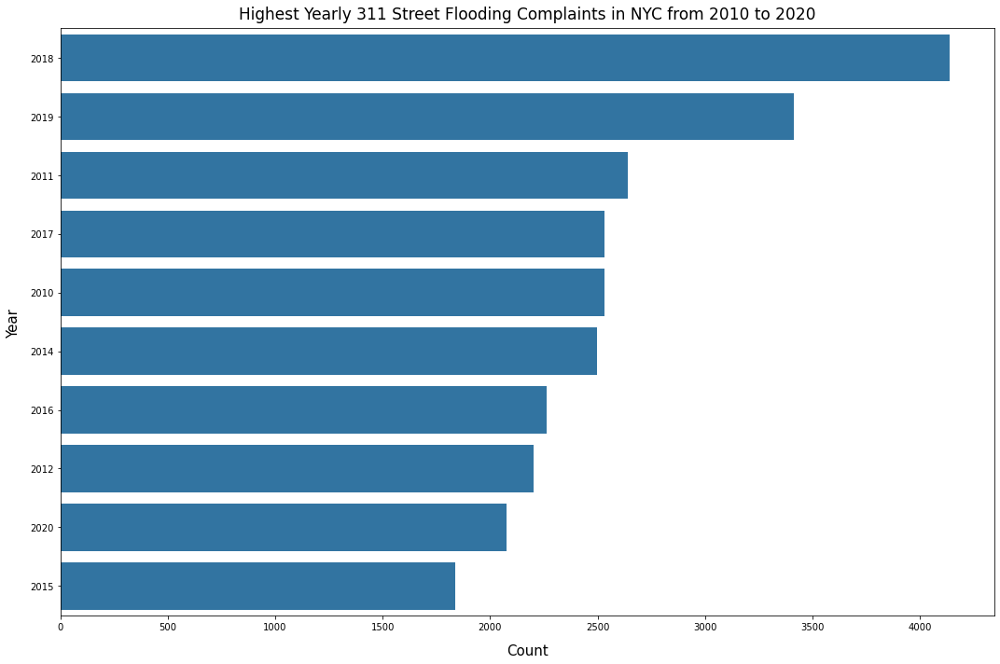

In [252]:
plt.figure(figsize=(15,10))

sns.barplot(data=yearly,
            y='date_formatted',
            x='count',
            color='#1f77b4')

plt.title('Highest Yearly 311 Street Flooding Complaints in NYC from 2010 to 2020', 
          fontsize=17,
          pad=10)
plt.xlabel('Count', fontsize=15, labelpad=13)
plt.ylabel('Year', fontsize=15, labelpad=10)
plt.tight_layout()

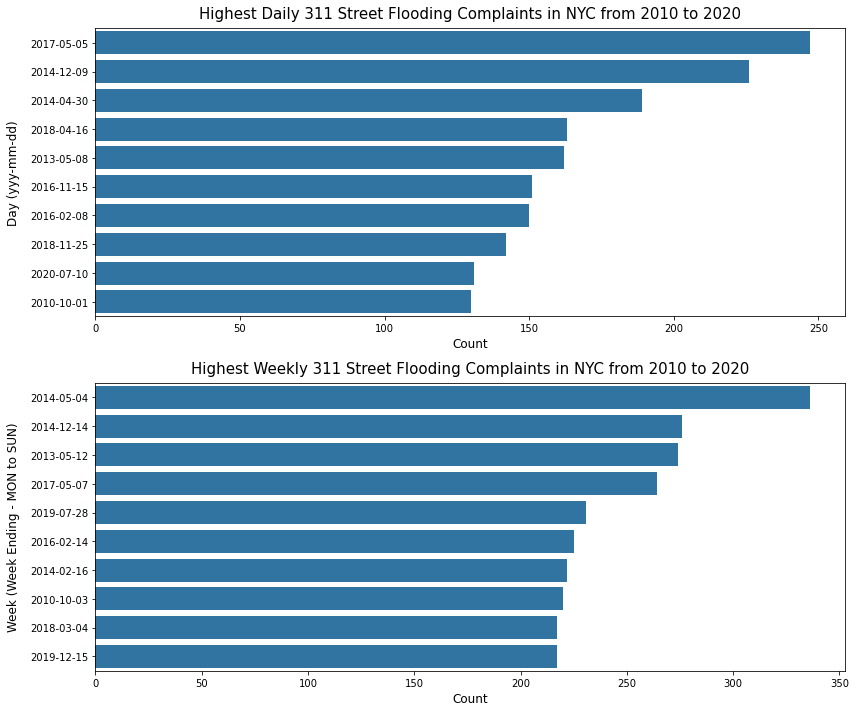

In [253]:
fig, axs = plt.subplots(2, 1, sharey=False, figsize=(12, 10))

# first plot
sns.barplot(data=daily,
            y='date_formatted',
            x='count',
            color='#1f77b4',
            ax=axs[0])

axs[0].set_title('Highest Daily 311 Street Flooding Complaints in NYC from 2010 to 2020', 
                  fontsize=15,
                  pad=10)
axs[0].set_xlabel('Count', fontsize=12)
axs[0].set_ylabel('Day (yyy-mm-dd)', fontsize=12, labelpad=10)

# second plot
sns.barplot(data=weekly,
            y='date_formatted',
            x='count',
            color='#1f77b4',
            ax=axs[1])

axs[1].set_title('Highest Weekly 311 Street Flooding Complaints in NYC from 2010 to 2020', 
                  fontsize=15,
                  pad=10)
axs[1].set_xlabel('Count', fontsize=12)
axs[1].set_ylabel('Week (Week Ending - MON to SUN)', fontsize=12, labelpad=10)

plt.tight_layout()

# 8. Manually Formatting Date Tick Labels

In [254]:
flooding_311_daily

year_month_day
2010-01-02    3
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
             ..
2020-12-20    3
2020-12-21    5
2020-12-22    3
2020-12-23    2
2020-12-24    5
Name: unique_key, Length: 3466, dtype: int64

In [255]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily = flooding_311_daily.resample('D').sum()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily.head(10)

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
2010-01-08    1
2010-01-09    1
2010-01-10    0
2010-01-11    0
Freq: D, Name: count, dtype: int64

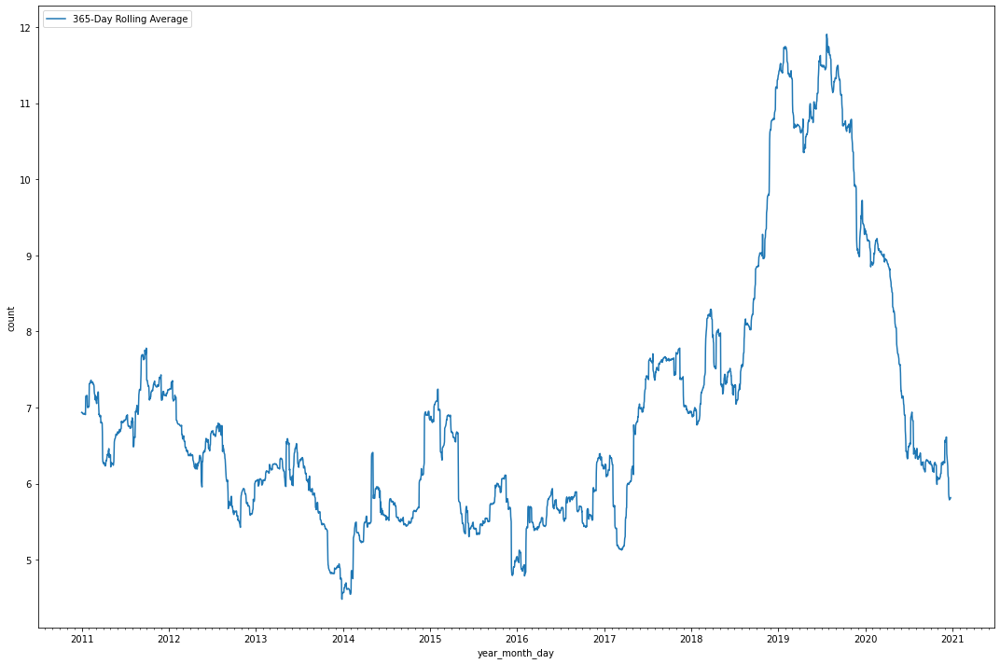

In [256]:
fig, ax = plt.subplots(figsize=(15,10))

years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
years_fmt = mdates.DateFormatter('%Y')

# format the ticks
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)
ax.xaxis.set_minor_locator(months)

sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax)

plt.legend(loc=2)
plt.tight_layout()
plt.savefig('figures/x_axis_label_1.png')

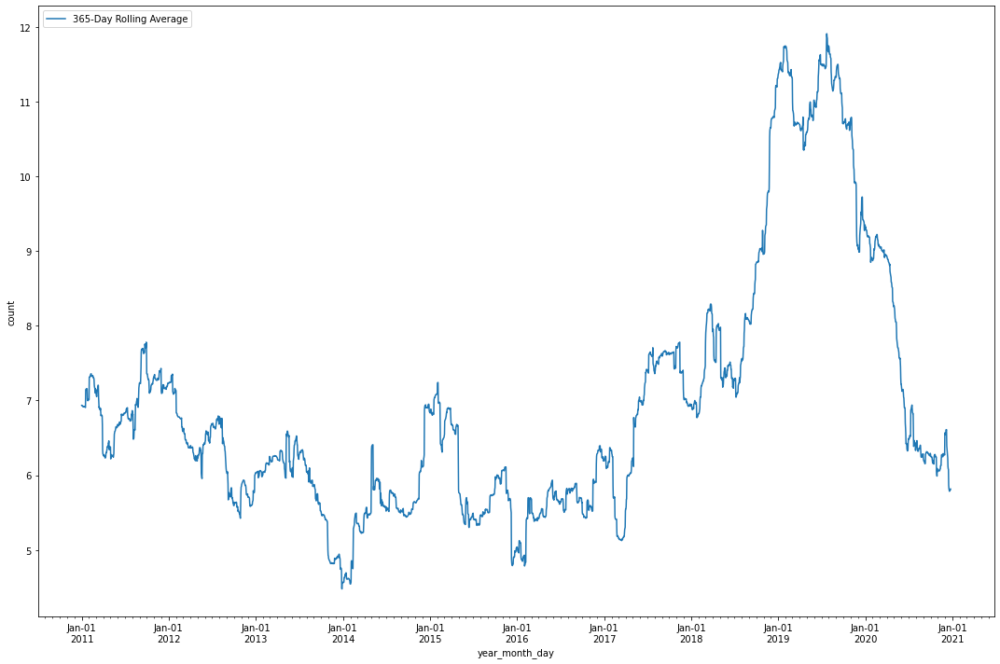

In [257]:
fig, ax = plt.subplots(figsize=(15,10))

years = mdates.YearLocator() # every year
months = mdates.MonthLocator() # every month
years_fmt = mdates.DateFormatter('%b-%d\n%Y')

# format the ticks
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)
ax.xaxis.set_minor_locator(months)

sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax)

plt.legend(loc=2)
plt.tight_layout()
plt.savefig('figures/x_axis_label_2.png')

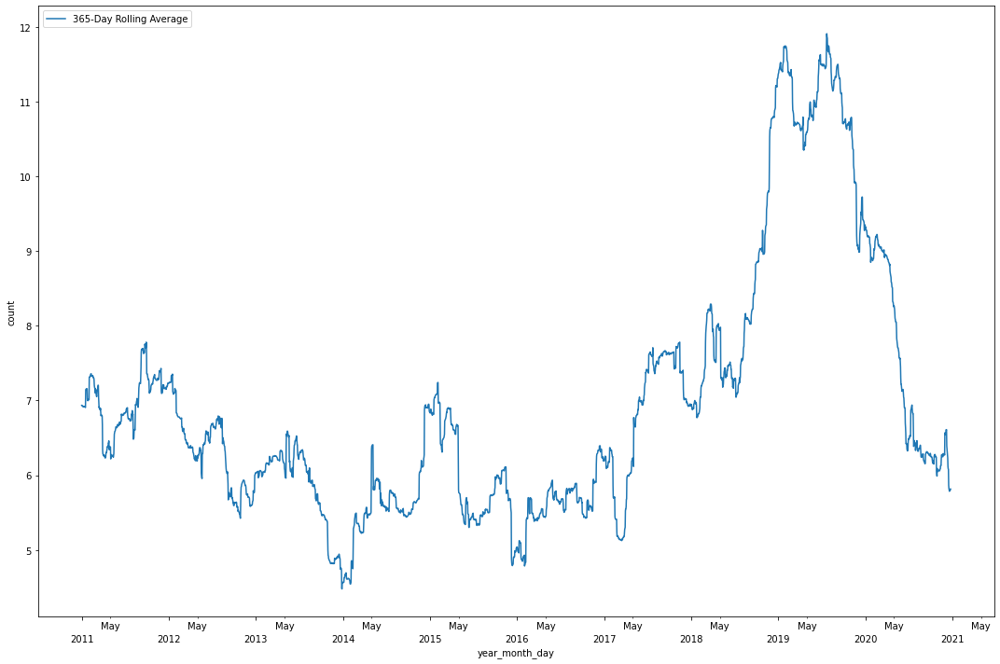

In [258]:
fig, ax = plt.subplots(figsize=(15,10))

years = mdates.YearLocator() # every year
months = mdates.MonthLocator(5) # display on May (5)
monthsFmt = mdates.DateFormatter('%b') 
yearsFmt = mdates.DateFormatter('\n%Y')

ax.xaxis.set_minor_locator(months)
ax.xaxis.set_minor_formatter(monthsFmt)
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(yearsFmt)

sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax)

plt.legend(loc=2)
plt.tight_layout()
plt.savefig('figures/x_axis_label_3.png')

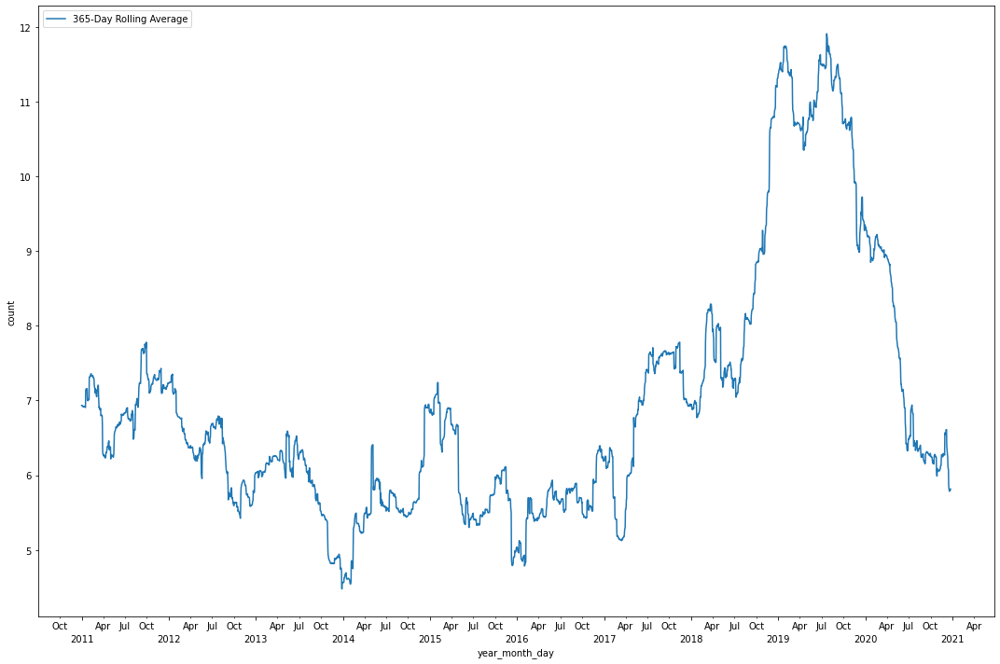

In [259]:
fig, ax = plt.subplots(figsize=(15,10))

years = mdates.YearLocator()  # every year
months = mdates.MonthLocator(interval=3) # every 3 months
monthsFmt = mdates.DateFormatter('%b') 
yearsFmt = mdates.DateFormatter('\n%Y')

ax.xaxis.set_minor_locator(months)
ax.xaxis.set_minor_formatter(monthsFmt)
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(yearsFmt)

sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax)

plt.legend(loc=2)
plt.tight_layout()
plt.savefig('figures/x_axis_label_4.png')

# 9. Timedelta of Complaints

In [260]:
flooding_311.closed_date = pd.to_datetime(flooding_311.closed_date)

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour,time,am_pm
0,40140533,2018-08-29 08:35:00,2018-09-08 12:40:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,2018-08-01,2018-09-02,8,3,35,29,Wednesday,8,08:35:00,AM
1,40141782,2018-08-29 10:29:00,2018-08-30 09:40:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,29,Wednesday,10,10:29:00,AM
2,40143144,2018-08-29 18:36:00,2018-09-01 08:40:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,29,Wednesday,18,18:36:00,PM
3,40145580,2018-08-30 14:58:00,2018-09-04 11:25:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,30,Thursday,14,14:58:00,PM
4,40148030,2018-08-30 19:37:00,2018-09-05 08:30:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,2018-08-01,2018-09-02,8,3,35,30,Thursday,19,19:37:00,PM


In [261]:
flooding_311.iloc[:, :3].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27799 entries, 0 to 27816
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   unique_key    27799 non-null  int64         
 1   created_date  27799 non-null  datetime64[ns]
 2   closed_date   27786 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1)
memory usage: 2.1 MB


In [262]:
flooding_311['complaint_duration'] = flooding_311.closed_date - flooding_311.created_date

flooding_311[['created_date', 'closed_date', 'complaint_duration']].head(10)

,created_date,closed_date,complaint_duration
0,2018-08-29 08:35:00,2018-09-08 12:40:00,10 days 04:05:00
1,2018-08-29 10:29:00,2018-08-30 09:40:00,0 days 23:11:00
2,2018-08-29 18:36:00,2018-09-01 08:40:00,2 days 14:04:00
3,2018-08-30 14:58:00,2018-09-04 11:25:00,4 days 20:27:00
4,2018-08-30 19:37:00,2018-09-05 08:30:00,5 days 12:53:00
5,2018-08-30 18:26:00,2018-08-31 13:35:00,0 days 19:09:00
6,2018-08-30 19:06:00,2018-08-30 19:45:00,0 days 00:39:00
7,2018-08-31 23:11:00,2018-09-01 07:35:00,0 days 08:24:00
8,2018-08-31 17:34:00,2018-09-01 08:45:00,0 days 15:11:00
9,2018-09-01 14:25:00,2018-09-04 12:40:00,2 days 22:15:00


In [263]:
flooding_311[['created_date', 'closed_date', 'complaint_duration']].tail(10)

,created_date,closed_date,complaint_duration
27807,2018-08-24 16:31:00,2018-08-25 10:40:00,0 days 18:09:00
27808,2018-08-24 07:59:00,2018-08-24 13:50:00,0 days 05:51:00
27809,2018-08-24 13:43:00,2018-08-24 19:15:00,0 days 05:32:00
27810,2018-08-24 14:44:00,2018-08-27 10:30:00,2 days 19:46:00
27811,2018-08-25 10:41:00,2018-08-26 09:00:00,0 days 22:19:00
27812,2018-08-27 13:20:00,2018-08-28 08:30:00,0 days 19:10:00
27813,2018-08-28 23:04:00,2018-09-17 09:20:00,19 days 10:16:00
27814,2018-08-28 16:15:00,2018-09-13 11:10:00,15 days 18:55:00
27815,2018-08-28 23:17:00,2018-08-29 11:10:00,0 days 11:53:00
27816,2018-08-29 13:10:00,2018-09-17 10:20:00,18 days 21:10:00


In [264]:
flooding_311[['complaint_duration']].describe()

,complaint_duration
count,27786
mean,2 days 14:39:56.087238
std,13 days 12:39:06.568105
min,-10 days +16:41:00
25%,0 days 03:02:00
50%,0 days 17:12:00
75%,1 days 18:42:00
max,709 days 10:34:00


In [265]:
flooding_311.sort_values(by='complaint_duration', 
                         ascending=True)[['created_date', 
                                           'closed_date', 
                                           'complaint_duration']].head()

,created_date,closed_date,complaint_duration
9041,2020-08-12 16:39:00,2020-08-03 09:20:00,-10 days +16:41:00
8520,2020-03-25 10:52:00,2020-03-20 08:45:00,-6 days +21:53:00
5021,2020-06-12 11:39:00,2020-06-10 10:20:00,-3 days +22:41:00
8100,2020-07-13 15:18:00,2020-07-12 09:10:00,-2 days +17:52:00
17350,2013-11-06 12:23:00,2013-11-06 12:23:00,0 days 00:00:00


In [266]:
flooding_311.sort_values(by='complaint_duration', 
                         ascending=False)[['created_date', 
                                           'closed_date', 
                                           'complaint_duration']].head()

,created_date,closed_date,complaint_duration
8530,2017-01-24 08:11:00,2019-01-03 18:45:00,709 days 10:34:00
8367,2019-01-20 18:14:00,2020-08-12 11:00:00,569 days 16:46:00
9556,2018-11-16 15:30:00,2020-03-19 11:20:00,488 days 19:50:00
1450,2019-01-11 12:45:00,2020-02-23 13:30:00,408 days 00:45:00
1536,2019-01-28 16:19:00,2020-02-26 09:15:00,393 days 16:56:00


In [267]:
flooding_311['complaint_duration_days'] = flooding_311['complaint_duration'].dt.days
flooding_311['complaint_duration_seconds'] = flooding_311['complaint_duration'].dt.seconds
flooding_311['complaint_duration_hours'] = flooding_311['complaint_duration_days'] * 24 + flooding_311['complaint_duration_seconds'] / 3600

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,week_of_year,day,day_name,hour,time,am_pm,complaint_duration,complaint_duration_days,complaint_duration_seconds,complaint_duration_hours
0,40140533,2018-08-29 08:35:00,2018-09-08 12:40:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,35,29,Wednesday,8,08:35:00,AM,10 days 04:05:00,10.00,14700.00,244.08
1,40141782,2018-08-29 10:29:00,2018-08-30 09:40:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11235.00,NaN,NaN,...,35,29,Wednesday,10,10:29:00,AM,0 days 23:11:00,0.00,83460.00,23.18
2,40143144,2018-08-29 18:36:00,2018-09-01 08:40:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10458.00,NaN,NaN,...,35,29,Wednesday,18,18:36:00,PM,2 days 14:04:00,2.00,50640.00,62.07
3,40145580,2018-08-30 14:58:00,2018-09-04 11:25:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11204.00,NaN,NaN,...,35,30,Thursday,14,14:58:00,PM,4 days 20:27:00,4.00,73620.00,116.45
4,40148030,2018-08-30 19:37:00,2018-09-05 08:30:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,NaN,NaN,...,35,30,Thursday,19,19:37:00,PM,5 days 12:53:00,5.00,46380.00,132.88


In [268]:
flooding_311[['complaint_duration_days', 'complaint_duration_hours']].describe()

,complaint_duration_days,complaint_duration_hours
count,27786.00,27786.00
mean,2.20,62.67
std,13.50,324.65
min,-10.00,-223.32
25%,0.00,3.03
50%,0.00,17.20
75%,1.00,42.70
max,709.00,17026.57


In [269]:
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27799 entries, 0 to 27816
Data columns (total 46 columns):
 #   Column                          Non-Null Count  Dtype          
---  ------                          --------------  -----          
 0   unique_key                      27799 non-null  int64          
 1   created_date                    27799 non-null  datetime64[ns] 
 2   closed_date                     27786 non-null  datetime64[ns] 
 3   agency                          27799 non-null  object         
 4   agency_name                     27799 non-null  object         
 5   complaint_type                  27799 non-null  object         
 6   descriptor                      27799 non-null  object         
 7   incident_zip                    26947 non-null  float64        
 8   intersection_street_1           10064 non-null  object         
 9   intersection_street_2           10064 non-null  object         
 10  address_type                    27796 non-null  object    

In [270]:
gdf = gpd.GeoDataFrame(flooding_311, 
                       geometry=gpd.points_from_xy(flooding_311.x_coordinate_state_plane, 
                                                   flooding_311.y_coordinate_state_plane))

gdf.set_crs(epsg=2263, inplace=True)
gdf.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [271]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588...."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339...."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192..."


In [272]:
flooding_complaints_with_nta = gpd.sjoin(gdf, 
                                         nta_shape.to_crs(2263), 
                                         how="inner", 
                                         op='within')

In [273]:
flooding_complaints_with_nta.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,complaint_duration_hours,geometry,index_right,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code
0,40140533,2018-08-29 08:35:00,2018-09-08 12:40:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 206 STREET,9 AVENUE,...,244.08,POINT (1007054.000 253710.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
13,40203741,2018-09-06 18:34:00,2018-09-08 12:25:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,9 AVENUE,WEST 220 STREET,...,41.85,POINT (1008802.000 256858.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
1971,42223076,2019-04-14 10:33:00,2019-04-17 11:00:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,NaN,NaN,...,72.45,POINT (1006343.000 254787.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
1973,42224479,2019-04-14 10:36:00,2019-04-17 11:25:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,NaN,NaN,...,72.82,POINT (1006135.000 254606.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1
5920,20549194,2011-06-01 07:59:00,2011-06-03 16:00:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10034.00,WEST 207 STREET,POST AVENUE,...,56.02,POINT (1006554.000 254361.000),80,MN01,17732688.6953,061,Marble Hill-Inwood,31844.4094213,Manhattan,1


In [274]:
flooding_complaints_with_nta = flooding_complaints_with_nta.groupby('ntaname').agg({'complaint_duration_hours': 
                                                                                    ['mean', 'median']}).reset_index()

flooding_complaints_with_nta.head()

ntaname complaint_duration_hours       
                                                                  mean median
0                                     Airport                   137.94   3.17
1                     Allerton-Pelham Gardens                    14.23   4.63
2  Annadale-Huguenot-Prince's Bay-Eltingville                    40.71  19.82
3                               Arden Heights                    30.91  20.12
4                                     Astoria                   156.64  16.12

In [275]:
flooding_complaints_with_nta = nta_shape.merge(flooding_complaints_with_nta, 
                                               left_on='ntaname', 
                                               right_on='ntaname')

flooding_complaints_with_nta.head()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/core/reshape/merge.py:618: UserWarning: merging between different levels can give an unintended result (1 levels on the left, 2 on the right)
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:3935: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,"(complaint_duration_hours, mean)","(complaint_duration_hours, median)"
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",51.91,18.77
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",62.57,15.13
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",73.71,14.98
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....",30.73,20.59
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...",46.26,20.13


In [276]:
flooding_complaints_with_nta.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 194 entries, 0 to 193
Data columns (total 10 columns):
 #   Column                              Non-Null Count  Dtype   
---  ------                              --------------  -----   
 0   ntacode                             194 non-null    object  
 1   shape_area                          194 non-null    object  
 2   county_fips                         194 non-null    object  
 3   ntaname                             194 non-null    object  
 4   shape_leng                          194 non-null    object  
 5   boro_name                           194 non-null    object  
 6   boro_code                           194 non-null    object  
 7   geometry                            194 non-null    geometry
 8   (complaint_duration_hours, mean)    194 non-null    float64 
 9   (complaint_duration_hours, median)  194 non-null    float64 
dtypes: float64(2), geometry(1), object(7)
memory usage: 16.7+ KB


In [277]:
flooding_complaints_with_nta.columns

Index([                             'ntacode',
                                 'shape_area',
                                'county_fips',
                                    'ntaname',
                                 'shape_leng',
                                  'boro_name',
                                  'boro_code',
                                   'geometry',
         ('complaint_duration_hours', 'mean'),
       ('complaint_duration_hours', 'median')],
      dtype='object')

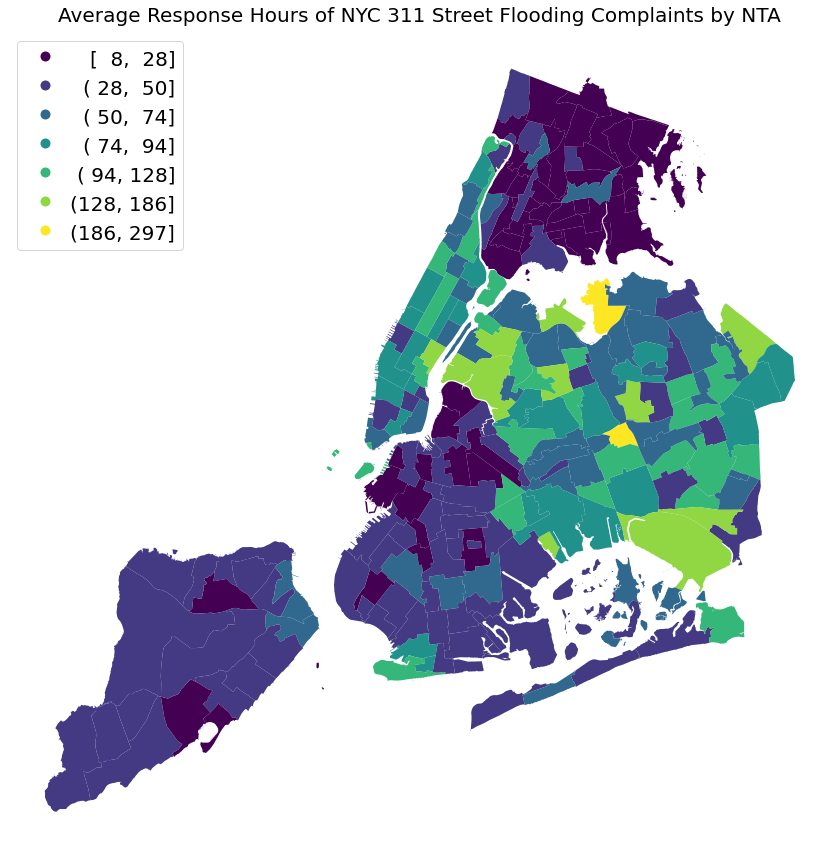

In [278]:
fig, ax = plt.subplots(figsize=(12,12))

flooding_complaints_with_nta.plot(column=('complaint_duration_hours', 'mean'), 
                                  cmap='viridis',
                                  ax=ax, 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.0f}",
                                              'fontsize': "20"})
leg = ax.get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(150)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

ax.set_title('Average Response Hours of NYC 311 Street Flooding Complaints by NTA', 
             fontsize=20, 
             pad=10)

ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

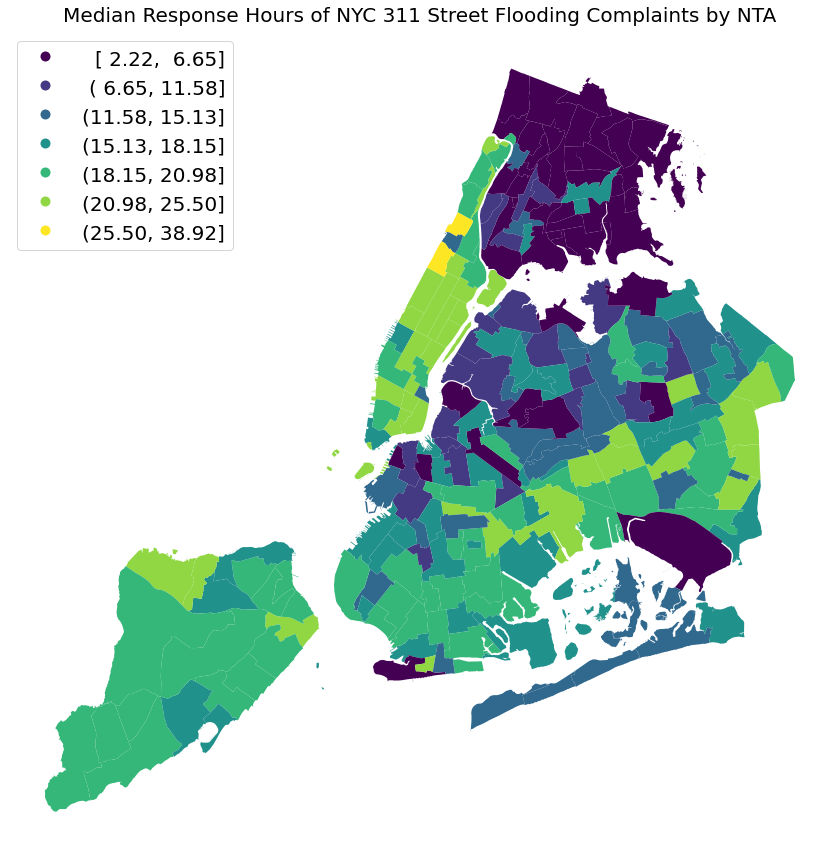

In [279]:
fig, ax = plt.subplots(figsize=(12,12))

flooding_complaints_with_nta.plot(column=('complaint_duration_hours', 'median'), 
                                  cmap='viridis',
                                  ax=ax, 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.2f}",
                                              'fontsize': "20"})
leg = ax.get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(200)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

ax.set_title('Median Response Hours of NYC 311 Street Flooding Complaints by NTA', 
             fontsize=20, 
             pad=10)

ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

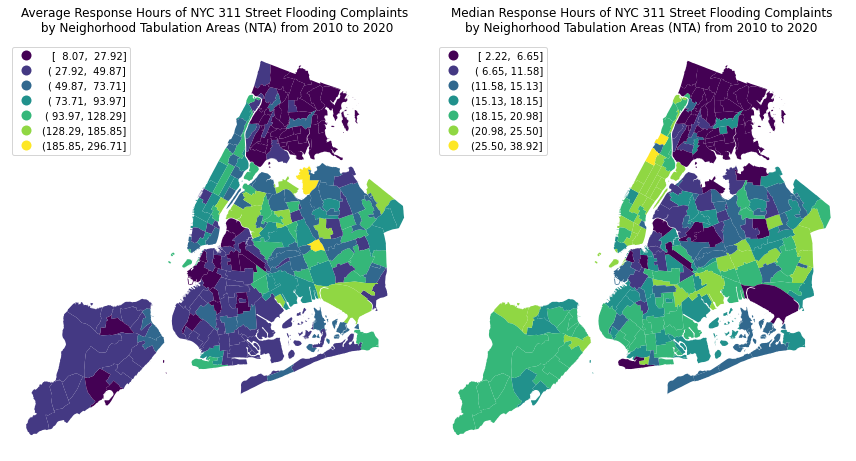

In [280]:
fig, axs = plt.subplots(1, 2, sharey=False, figsize=(12, 12))

flooding_complaints_with_nta.plot(column=('complaint_duration_hours', 'mean'), 
                                  cmap='viridis',
                                  ax=axs[0], 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.2f}",
                                              'fontsize': "10"})
leg = axs[0].get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(110)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

axs[0].set_title('Average Response Hours of NYC 311 Street Flooding Complaints\n by Neighorhood Tabulation Areas (NTA) from 2010 to 2020', 
             fontsize=12, 
             pad=10)

axs[0].set_aspect('equal', 'box')
axs[0].axis('off')



flooding_complaints_with_nta.plot(column=('complaint_duration_hours', 'median'), 
                                  cmap='viridis',
                                  ax=axs[1], 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.2f}",
                                              'fontsize': "10"})
leg = axs[1].get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(100)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

axs[1].set_title('Median Response Hours of NYC 311 Street Flooding Complaints\nby Neighorhood Tabulation Areas (NTA) from 2010 to 2020', 
             fontsize=12, 
             pad=10)

axs[1].set_aspect('equal', 'box')
axs[1].axis('off')

plt.tight_layout()

# 10. Conclusion